In [2]:
# we need to install packages that are not standard on the colab environment
# !pip install bumps==0.7.15 sasmodels
# !pip install git+https://github.com/SasView/sasview
# !pip install tol-colors

# import sasmodels
import sasmodels
import sasmodels.core
import sasmodels.data
import sasmodels.bumps_model

# import bumps
import bumps
import bumps.fitters
import bumps.names
import bumps.fitproblem

# import sasview
import sas

import numpy as np
import os
import pandas as pd
import periodictable
import periodictable.nsf
# import plotly.express as px # plotting
import re
import sys
import tol_colors as tc # colorblind safe color palettes
import xarray as xr
xr.set_options(display_expand_data=False)

"""
import matplotlib.pyplot and set custom default settings for plots
"""
import matplotlib.pyplot as plt
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('svg')
plt.rc('font', size=14) # default fontsize
plt.rc('axes', titlesize=16)
plt.rc('axes', labelsize=16)
plt.rc('xtick', labelsize=14)
plt.rc('ytick', labelsize=14)
plt.rc('legend', fontsize=14)
plt.rc('legend', title_fontsize=14)
plt.rc('figure', titlesize=18)
plt.rc("figure", figsize=(5,5))
plt.rc("lines", linewidth=3)


# use colorblind safe colors:
plt.rc('axes', prop_cycle=plt.cycler('color', list(tc.tol_cset('muted'))))
# plt.cm.register_cmap('tc_iridescent', tc.tol_cmap('iridescent'))
# plt.rc('image', cmap='tc_iridescent')

%config InlineBackend.figure_format = 'retina'


No config file found - one will be created when sasview exits
/var/folders/q1/7g1h_wsj01s0ld1htcyvfvpc002_7m/T/ipykernel_87087/3797879693.py:38: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats('svg')


In [3]:
sasmodels.core.list_models()

['adsorbed_layer',
 'barbell',
 'bcc_paracrystal',
 'be_polyelectrolyte',
 'binary_hard_sphere',
 'broad_peak',
 'capped_cylinder',
 'core_multi_shell',
 'core_shell_bicelle',
 'core_shell_bicelle_elliptical',
 'core_shell_bicelle_elliptical_belt_rough',
 'core_shell_cylinder',
 'core_shell_ellipsoid',
 'core_shell_parallelepiped',
 'core_shell_sphere',
 'correlation_length',
 'cylinder',
 'dab',
 'ellipsoid',
 'elliptical_cylinder',
 'fcc_paracrystal',
 'flexible_cylinder',
 'flexible_cylinder_elliptical',
 'fractal',
 'fractal_core_shell',
 'fuzzy_sphere',
 'gauss_lorentz_gel',
 'gaussian_peak',
 'gel_fit',
 'guinier',
 'guinier_porod',
 'hardsphere',
 'hayter_msa',
 'hollow_cylinder',
 'hollow_rectangular_prism',
 'hollow_rectangular_prism_thin_walls',
 'lamellar',
 'lamellar_hg',
 'lamellar_hg_stack_caille',
 'lamellar_stack_caille',
 'lamellar_stack_paracrystal',
 'line',
 'linear_pearls',
 'lorentz',
 'mass_fractal',
 'mass_surface_fractal',
 'mono_gauss_coil',
 'multilayer_vesic

In [4]:
raspberry_kernel = sasmodels.core.load_model("raspberry")
powerlaw1_kernel = sasmodels.core.load_model("power_law")
powerlaw2_kernel = sasmodels.core.load_model("power_law")
sphere_kernel = sasmodels.core.load_model("sphere")

In [5]:
x = sasmodels.core.load_model('polymer_micelle')
print(x.info.description)


This model provides the form factor, $P(q)$, for a micelle with a spherical
core and Gaussian polymer chains attached to the surface, thus may be applied
to block copolymer micelles. To work well the Gaussian chains must be much
smaller than the core, which is often not the case.  Please study the
reference to Pedersen and full documentation carefully.
    


In [6]:
q_min = 1e-4
q_max = 1
num_q = 10000
q = np.logspace(np.log10(q_min), np.log10(q_max), num_q)
data = sasmodels.data.empty_data1D(q)

In [7]:
call_kernel = sasmodels.direct_model.DirectModel(data, raspberry_kernel)

In [8]:
Is = []
rlarge = [500,1000,2000,4000]
for i in rlarge:
    Iq = call_kernel(
        radius_lg = i,
        radius_sm = 500,
        surface_fraction=0.4,
        sld_lg = -0.4,
        sld_sm = 1,
        sld_solvent = 6,
        radius_lg_pd = 0.5,
        radius_lg_pd_type = 'gaussian',
        radius_lg_pd_nsigma = 3
    )
    Is.append(Iq)

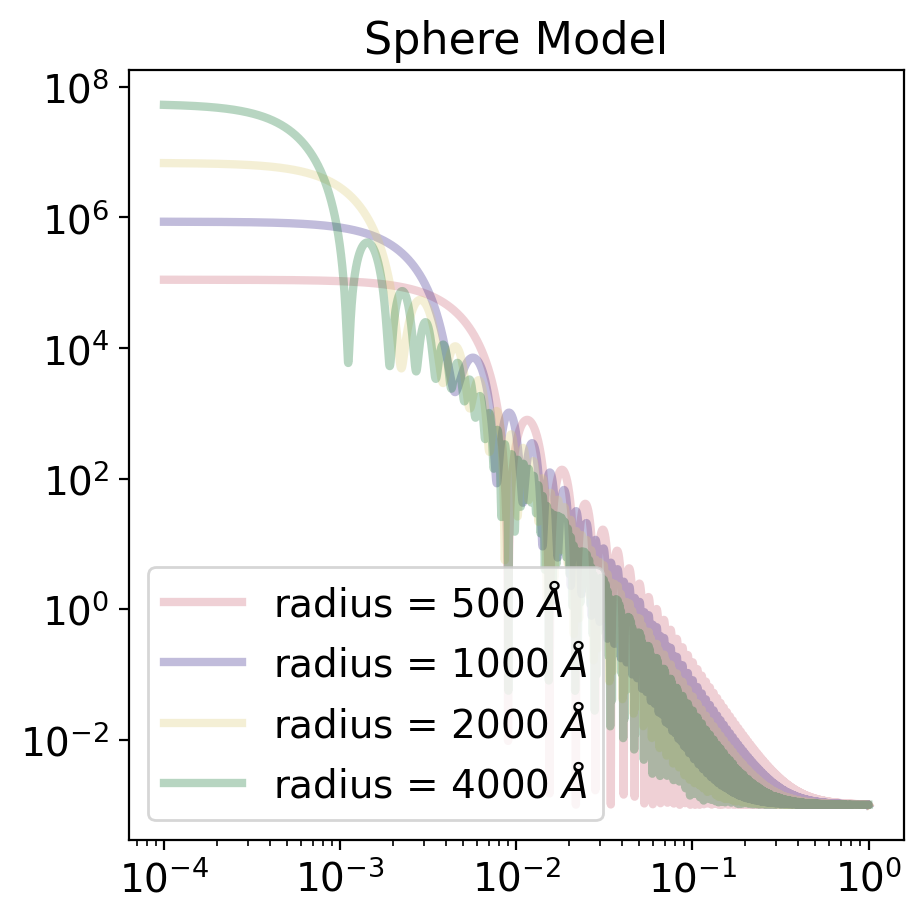

In [9]:
for idx,i in enumerate(Is):
    plt.loglog(data.x, i, label=f"radius = {rlarge[idx]} $\AA$",alpha=0.3)
plt.title("Sphere Model")
plt.legend()
plt.show()

# complex model fit from CSV

In [36]:
rawdata = np.genfromtxt(fps[40], delimiter='   ',skip_header=23)
q = rawdata[:,0][6:-125]
I = rawdata[:,1][6:-125]
dI = 0.15*I
data = sasmodels.data.Data1D(x=q,y=I,dy=dI)

kernel = sasmodels.core.load_model('power_law')
call_kernel = sasmodels.direct_model.DirectModel(empty_data, kernel)
call_kernel.resolution = sasmodels.resolution.Pinhole1D(empty_data.x, empty_data.x*0.15)
# Iq = call_kernel(
#     A_radius = 1000,
#     A_radius_effective = 1000,
#     A_radius_pd = 0.1,
#     A_radius_pd_type = 'gaussian',
#     A_radius_pd_nsigma = 3,
#     A_radius_pd_n = 350,
#     B_power = 4,
    
#     scale = 1e-10,
#     background=1e-4
# )

Iq = call_kernel(
    scale=1e-7,
    power=4,
    background=1e-4
)

##for sphere@hardsphere+power_law
# params = {
#     'A_radius': 1000,
#     'A_radius_effective': 1000,
#     'A_radius_pd': 0.1,
#     'A_radius_pd_type': 'gaussian',
#     'A_radius_pd_nsigma': 3,
#     'A_radius_pd_n': 350,
#     'A_scale':1e-4,
#     'B_scale':1e-4,
#     'B_power': 4,
    
#     'scale': 1e-6,
#     'background':1e-4
# }

params = {
    'scale':1e-7,
    'power':4.3,
    'background':1e-4
}
model = sasmodels.bumps_model.Model(kernel,**params)
# model.A_radius.range(1e2,1e5)
# model.A_radius_effective.range(1e2,1e5)
# model.B_power.range(3,4.5)
model.scale.range(1e-12,1e-3)
model.power.range(4,4.4)
model.background.range(1e-14,1e-2)

experiment = sasmodels.bumps_model.Experiment(data=data, model=model)
problem = bumps.fitproblem.FitProblem(experiment)
results = bumps.fitters.fit(problem, method='lm', steps=10000, ftol=1.5e-8, xtol=1.5e-8, verbose=True)
# print(kernel.info.parameters.defaults)
# plt.loglog(q,I)
# plt.loglog(q_fit,Iq)
# plt.show()
# plt.close()
fig,ax =plt.subplots(figsize=(12.8,4.8))
problem.plot()
print(problem.summarize())

IndexError: too many indices

## Fitting data
- need to determine rate of fitting
- try to parallel fit data
- should try DREAM fitting too

In [11]:
print(x.info.description)
x.info.parameters.defaults


This model provides the form factor, $P(q)$, for a micelle with a spherical
core and Gaussian polymer chains attached to the surface, thus may be applied
to block copolymer micelles. To work well the Gaussian chains must be much
smaller than the core, which is often not the case.  Please study the
reference to Pedersen and full documentation carefully.
    


{'scale': 1,
 'background': 0.001,
 'ndensity': 8.94,
 'v_core': 62624.0,
 'v_corona': 61940.0,
 'sld_solvent': 6.4,
 'sld_core': 0.34,
 'sld_corona': 0.8,
 'radius_core': 45.0,
 'rg': 20.0,
 'd_penetration': 1.0,
 'n_aggreg': 6.0,
 'up_frac_i': 0.0,
 'up_frac_f': 0.0,
 'up_angle': 0.0,
 'up_phi': 0.0,
 'sld_solvent_M0': 0.0,
 'sld_solvent_mtheta': 0.0,
 'sld_solvent_mphi': 0.0,
 'sld_core_M0': 0.0,
 'sld_core_mtheta': 0.0,
 'sld_core_mphi': 0.0,
 'sld_corona_M0': 0.0,
 'sld_corona_mtheta': 0.0,
 'sld_corona_mphi': 0.0}

scale
background
radius_core
rg
sld_core
sld_corona
sld_solvent
final chisq 0.316(10)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 32.46(27)       32.46(48)      
                             radius_core 57.1(14)        57.1(24)       
                                      rg 19.998157151(46) 19.998157151(82)
                                   scale 607(34)         607(61)        


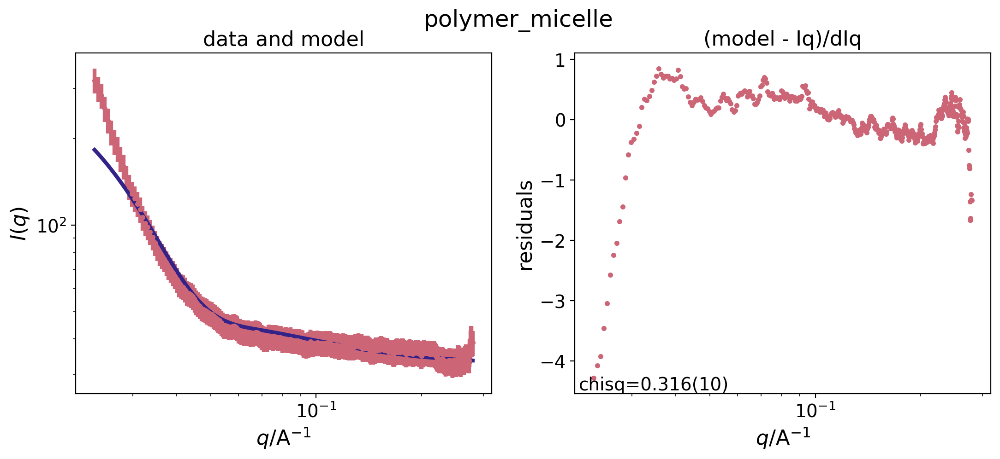

scale
background
rg
s
porod_exp
final chisq 0.196(10)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 35.70(20)       35.70(44)      
                               porod_exp 3.84(10)        3.84(23)       
                                      rg 99.99392370(22) 99.99392370(50)
                                   scale 1541(59)        1.54(13)e3     


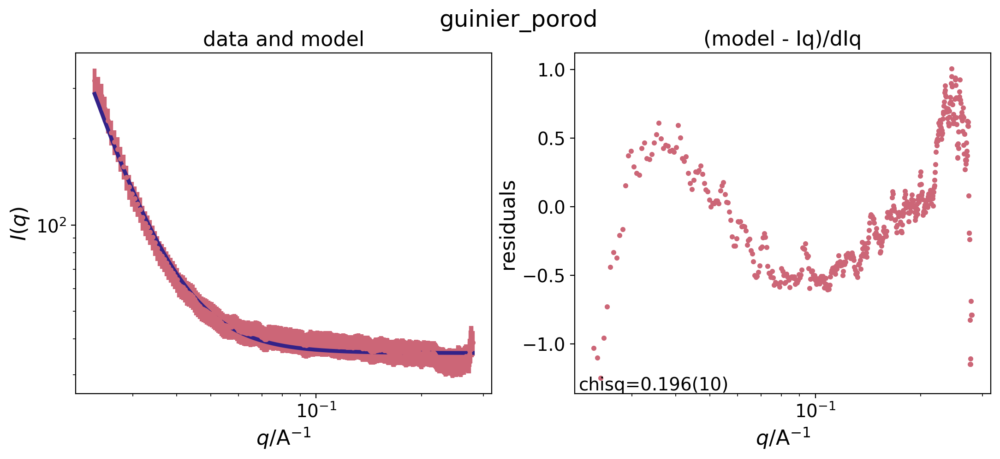

scale
background
radius
radius_pd
radius_pd_type
radius_pd_n
sld
sld_solvent
final chisq 0.198(10)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 35.82(18)       35.82(40)      
                                  radius 771(14)         771(32)        
                               radius_pd 63(12)e-3       63(26)e-3      
                                   scale 38.9(12)        38.9(26)       


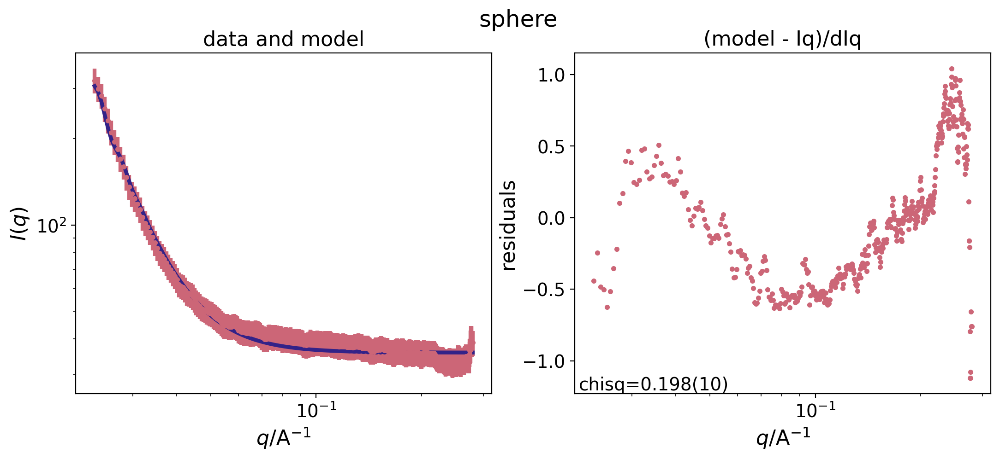

i_zero
background
rg
polydispersity
final chisq 0.882(10)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 33.10(24)       33.10(25)      
                                  i_zero 0.0(70)e12      0.0(74)e12     
                          polydispersity 0.0(23)e9       0.0(25)e9      
                                      rg 0.00(76)e12     0.00(81)e12    


/Users/drs18/mambaforge/envs/afl/lib/python3.8/site-packages/sasmodels/models/poly_gauss_coil.py:104: RuntimeWarning: invalid value encountered in power
  result = 2.0 * (power(1.0 + u*z, -1.0/u) + z - 1.0) / (1.0 + u)


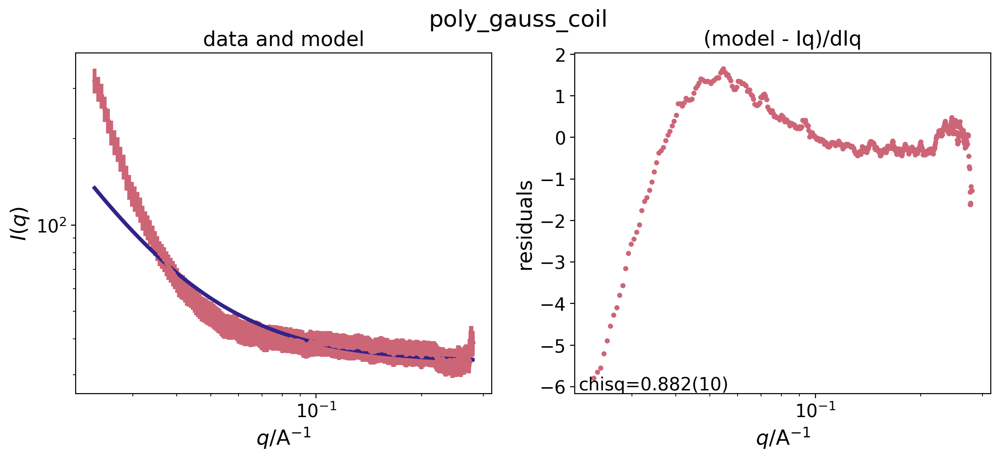


next model


In [5]:
ds_path = '/Users/drs18/Documents/multimodal-dev/sinq_data_manifests/230530_AL_manifest-P188_2D_MultiModal_UCB_noThomp_FixedP188.nc'
ds_AL = xr.load_dataset(ds_path)

q = ds_AL.q.values[25:]
I = ds_AL.SAS[2].values[25:]
dI = 0.1 * I
data = sasmodels.data.Data1D(x=q,y=I,dy=dI)

q_min = min(q)
q_max = max(q)
num_q = 1000
q_fit = np.logspace(np.log10(q_min), np.log10(q_max), num_q)
empty_data = sasmodels.data.empty_data1D(q_fit)


#dict of possible models and close starting points and boundaries for the bumps fitting
kernels = {
    "polymer_micelle":{
        "scale"       : {'value':2*max(I), 'bounds':(1e-1,1e6)},
        "background"  : {'value':16,       'bounds':(1e-1,50)},
        "radius_core" : {'value':40,       'bounds':(1,1e2)},
        # 'radius_pd': {'value':0.05, 'bounds':(0.01,0.1)},
        # 'radius_core_pd_n': {'value':2.0, 'bounds':()},
        # 'radius_core_pd_nsigma': {'value':3.0, 'bounds':None},
        "rg"          : {'value':15,       'bounds':(1,20)},
        # "d_penetration": {'value':1.0,     'bounds':(1e-2,1e2)},
        "sld_core"    : {'value':5.45,     'bounds':None},
        "sld_corona"  : {'value':5.15,     'bounds':None},
        "sld_solvent" : {'value':6.36,     'bounds':None},
    },
    "guinier_porod":{
        "scale"       : {"value" : 2*max(I),  'bounds': (1e-10,1e10)},
        "background"  : {"value" : 16 ,  'bounds': (1e-1,1e2)},
        "rg"          : {"value" :60 ,  'bounds': (1e0,1e2)},
        "s"           : {"value" : 0 ,  'bounds': None},#(0.5,1.5)},
        "porod_exp"   : {"value" : 4 ,  'bounds': (2.5,4.5)}
    },
    "sphere":{
        "scale"       : {'value':max(I),   'bounds':(1e-1,1e4)},
        "background"  : {'value':20,       'bounds':(1e-6,1e2)},
        "radius"      : {'value':800,       'bounds':(1e-1,1e3)},
        "radius_pd"   : {'value':0.15,       'bounds':(0.02,0.5)},
        "radius_pd_type": {'value':'gaussian','bounds':None},
        "radius_pd_n": {'value':15,'bounds':None},
        "sld"         : {'value':5.45,     'bounds':None},
        "sld_solvent" : {'value':6.36,     'bounds':None},
    },
    "poly_gauss_coil": {
        "i_zero"      : {'value':max(I),   'bounds':(1e-1,1e4)},
        "background"  : {'value':40,       'bounds':(1e-1,1e4)},
        "rg"          : {'value':60,       'bounds':(1e-1,1e4)},
        "polydispersity": {'value':1,       'bounds':(1e-1,1e4)}
    },
    # "power_law": {
    #     "scale"         : {'value':max(I)*1e-7,       'bounds':(1e-4,1e1)},
    #     "background"  : {'value':1e-6,       'bounds':(1e-10,1e1)},
    #     "power"      : {'value':4,      'bounds':(2,4)},
    #     # "sld"         : {'value':5.45,     'bounds':None},
    #     # "sld_solvent" : {'value':6.36,     'bounds':None},
    # },
    # "power_law+polymer_micelle":{
    #     "background"  : {'value':20,       'bounds':(1e-1,1e4)},
    #     "scale"       : {'value':2e-4, 'bounds':(1e-1,1e6)},#'bounds':None},
    #     "A_power"      : {'value':4,      'bounds':(2,4)},
    #     "A_scale"       : {'value':1e-3,      'bounds':(1e-10,1e2)},
    #     "B_scale"       : {'value':1e-1,      'bounds':(1e-10,1e2)},
    #     "B_radius_core" : {'value':40,       'bounds':(1e-2,1e4)},
    #     "B_rg"          : {'value':130,       'bounds':(1e-2,1e4)},
    #     # "d_penetration": {'value':1.0,     'bounds':(1e-2,1e2)},
    #     "B_sld_core"    : {'value':5.45,     'bounds':None},
    #     "B_sld_corona"  : {'value':5.15,     'bounds':None},
    #     "B_sld_solvent" : {'value':6.36,     'bounds':None},
    # }
}

#plotting and model instantiation

for kern in kernels:
    #instantiate the sas kernel and specify the resolution
    kernel = sasmodels.core.load_model(kern)
    call_kernel= sasmodels.direct_model.DirectModel(empty_data, kernel)
    call_kernel.resolution = sasmodels.resolution.Pinhole1D(empty_data.x, empty_data.x*0.15)

    #pull the parameters from the initialization dictionary and create a model
    params = {}
    for key in kernels[kern]:
        params[key] = kernels[kern][key]['value']
    model = sasmodels.bumps_model.Model(kernel, **params)

    #augment the bounds. clunky but it works
    for key in kernels[kern]:
        print(key)
        bounds = kernels[kern][key]['bounds']
        if bounds != None:
            model.parameters()[key].fixed = False
            model.parameters()[key].bounds = bumps.bounds.Bounded(bounds[0],bounds[1])

    experiment = sasmodels.bumps_model.Experiment(data=data, model=model)
    problem = bumps.fitproblem.FitProblem(experiment)
    results = bumps.fitters.fit(problem, method='lm', steps=10000, ftol=1.5e-9, xtol=1.5e-9, verbose=True)
    problem.summarize()
    #initial guess
    # Iq = call_kernel(**params)
    # ax.loglog(q_fit,Iq,label=kern)
    fig,ax =plt.subplots(1,figsize=(12.8,4.8))
    ax.loglog(q,I,label='raw')
    problem.plot()
    ax.legend()
    fig.suptitle(kern)
    plt.show()
    plt.close()

print()
print('next model')

In [34]:
{key:val for key,val in zip(problem.labels(),problem.getp())}

{'background': 48.199397323142804,
 'i_zero': 303.71098865822705,
 'polydispersity': 0.996201831731442,
 'rg': 57.7543164545941}

## batch fitting PSI data with singular model

In [13]:
ds_path = '/Users/drs18/Documents/multimodal-dev/sinq_data_manifests/230530_AL_manifest-P188_2D_MultiModal_UCB_noThomp_FixedP188.nc'
ds_AL = xr.load_dataset(ds_path)
ds_AL.attrs["wl_lo"] = 800
ds_AL.attrs["wl_hi"] = 450
ds_AL.attrs["SAS_savgol_xlo"] = 0.01
ds_AL.attrs["SAS_savgol_xhi"] = 0.25
# q=ds_AL.q
# for rawdata in ds_AL['SAS']:
#     print(rawdata)

In [14]:
problem.chisq()

0.882063622467212

final chisq 0.1090(95)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 35.61(41)       35.6(12)       
                             radius_core 37.48(48)       37.5(15)       
                                      rg 18.67(79)       18.7(24)       
                                   scale 1294(31)        1294(93)       


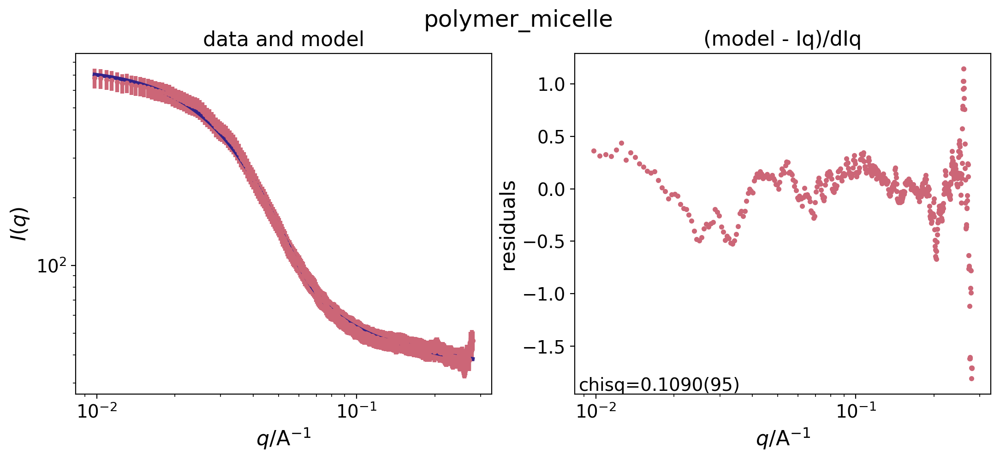

final chisq 0.4666(95)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 41.95(23)       41.95(34)      
                                  radius 31.50(26)       31.50(37)      
                               radius_pd 0.4999729059(11) 0.4999729059(17)
                                   scale 13.94(20)       13.94(30)      


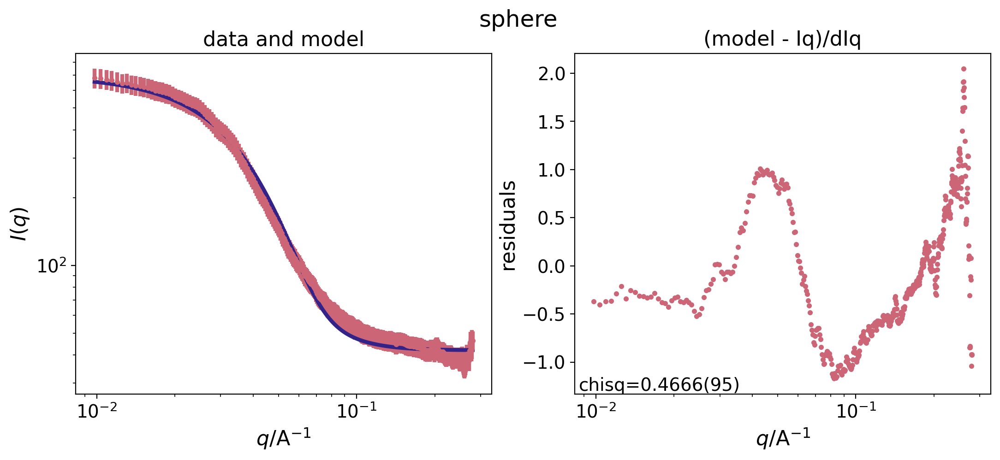

final chisq 1.4277(71)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 33.13(30)       33.13(25)      
                                  i_zero 1297(58)        1297(49)       
                                      rg 121.1(34)       121.1(28)      


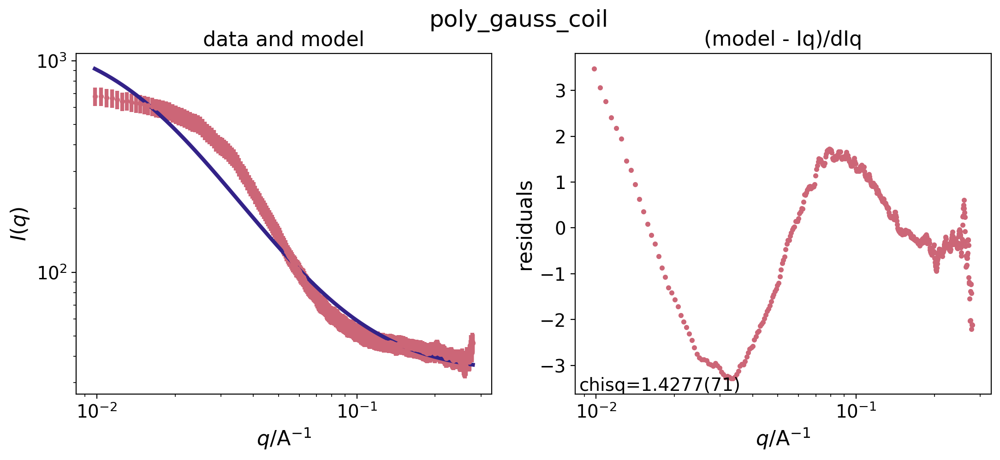

{'polymer_micelle': {'chisqr': 0.10901291067713302, 'params': {'background': {'fit_val': 35.60991715659951, 'fit_err': 0.40674997800479007}, 'radius_core': {'fit_val': 37.48002052117112, 'fit_err': 0.4835496273492768}, 'rg': {'fit_val': 18.666418243297795, 'fit_err': 0.7911573013793258}, 'scale': {'fit_val': 1294.2909172079264, 'fit_err': 30.75573659089558}}}, 'sphere': {'chisqr': 0.46658547315357113, 'params': {'background': {'fit_val': 41.95196858963779, 'fit_err': 0.23093775085384893}, 'radius': {'fit_val': 31.501172237204827, 'fit_err': 0.25558772510138933}, 'radius_pd': {'fit_val': 0.49997290592913013, 'fit_err': 1.1382496733939837e-09}, 'scale': {'fit_val': 13.936908042999443, 'fit_err': 0.2031973361017614}}}, 'poly_gauss_coil': {'chisqr': 1.4276706340796754, 'params': {'background': {'fit_val': 33.12765273823851, 'fit_err': 0.29998131883141327}, 'i_zero': {'fit_val': 1297.138046911975, 'fit_err': 58.07557996019207}, 'rg': {'fit_val': 121.08615655935425, 'fit_err': 3.377087817207

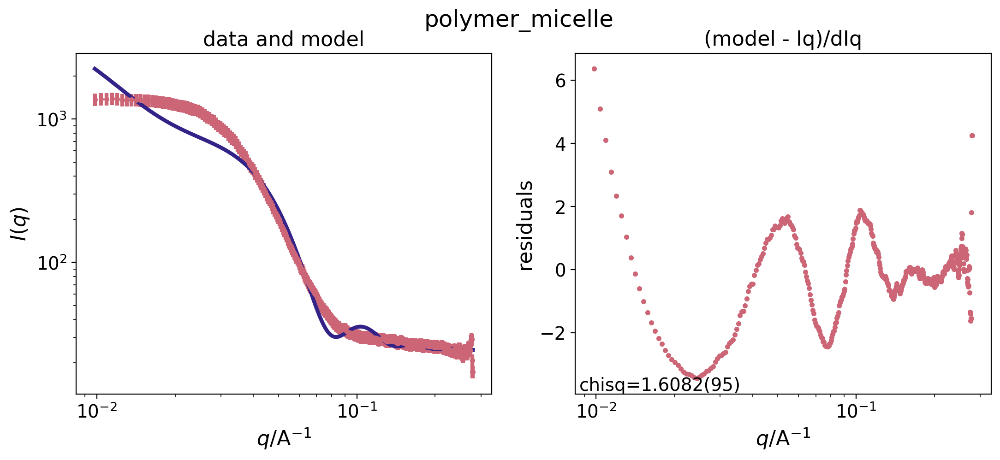

final chisq 0.3600(95)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 24.89(14)       24.89(24)      
                                  radius 46.2(11)        46.2(18)       
                               radius_pd 0.304(20)       0.304(34)      
                                   scale 23.11(24)       23.11(40)      


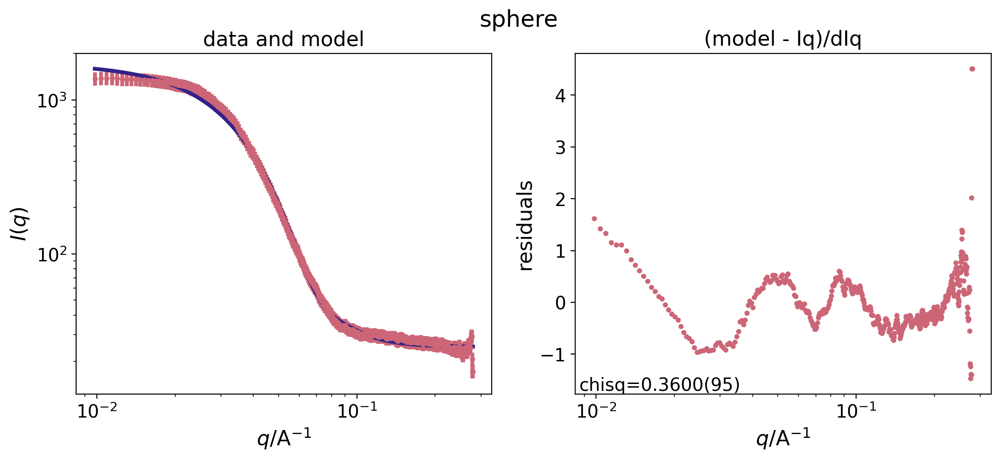

final chisq 7.6110(71)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 18.13(20)       18.126(73)     
                                  i_zero 9999.739040(24) 9999.7390397(88)
                                      rg 369.1(27)       369.07(96)     


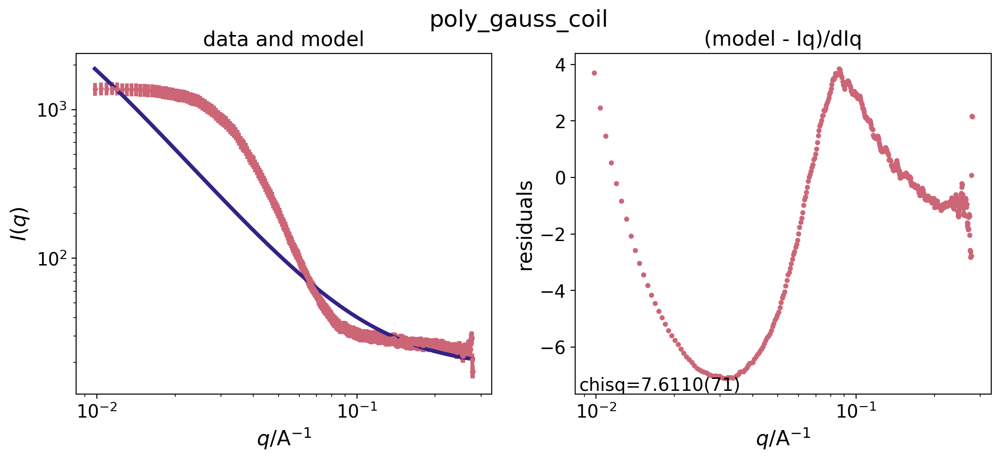

{'polymer_micelle': {'chisqr': 1.6081730449694907, 'params': {'background': {'fit_val': 23.83615469955637, 'fit_err': 0.15625106394851634}, 'radius_core': {'fit_val': 54.89175005268331, 'fit_err': 0.1690386957548422}, 'rg': {'fit_val': 117.11362884970842, 'fit_err': 2.4127705249659694}, 'scale': {'fit_val': 9999.752741190136, 'fit_err': 2.2872933206407668e-05}}}, 'sphere': {'chisqr': 0.3600402352178807, 'params': {'background': {'fit_val': 24.890059799974804, 'fit_err': 0.14376334379468583}, 'radius': {'fit_val': 46.24242225554044, 'fit_err': 1.0611491695375714}, 'radius_pd': {'fit_val': 0.3042475831606376, 'fit_err': 0.020131710377315152}, 'scale': {'fit_val': 23.113936316563777, 'fit_err': 0.24190673732949008}}}, 'poly_gauss_coil': {'chisqr': 7.610987049854658, 'params': {'background': {'fit_val': 18.126235623136893, 'fit_err': 0.2013241486922679}, 'i_zero': {'fit_val': 9999.739039672038, 'fit_err': 2.4363989084644855e-05}, 'rg': {'fit_val': 369.0737978150219, 'fit_err': 2.6595145303

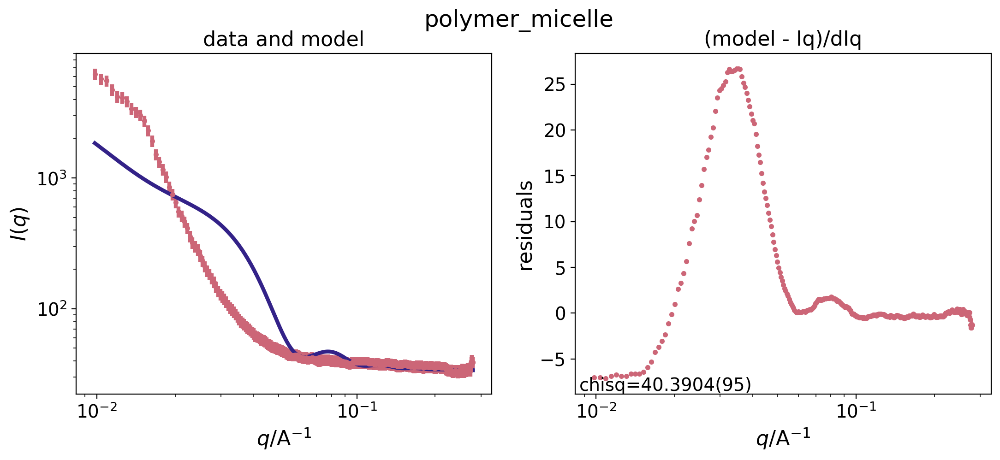

final chisq 2.7222(95)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 35.80(18)       35.80(11)      
                                  radius 55.9(10)        55.90(61)      
                               radius_pd 0.4999511882(12) 0.49995118820(71)
                                   scale 3.230(68)       3.230(41)      


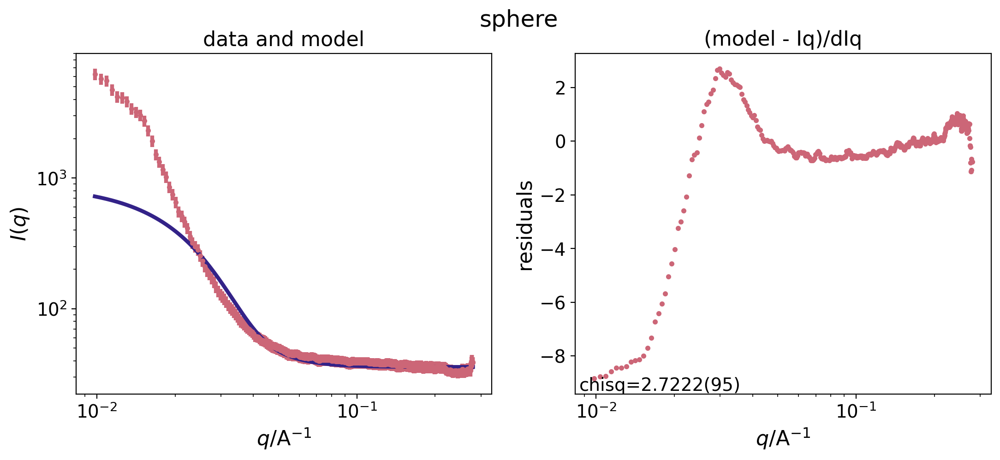

final chisq 4.2168(71)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 32.36(22)       32.36(11)      
                                  i_zero 0.010(48)e6     0.010(24)e6    
                                      rg 0.7(16)e3       0.67(79)e3     


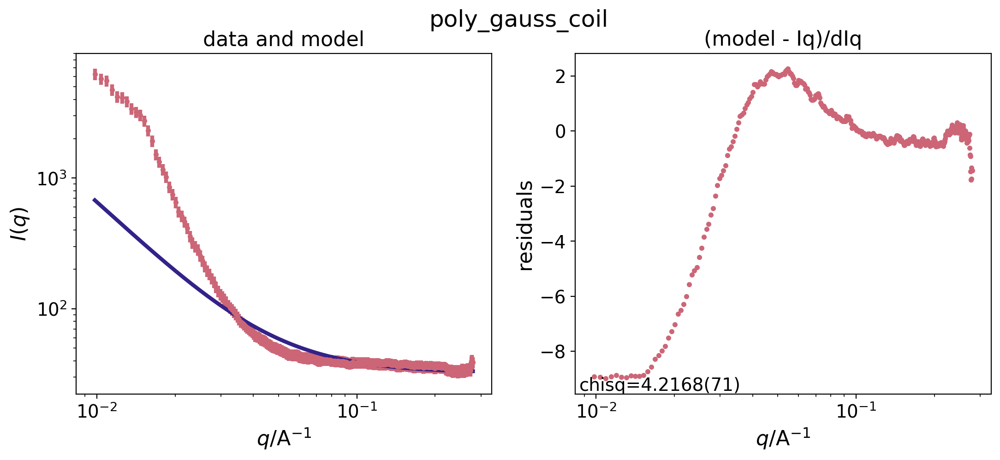

{'polymer_micelle': {'chisqr': 40.39044368370465, 'params': {'background': {'fit_val': 33.34643344616745, 'fit_err': 4.864020652644928e-07}, 'radius_core': {'fit_val': 73.11339646195641, 'fit_err': 0.17736781743473676}, 'rg': {'fit_val': 128.54600791886472, 'fit_err': 3.09434532905056}, 'scale': {'fit_val': 10000.0, 'fit_err': 0.38785662857453646}}}, 'sphere': {'chisqr': 2.7221600392613756, 'params': {'background': {'fit_val': 35.79642469608783, 'fit_err': 0.18161038386279793}, 'radius': {'fit_val': 55.900596641871, 'fit_err': 1.0144764528803794}, 'radius_pd': {'fit_val': 0.49995118819676954, 'fit_err': 1.1733973510653616e-09}, 'scale': {'fit_val': 3.2303483633051657, 'fit_err': 0.06771762139387971}}}, 'poly_gauss_coil': {'chisqr': 4.216808977460842, 'params': {'background': {'fit_val': 32.36009232296888, 'fit_err': 0.22258672837761256}, 'i_zero': {'fit_val': 9997.321792434795, 'fit_err': 48303.23748158494}, 'rg': {'fit_val': 672.1021213411417, 'fit_err': 1632.209117986857}}}}
BA, Ph
5

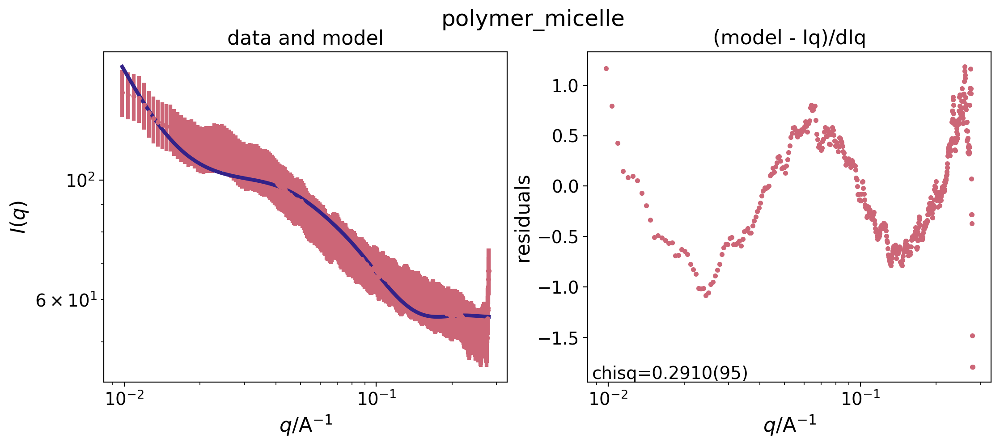

final chisq 0.2781(95)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 55.53(36)       55.53(69)      
                                  radius 16.26(40)       16.26(76)      
                               radius_pd 0.4999847026(12) 0.4999847026(22)
                                   scale 9.54(58)        9.5(11)        


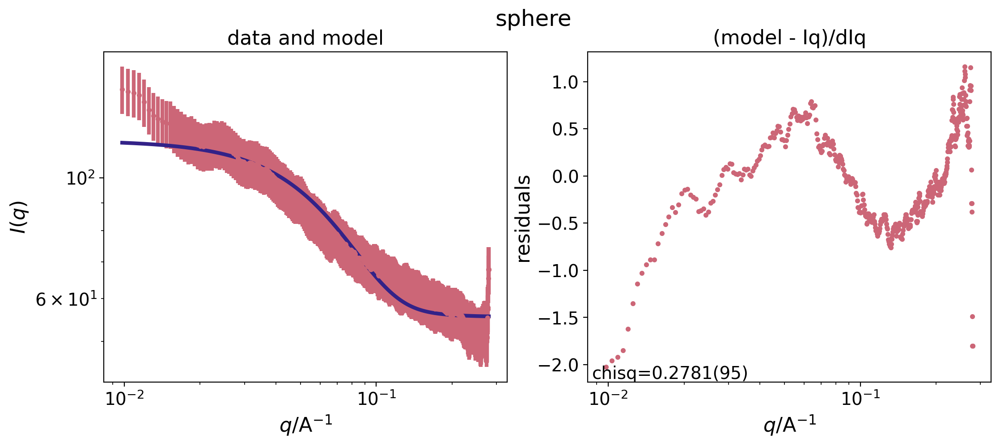

final chisq 0.1012(71)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 51.09(51)       51.1(16)       
                                  i_zero 78.8(25)        78.8(80)       
                                      rg 34.3(15)        34.3(46)       


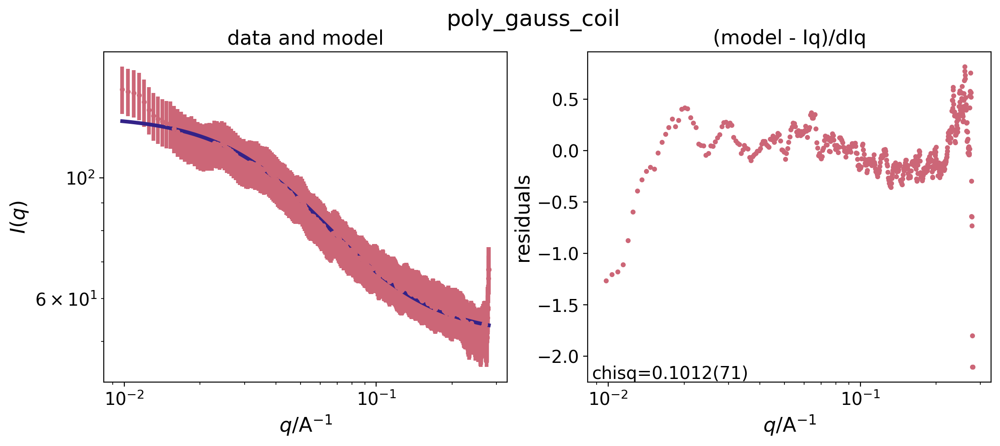

{'polymer_micelle': {'chisqr': 0.2909594393831305, 'params': {'background': {'fit_val': 55.609114901182735, 'fit_err': 0.3561766040666052}, 'radius_core': {'fit_val': 25.737601578177134, 'fit_err': 0.6201928504537912}, 'rg': {'fit_val': 133.21715061862812, 'fit_err': 7.175647194045986}, 'scale': {'fit_val': 486.3143007739912, 'fit_err': 15.671723542688326}}}, 'sphere': {'chisqr': 0.27808492700971305, 'params': {'background': {'fit_val': 55.52881053355518, 'fit_err': 0.3634315628890946}, 'radius': {'fit_val': 16.259750801822975, 'fit_err': 0.39842254834615565}, 'radius_pd': {'fit_val': 0.4999847026305969, 'fit_err': 1.1520576951010701e-09}, 'scale': {'fit_val': 9.53576195721992, 'fit_err': 0.5798480741947205}}}, 'poly_gauss_coil': {'chisqr': 0.10119331775212324, 'params': {'background': {'fit_val': 51.085380950900024, 'fit_err': 0.5140730153455023}, 'i_zero': {'fit_val': 78.83814434679181, 'fit_err': 2.5437990236760863}, 'rg': {'fit_val': 34.271028745423095, 'fit_err': 1.457469465253348

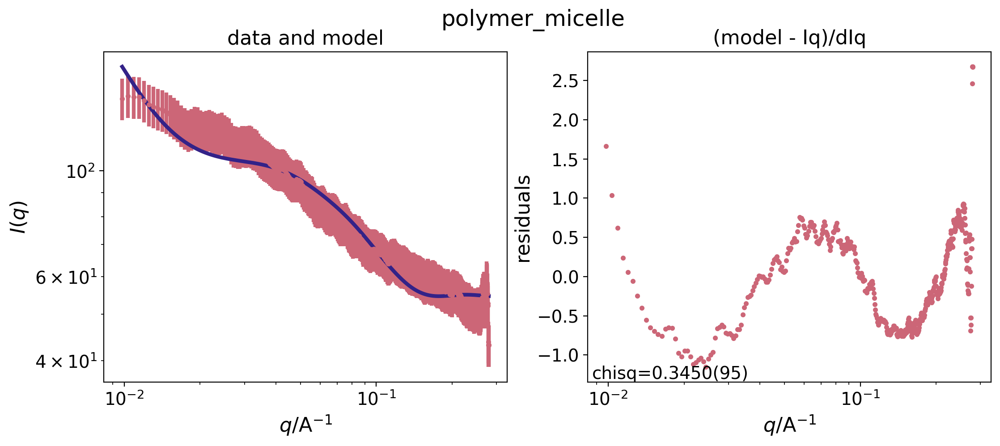

final chisq 0.2988(95)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 54.36(36)       54.36(66)      
                                  radius 15.85(36)       15.85(65)      
                               radius_pd 0.4999888693(11) 0.4999888693(21)
                                   scale 11.15(63)       11.1(11)       


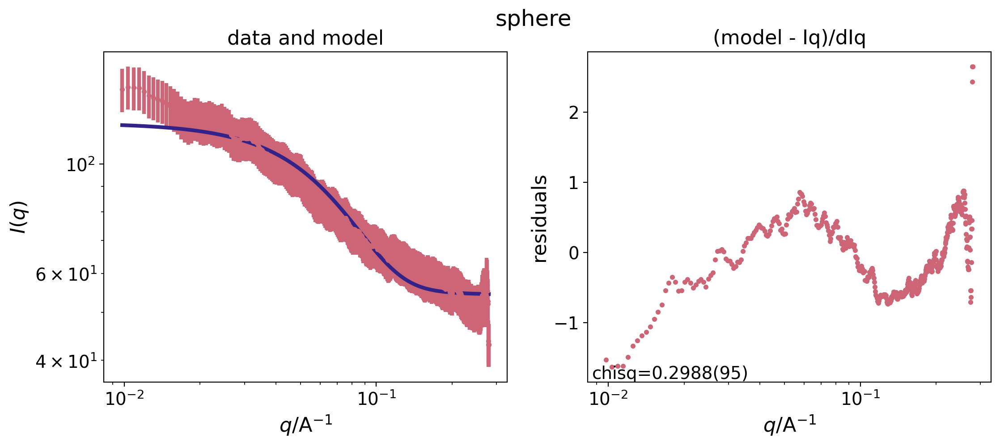

final chisq 0.0964(71)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 49.40(52)       49.4(17)       
                                  i_zero 85.3(26)        85.3(82)       
                                      rg 33.3(13)        33.3(42)       


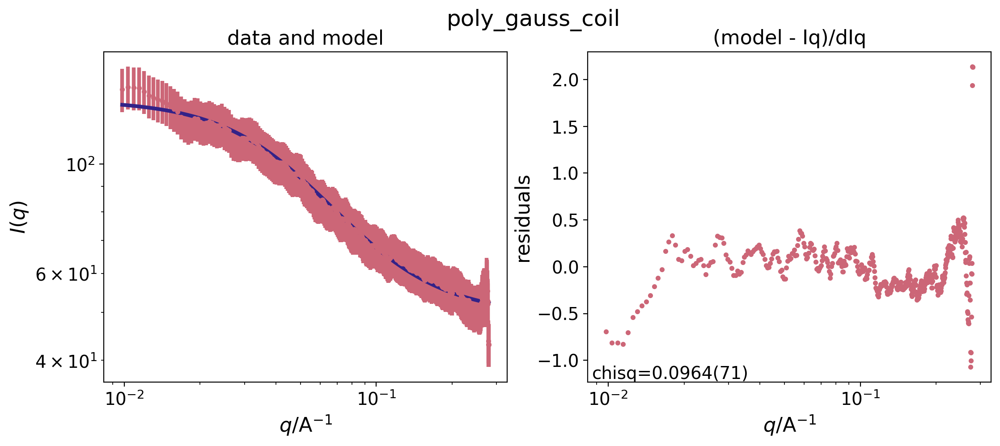

{'polymer_micelle': {'chisqr': 0.3450141800816892, 'params': {'background': {'fit_val': 54.511516561114796, 'fit_err': 0.3516392088387362}, 'radius_core': {'fit_val': 25.377460713604393, 'fit_err': 0.5502726038809208}, 'rg': {'fit_val': 140.73832203754947, 'fit_err': 7.486165798701134}, 'scale': {'fit_val': 535.3127958005276, 'fit_err': 15.709637427970739}}}, 'sphere': {'chisqr': 0.2987584158354378, 'params': {'background': {'fit_val': 54.3564916088541, 'fit_err': 0.36310666815747394}, 'radius': {'fit_val': 15.850520647394394, 'fit_err': 0.3570739937687692}, 'radius_pd': {'fit_val': 0.49998886931246206, 'fit_err': 1.1495153779376825e-09}, 'scale': {'fit_val': 11.147898335281008, 'fit_err': 0.6253439464574545}}}, 'poly_gauss_coil': {'chisqr': 0.09637957387728117, 'params': {'background': {'fit_val': 49.40139855843168, 'fit_err': 0.5190468792296105}, 'i_zero': {'fit_val': 85.34578848819548, 'fit_err': 2.5530338407383106}, 'rg': {'fit_val': 33.25110961704694, 'fit_err': 1.307630988096233}

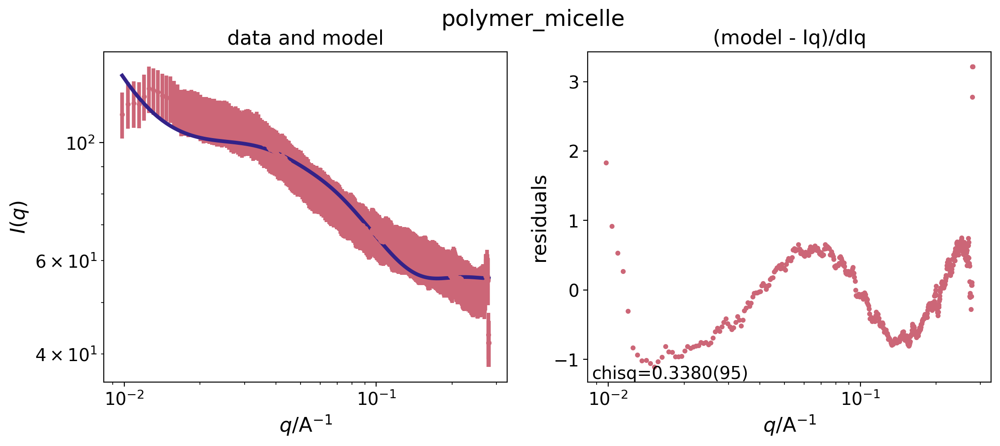

final chisq 0.2684(95)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 55.16(37)       55.16(71)      
                                  radius 15.58(40)       15.58(78)      
                               radius_pd 0.4999938371(11) 0.4999938371(22)
                                   scale 9.76(64)        9.8(12)        


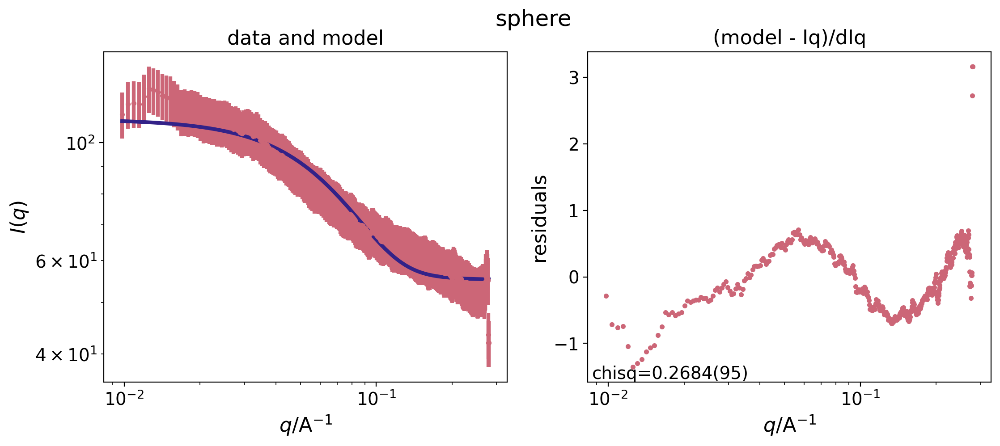

final chisq 0.0986(71)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 50.70(53)       50.7(17)       
                                  i_zero 69.9(22)        69.9(71)       
                                      rg 31.7(14)        31.7(45)       


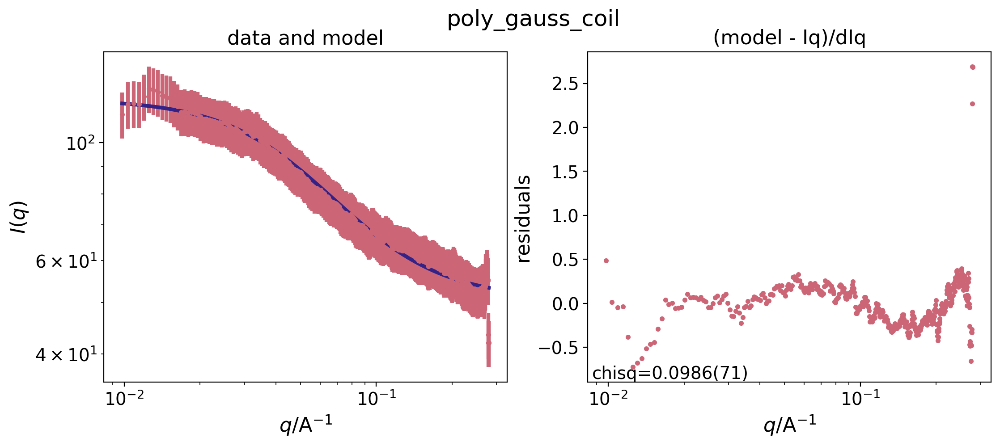

{'polymer_micelle': {'chisqr': 0.33799724108256457, 'params': {'background': {'fit_val': 55.45116943309109, 'fit_err': 0.3539908142108271}, 'radius_core': {'fit_val': 25.81598035009402, 'fit_err': 0.6274489254732017}, 'rg': {'fit_val': 169.32196778972371, 'fit_err': 12.335419283048838}, 'scale': {'fit_val': 467.6082634439327, 'fit_err': 14.618430377447043}}}, 'sphere': {'chisqr': 0.2684004075499551, 'params': {'background': {'fit_val': 55.15784303343882, 'fit_err': 0.36783048152298664}, 'radius': {'fit_val': 15.58413130617748, 'fit_err': 0.40405080671870786}, 'radius_pd': {'fit_val': 0.49999383710762996, 'fit_err': 1.1349286255200707e-09}, 'scale': {'fit_val': 9.759952793247987, 'fit_err': 0.6390230163252765}}}, 'poly_gauss_coil': {'chisqr': 0.09859662748141847, 'params': {'background': {'fit_val': 50.703789240271846, 'fit_err': 0.5342515419207826}, 'i_zero': {'fit_val': 69.93309314863275, 'fit_err': 2.2294268773338692}, 'rg': {'fit_val': 31.682344415146865, 'fit_err': 1.40681481761195

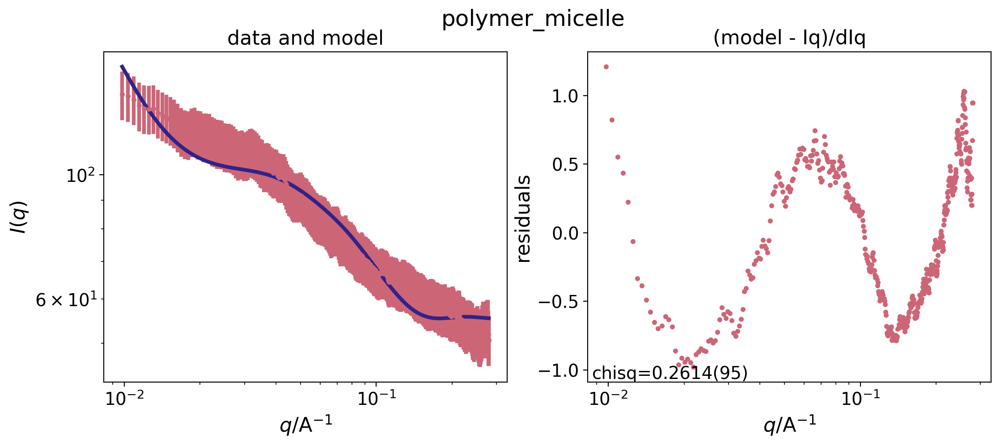

final chisq 0.2227(95)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 55.16(37)       55.16(78)      
                                  radius 15.72(38)       15.72(80)      
                               radius_pd 0.4999738783(11) 0.4999738783(24)
                                   scale 10.56(63)       10.6(13)       


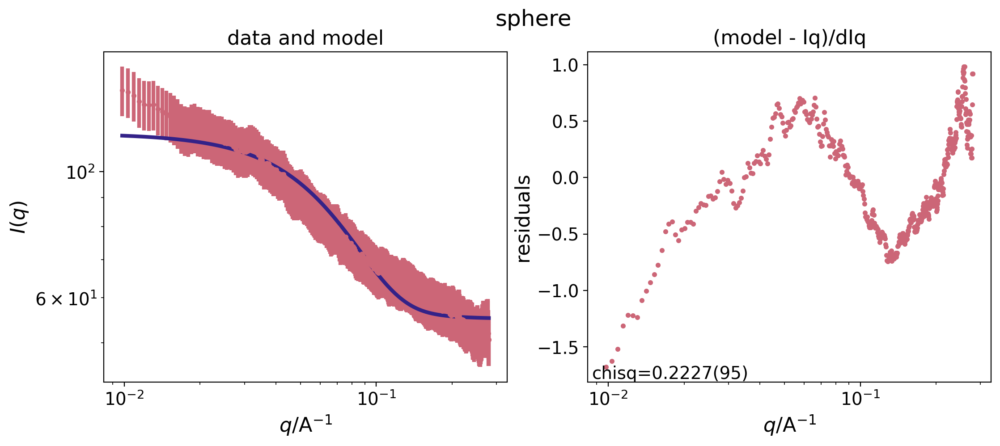

final chisq 0.0454(71)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 50.44(53)       50.4(25)       
                                  i_zero 78.3(24)        78(11)         
                                      rg 32.6(14)        32.6(64)       


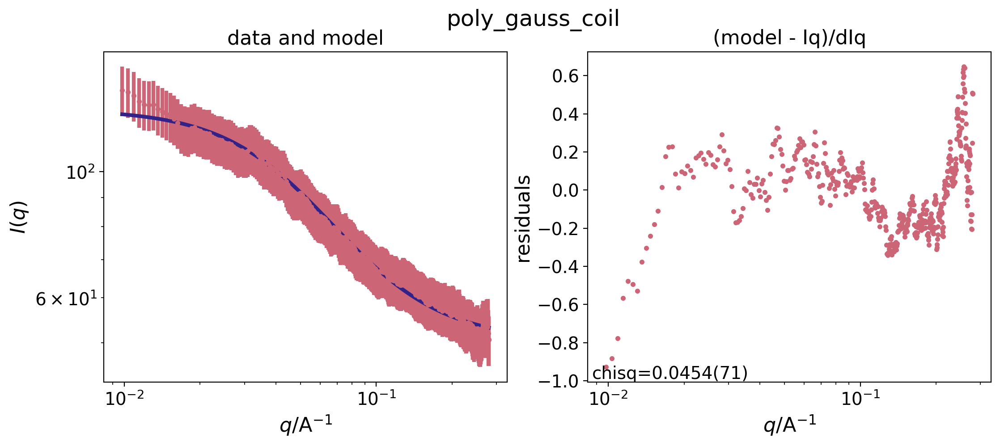

{'polymer_micelle': {'chisqr': 0.26137249013147607, 'params': {'background': {'fit_val': 55.32538814158529, 'fit_err': 0.35691876626243585}, 'radius_core': {'fit_val': 25.305099017343295, 'fit_err': 0.5848791734129128}, 'rg': {'fit_val': 143.90201181582356, 'fit_err': 8.156869795905521}, 'scale': {'fit_val': 499.03326270048075, 'fit_err': 15.278114963453305}}}, 'sphere': {'chisqr': 0.22270882287370344, 'params': {'background': {'fit_val': 55.15701924123491, 'fit_err': 0.36591806115672143}, 'radius': {'fit_val': 15.718175883148923, 'fit_err': 0.3776432270336743}, 'radius_pd': {'fit_val': 0.49997387834185203, 'fit_err': 1.1343565465025645e-09}, 'scale': {'fit_val': 10.558728864319349, 'fit_err': 0.6343953727419239}}}, 'poly_gauss_coil': {'chisqr': 0.04540412675988914, 'params': {'background': {'fit_val': 50.44475073205824, 'fit_err': 0.5295553659493727}, 'i_zero': {'fit_val': 78.2922198325836, 'fit_err': 2.416058457050229}, 'rg': {'fit_val': 32.589792589315316, 'fit_err': 1.3585999211498

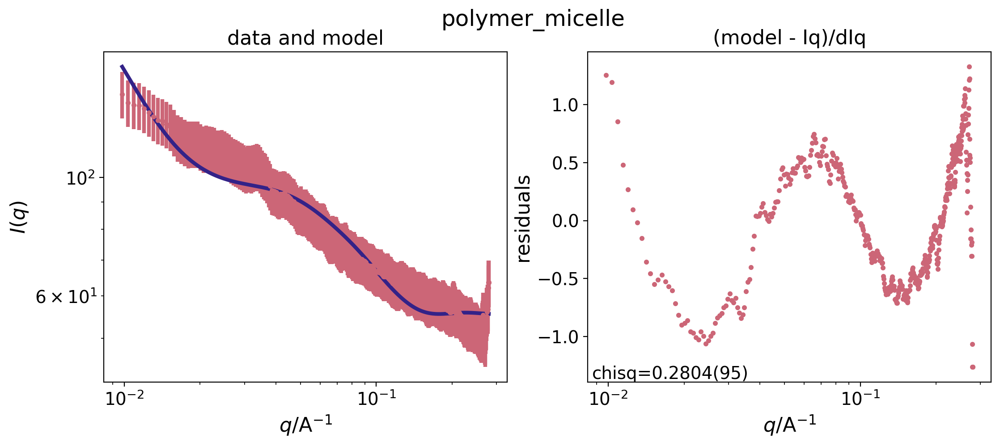

final chisq 0.2770(95)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 55.51(36)       55.51(68)      
                                  radius 16.48(42)       16.48(80)      
                               radius_pd 0.4999966367(11) 0.4999966367(22)
                                   scale 8.74(55)        8.7(11)        


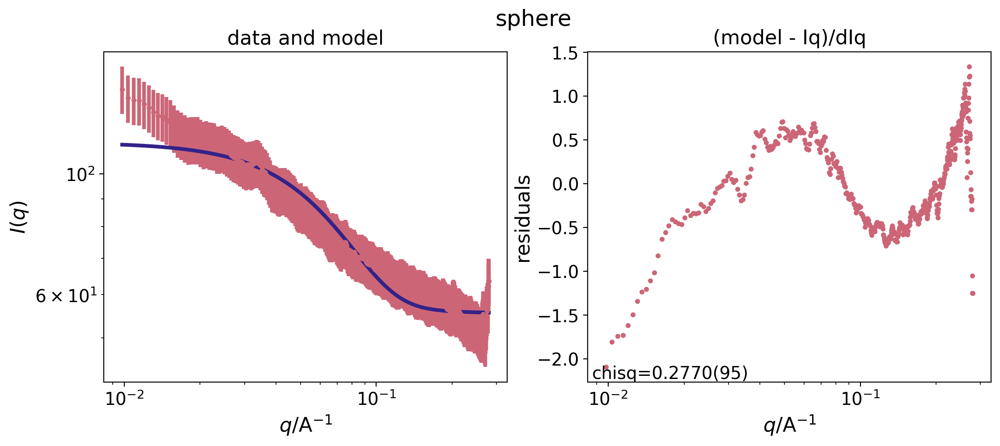

final chisq 0.0938(71)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 51.40(50)       51.4(16)       
                                  i_zero 76.0(26)        76.0(84)       
                                      rg 35.2(16)        35.2(51)       


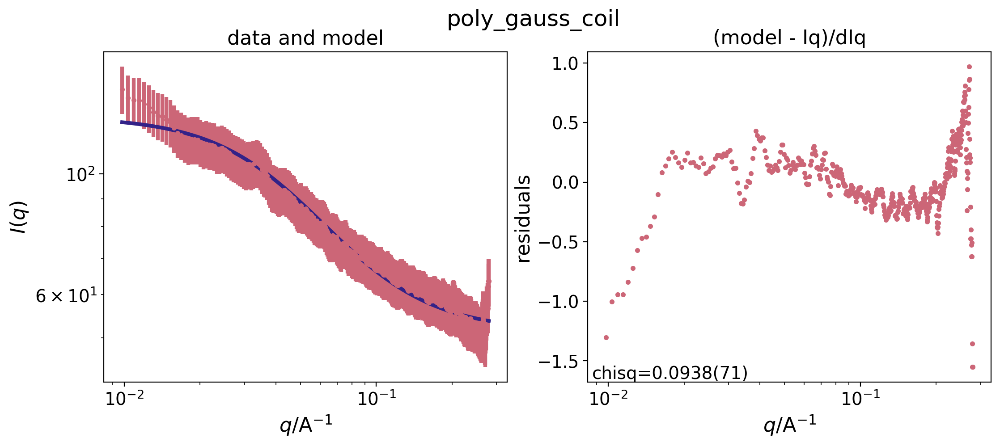

{'polymer_micelle': {'chisqr': 0.2803518805324301, 'params': {'background': {'fit_val': 55.444222763748826, 'fit_err': 0.35740701369136446}, 'radius_core': {'fit_val': 25.35594204499136, 'fit_err': 0.6498238979676698}, 'rg': {'fit_val': 125.45490177269804, 'fit_err': 6.626982392842294}, 'scale': {'fit_val': 449.1783965236312, 'fit_err': 15.25114935432687}}}, 'sphere': {'chisqr': 0.27696052650210295, 'params': {'background': {'fit_val': 55.50722761388076, 'fit_err': 0.35921408648802555}, 'radius': {'fit_val': 16.479060942532477, 'fit_err': 0.42066513197682104}, 'radius_pd': {'fit_val': 0.49999663670270195, 'fit_err': 1.1417190885268043e-09}, 'scale': {'fit_val': 8.744253908474656, 'fit_err': 0.5538848609840399}}}, 'poly_gauss_coil': {'chisqr': 0.09378359597009163, 'params': {'background': {'fit_val': 51.39507082145671, 'fit_err': 0.5022205175329736}, 'i_zero': {'fit_val': 75.97911583638081, 'fit_err': 2.5651206326407108}, 'rg': {'fit_val': 35.2043379226382, 'fit_err': 1.5539734942659145

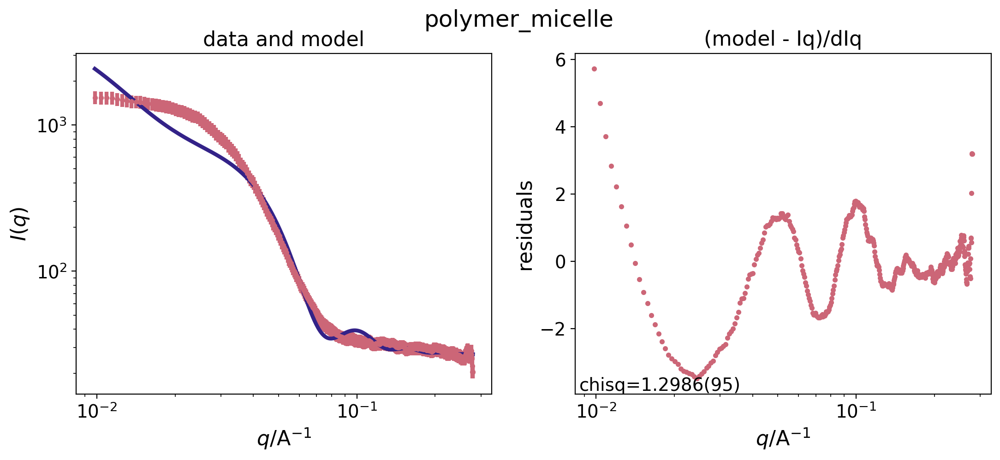

final chisq 0.2618(95)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 27.71(16)       27.71(31)      
                                  radius 50.1(10)        50.1(20)       
                               radius_pd 0.282(18)       0.282(36)      
                                   scale 20.64(22)       20.64(44)      


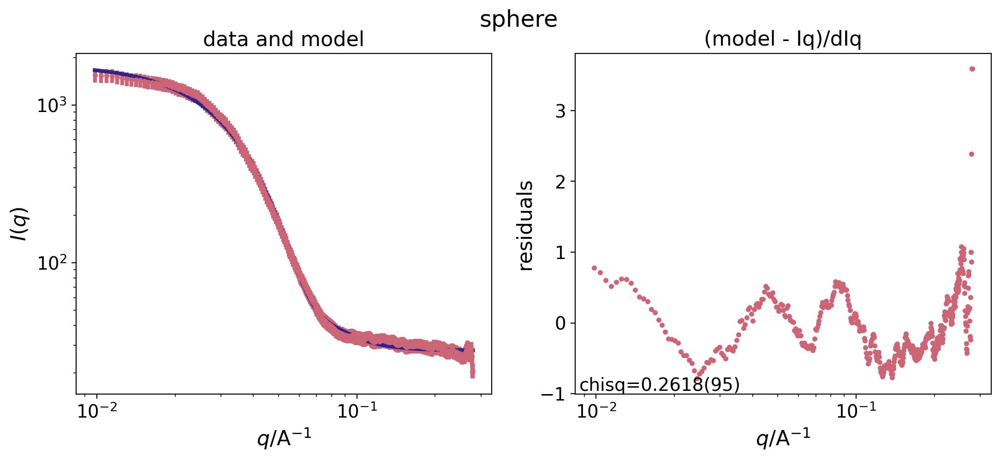

final chisq 7.1643(71)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 20.87(22)       20.875(82)     
                                  i_zero 9999.395136(25) 9999.3951363(92)
                                      rg 379.6(29)       379.6(11)      


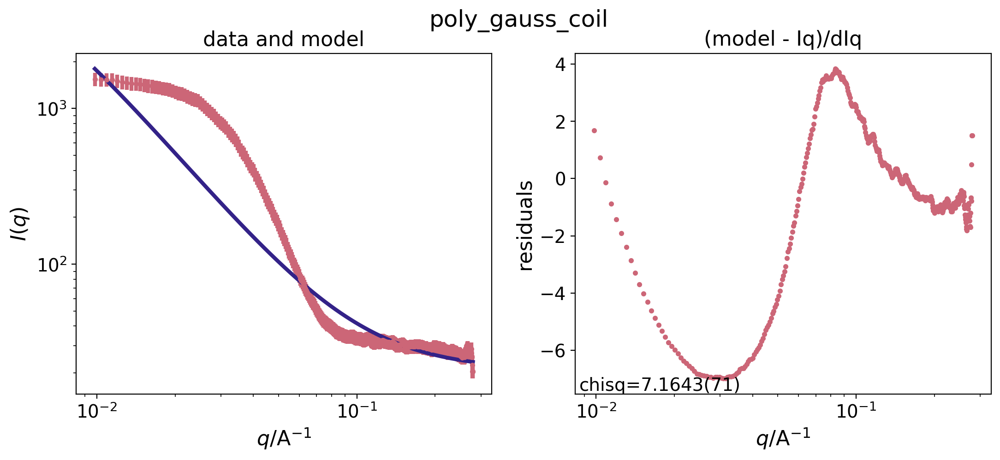

{'polymer_micelle': {'chisqr': 1.2985565686906924, 'params': {'background': {'fit_val': 26.21186473368066, 'fit_err': 0.17699677213211618}, 'radius_core': {'fit_val': 57.776419062683736, 'fit_err': 0.19895225231817634}, 'rg': {'fit_val': 107.37158210130139, 'fit_err': 2.1488896919870553}, 'scale': {'fit_val': 9999.780039346135, 'fit_err': 2.3189172462133846e-05}}}, 'sphere': {'chisqr': 0.26180965226346714, 'params': {'background': {'fit_val': 27.711722077533814, 'fit_err': 0.15621276061693343}, 'radius': {'fit_val': 50.13071863369416, 'fit_err': 1.0371289541305564}, 'radius_pd': {'fit_val': 0.28194010002118164, 'fit_err': 0.01843409621607347}, 'scale': {'fit_val': 20.643645507542644, 'fit_err': 0.22435221182805412}}}, 'poly_gauss_coil': {'chisqr': 7.164284605416782, 'params': {'background': {'fit_val': 20.87490122755634, 'fit_err': 0.21960984362942745}, 'i_zero': {'fit_val': 9999.395136252388, 'fit_err': 2.466021582490397e-05}, 'rg': {'fit_val': 379.5760064726503, 'fit_err': 2.85839521

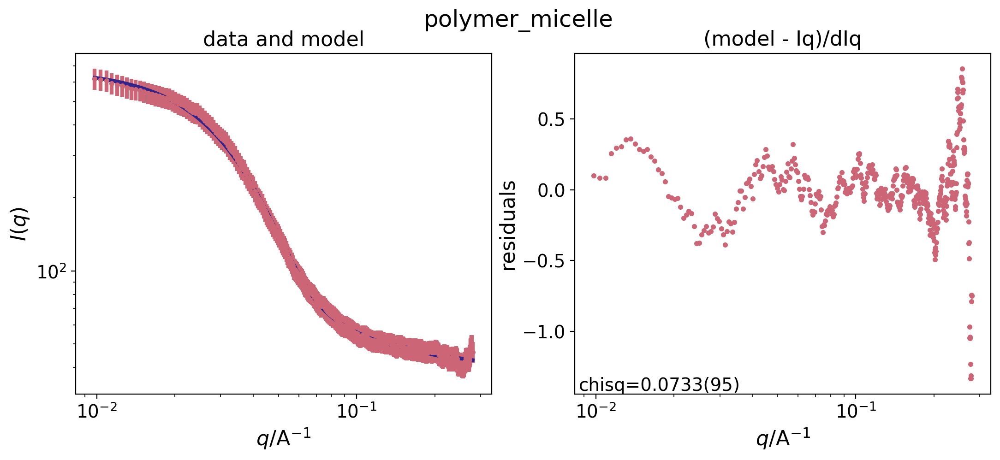

final chisq 0.3957(95)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 46.13(25)       46.13(40)      
                                  radius 31.71(28)       31.71(44)      
                               radius_pd 0.4999910266(11) 0.4999910266(18)
                                   scale 12.04(19)       12.04(31)      


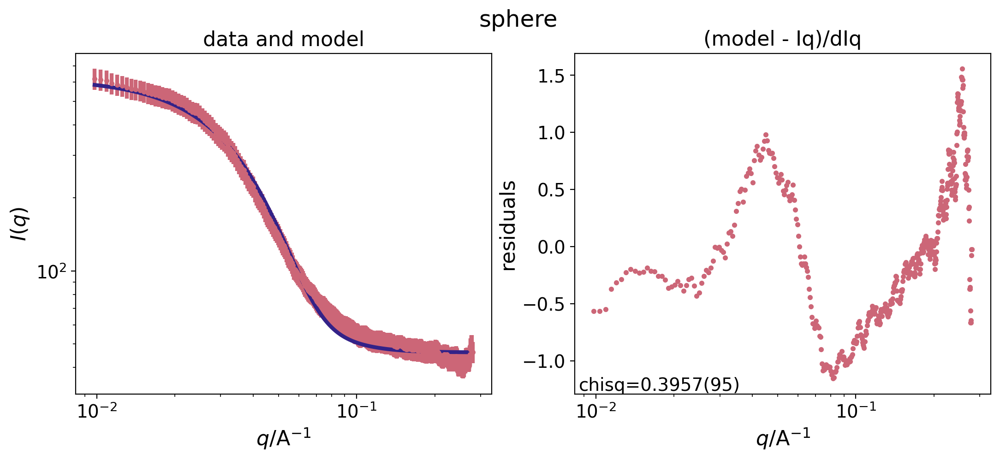

final chisq 1.0844(71)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 37.65(32)       37.65(31)      
                                  i_zero 1091(48)        1091(46)       
                                      rg 115.3(33)       115.3(31)      


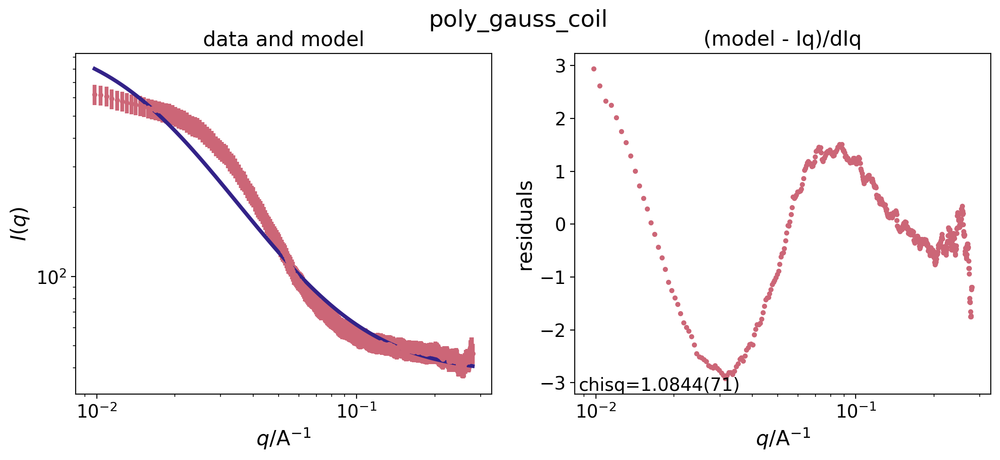

{'polymer_micelle': {'chisqr': 0.0733262761619366, 'params': {'background': {'fit_val': 40.36050586613893, 'fit_err': 0.42439872998486333}, 'radius_core': {'fit_val': 37.57570570705137, 'fit_err': 0.5445371736147826}, 'rg': {'fit_val': 18.45941499011973, 'fit_err': 0.892787296342418}, 'scale': {'fit_val': 1133.5314539388482, 'fit_err': 27.743620287185088}}}, 'sphere': {'chisqr': 0.3956869628987544, 'params': {'background': {'fit_val': 46.12894589777992, 'fit_err': 0.2529980464514114}, 'radius': {'fit_val': 31.712040277348127, 'fit_err': 0.2798154442888383}, 'radius_pd': {'fit_val': 0.4999910266445527, 'fit_err': 1.1454880119492616e-09}, 'scale': {'fit_val': 12.037725529211352, 'fit_err': 0.1933405971030695}}}, 'poly_gauss_coil': {'chisqr': 1.0844277466252634, 'params': {'background': {'fit_val': 37.645536020330326, 'fit_err': 0.3219934402451803}, 'i_zero': {'fit_val': 1091.0785462052927, 'fit_err': 48.11711750296333}, 'rg': {'fit_val': 115.348889349386, 'fit_err': 3.2607146237511455}}}

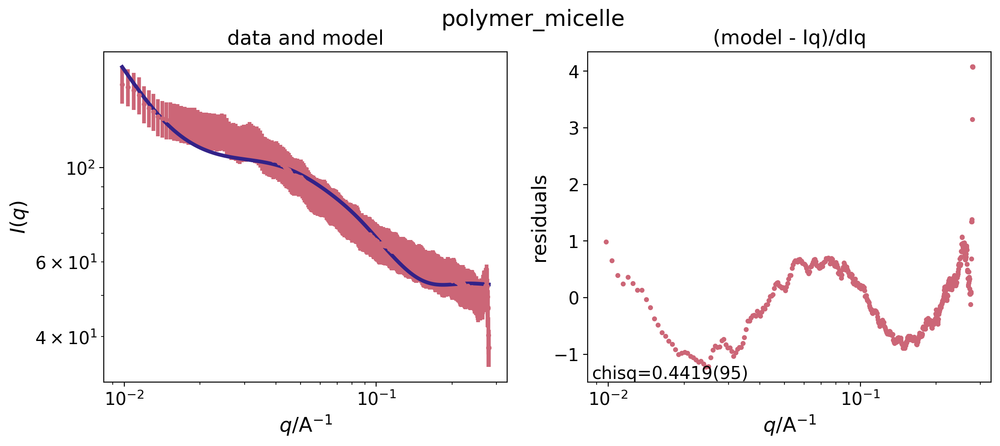

final chisq 0.4010(95)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 52.74(36)       52.74(56)      
                                  radius 15.34(33)       15.34(52)      
                               radius_pd 0.4999671224(11) 0.4999671224(18)
                                   scale 12.72(67)       12.7(11)       


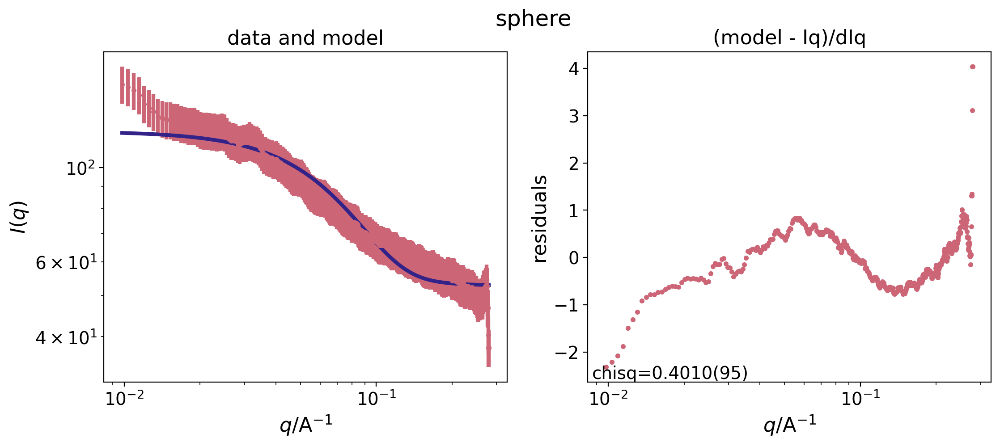

final chisq 0.1491(71)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 47.37(52)       47.4(14)       
                                  i_zero 88.4(25)        88.4(64)       
                                      rg 31.9(12)        31.9(31)       


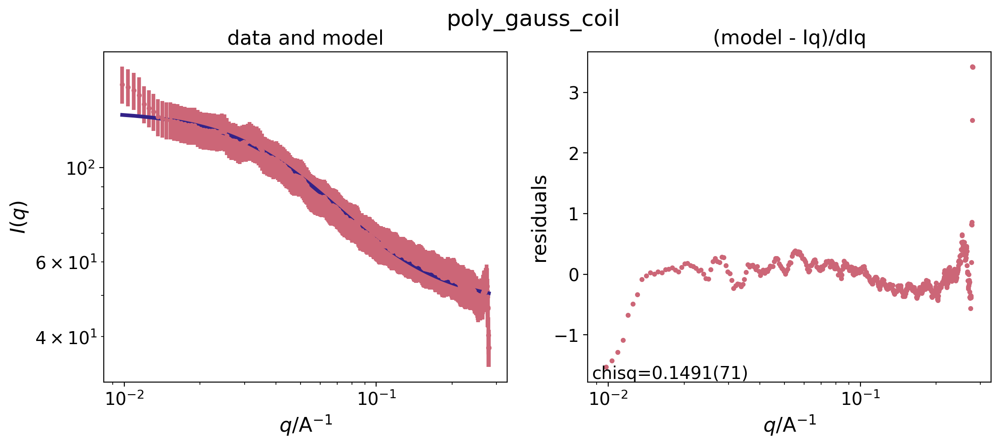

{'polymer_micelle': {'chisqr': 0.44188781252010206, 'params': {'background': {'fit_val': 52.89604999293639, 'fit_err': 0.3475789791661518}, 'radius_core': {'fit_val': 24.489155901246754, 'fit_err': 0.5018523875586776}, 'rg': {'fit_val': 135.1236436859846, 'fit_err': 6.698706735503982}, 'scale': {'fit_val': 550.5277286458637, 'fit_err': 15.422689302515735}}}, 'sphere': {'chisqr': 0.4010070138318638, 'params': {'background': {'fit_val': 52.74186169805509, 'fit_err': 0.35647784031230084}, 'radius': {'fit_val': 15.343898235350972, 'fit_err': 0.3262577619035496}, 'radius_pd': {'fit_val': 0.49996712241982344, 'fit_err': 1.134088556672996e-09}, 'scale': {'fit_val': 12.717593370417287, 'fit_err': 0.6700508338548351}}}, 'poly_gauss_coil': {'chisqr': 0.14911323011606942, 'params': {'background': {'fit_val': 47.36538680542883, 'fit_err': 0.5219955934528154}, 'i_zero': {'fit_val': 88.43220932772715, 'fit_err': 2.486363113282583}, 'rg': {'fit_val': 31.91572879079376, 'fit_err': 1.186371582755863}}}

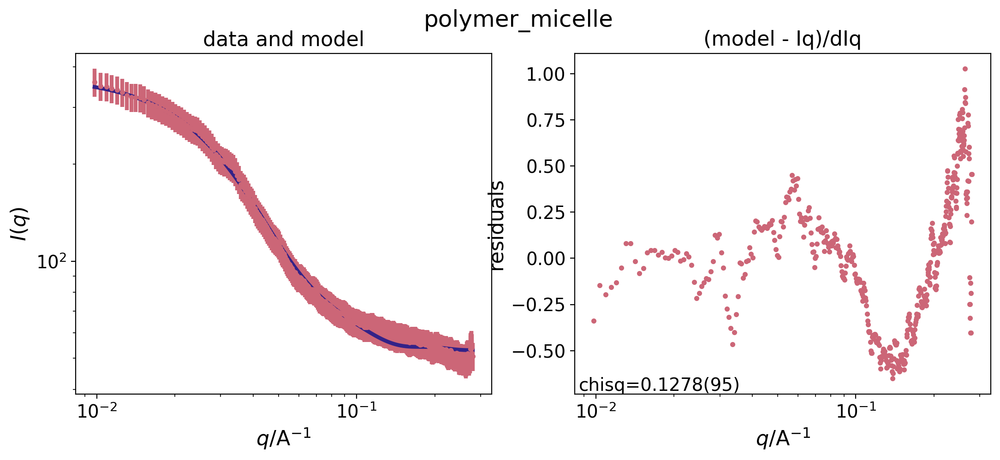

final chisq 0.4714(95)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 54.89(30)       54.89(43)      
                                  radius 28.95(36)       28.95(53)      
                               radius_pd 0.4999653992(11) 0.4999653992(16)
                                   scale 7.46(19)        7.46(27)       


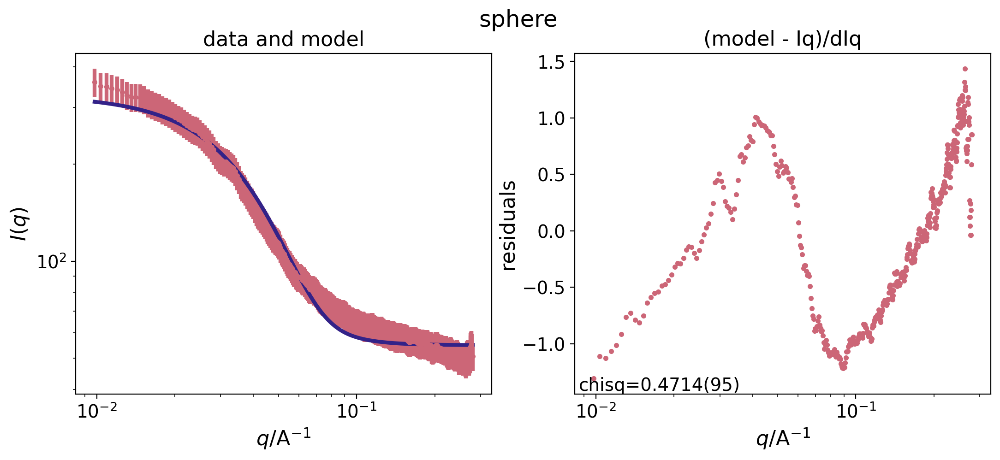

final chisq 0.1657(71)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 48.28(37)       48.28(92)      
                                  i_zero 424(16)         424(40)        
                                      rg 82.1(24)        82.1(59)       


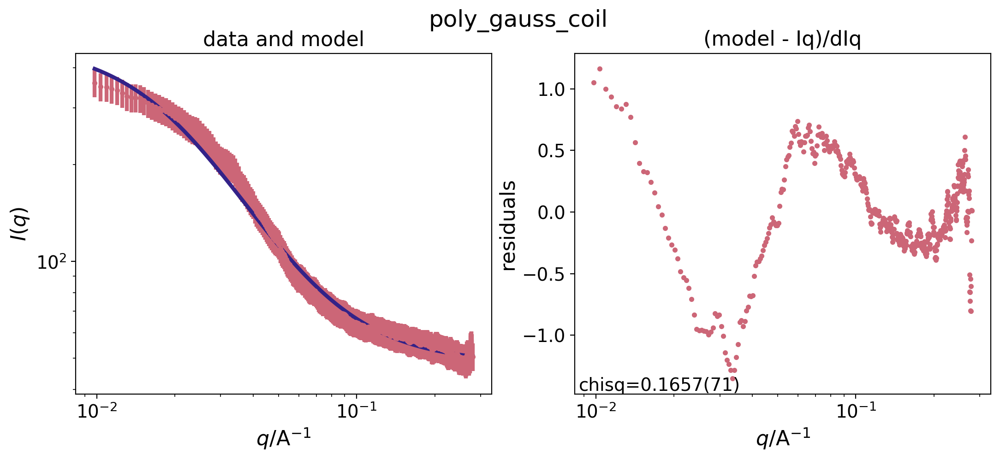

{'polymer_micelle': {'chisqr': 0.12782347767939342, 'params': {'background': {'fit_val': 52.16418790278853, 'fit_err': 0.3206123696112741}, 'radius_core': {'fit_val': 29.186239868608187, 'fit_err': 0.6163368977046498}, 'rg': {'fit_val': 24.28602762795003, 'fit_err': 1.130037615325658}, 'scale': {'fit_val': 571.7352818633921, 'fit_err': 17.825684437838632}}}, 'sphere': {'chisqr': 0.4714452353693815, 'params': {'background': {'fit_val': 54.88595360573141, 'fit_err': 0.2971239956108277}, 'radius': {'fit_val': 28.950804827240006, 'fit_err': 0.36485000439966364}, 'radius_pd': {'fit_val': 0.4999653991729373, 'fit_err': 1.1279274007346675e-09}, 'scale': {'fit_val': 7.46465100563055, 'fit_err': 0.1866922547696039}}}, 'poly_gauss_coil': {'chisqr': 0.16571693868725582, 'params': {'background': {'fit_val': 48.27521820897664, 'fit_err': 0.3729317636536033}, 'i_zero': {'fit_val': 423.68231769960477, 'fit_err': 16.42704605035629}, 'rg': {'fit_val': 82.1089945378663, 'fit_err': 2.41720642905613}}}}
B

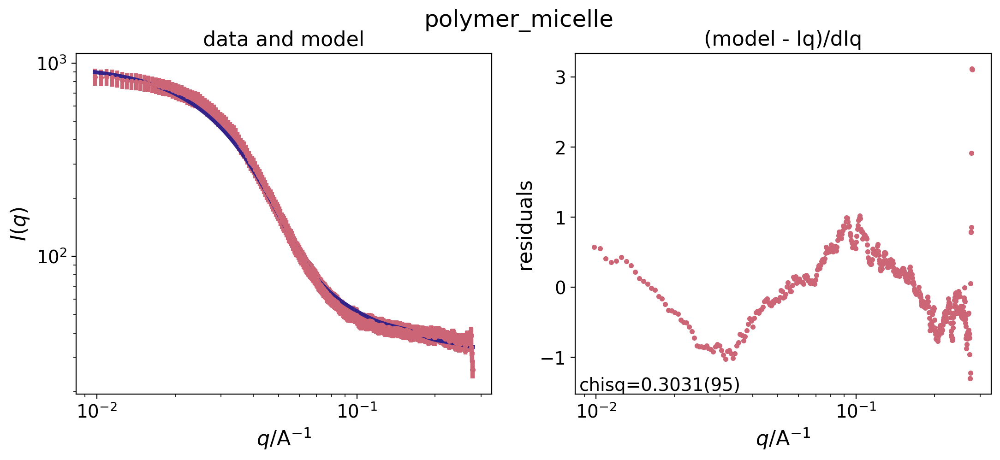

final chisq 0.5075(95)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 38.32(22)       38.32(30)      
                                  radius 32.66(24)       32.66(33)      
                               radius_pd 0.4999524241(11) 0.4999524241(16)
                                   scale 16.87(22)       16.87(30)      


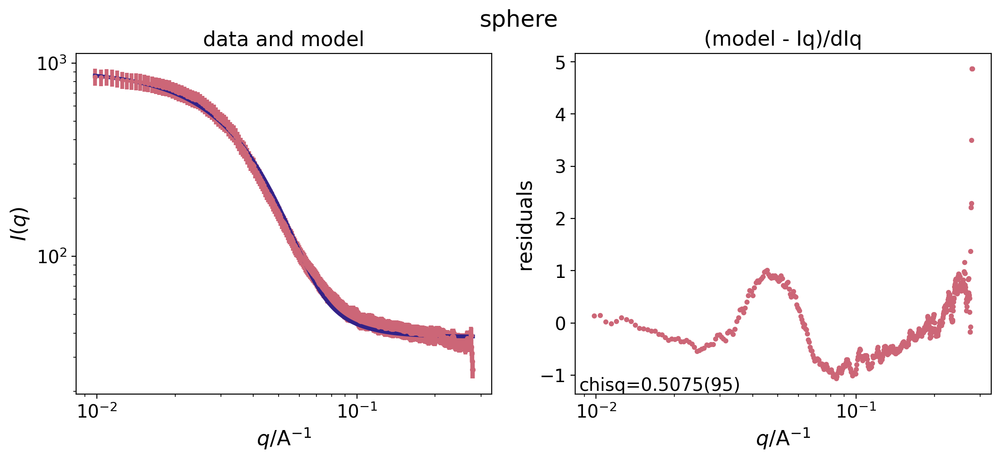

final chisq 2.3984(71)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 29.16(28)       29.16(18)      
                                  i_zero 1.99(10)e3      1989(67)       
                                      rg 145.4(45)       145.4(29)      


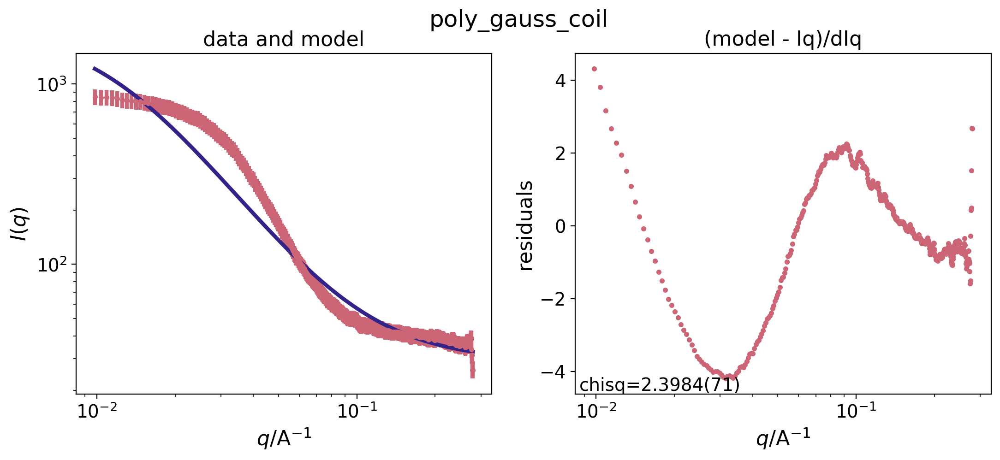

{'polymer_micelle': {'chisqr': 0.3031389896456718, 'params': {'background': {'fit_val': 30.488748691819254, 'fit_err': 0.4126562771545388}, 'radius_core': {'fit_val': 38.962376342325975, 'fit_err': 0.4353694433626287}, 'rg': {'fit_val': 19.21940170578756, 'fit_err': 0.6847746414735343}, 'scale': {'fit_val': 1686.6843031226674, 'fit_err': 39.86932590282848}}}, 'sphere': {'chisqr': 0.50753260201819, 'params': {'background': {'fit_val': 38.32265343363096, 'fit_err': 0.21526604559299978}, 'radius': {'fit_val': 32.65783419101826, 'fit_err': 0.237076614579969}, 'radius_pd': {'fit_val': 0.4999524240702968, 'fit_err': 1.1459338898340144e-09}, 'scale': {'fit_val': 16.868912870086742, 'fit_err': 0.21680972955040434}}}, 'poly_gauss_coil': {'chisqr': 2.3984449002879202, 'params': {'background': {'fit_val': 29.159225939618025, 'fit_err': 0.28012212006358916}, 'i_zero': {'fit_val': 1988.5912637440638, 'fit_err': 104.46796785674852}, 'rg': {'fit_val': 145.35981271892658, 'fit_err': 4.505615784258878}

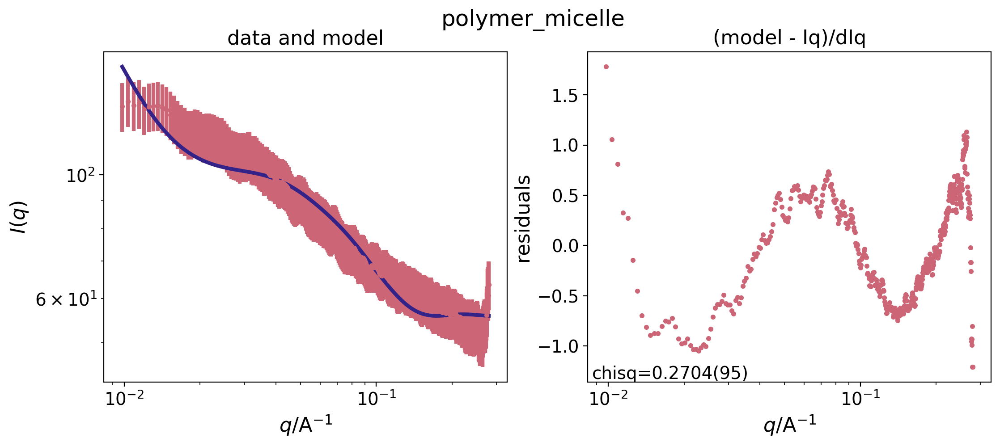

final chisq 0.2350(95)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 55.69(36)       55.69(75)      
                                  radius 16.29(40)       16.29(83)      
                               radius_pd 0.4999694918(11) 0.4999694918(24)
                                   scale 9.45(58)        9.4(12)        


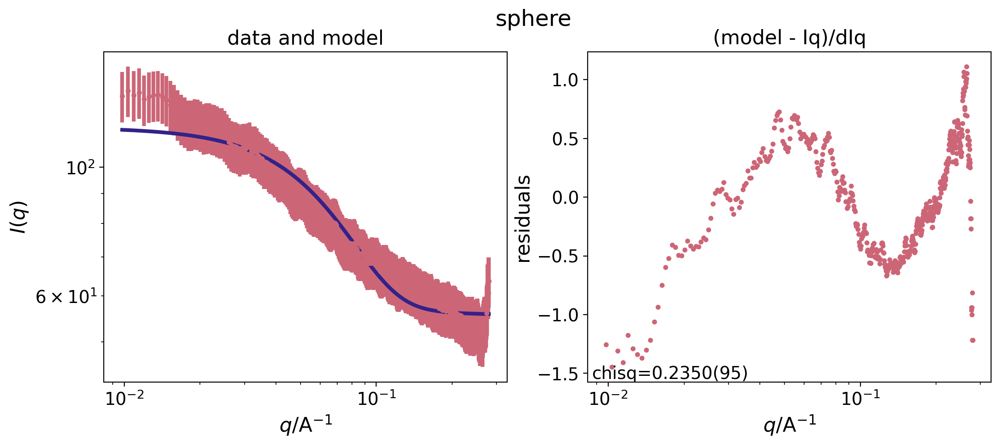

final chisq 0.0760(71)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 51.35(51)       51.3(19)       
                                  i_zero 78.8(26)        78.8(93)       
                                      rg 34.6(15)        34.6(54)       


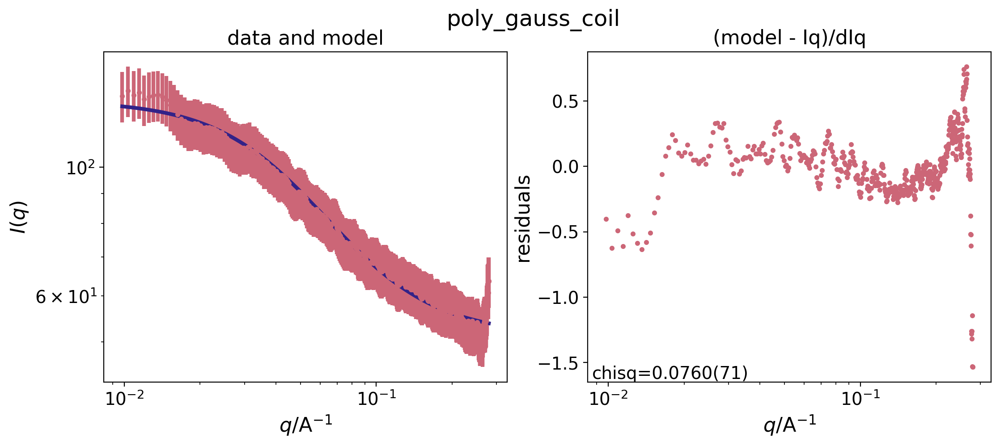

{'polymer_micelle': {'chisqr': 0.2703619880572193, 'params': {'background': {'fit_val': 55.80101079948033, 'fit_err': 0.3556431933216336}, 'radius_core': {'fit_val': 25.966144175614467, 'fit_err': 0.6201073063227246}, 'rg': {'fit_val': 141.85686376260395, 'fit_err': 8.027875690423857}, 'scale': {'fit_val': 491.0781183833452, 'fit_err': 15.573463937991596}}}, 'sphere': {'chisqr': 0.23497476929111083, 'params': {'background': {'fit_val': 55.690467302156975, 'fit_err': 0.3625050968049833}, 'radius': {'fit_val': 16.291505821030807, 'fit_err': 0.4013363322779898}, 'radius_pd': {'fit_val': 0.49996949176618366, 'fit_err': 1.1400220363614744e-09}, 'scale': {'fit_val': 9.446339788815012, 'fit_err': 0.5783791957576541}}}, 'poly_gauss_coil': {'chisqr': 0.07601280589460702, 'params': {'background': {'fit_val': 51.347815204250544, 'fit_err': 0.512677157576537}, 'i_zero': {'fit_val': 78.79636663242097, 'fit_err': 2.5660570722808833}, 'rg': {'fit_val': 34.63524596795023, 'fit_err': 1.4832807920051687

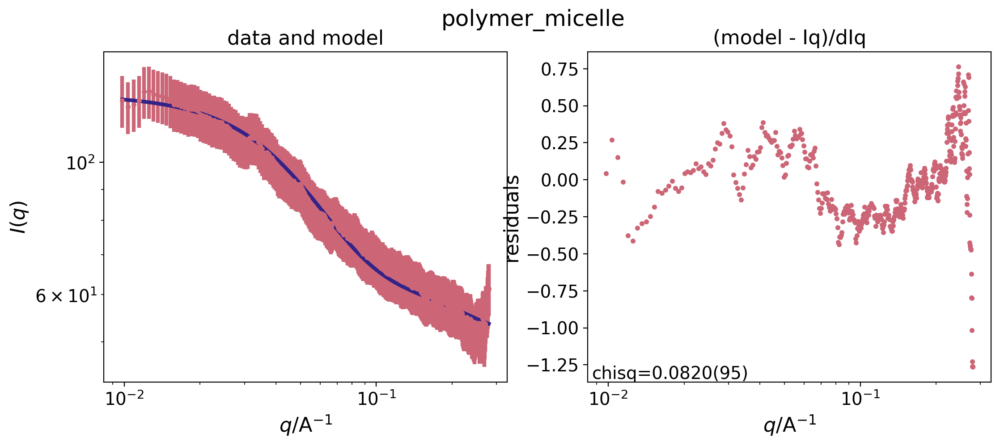

final chisq 0.2389(95)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 56.08(36)       56.08(75)      
                                  radius 16.37(40)       16.37(82)      
                               radius_pd 0.4999525381(11) 0.4999525381(23)
                                   scale 9.41(57)        9.4(12)        


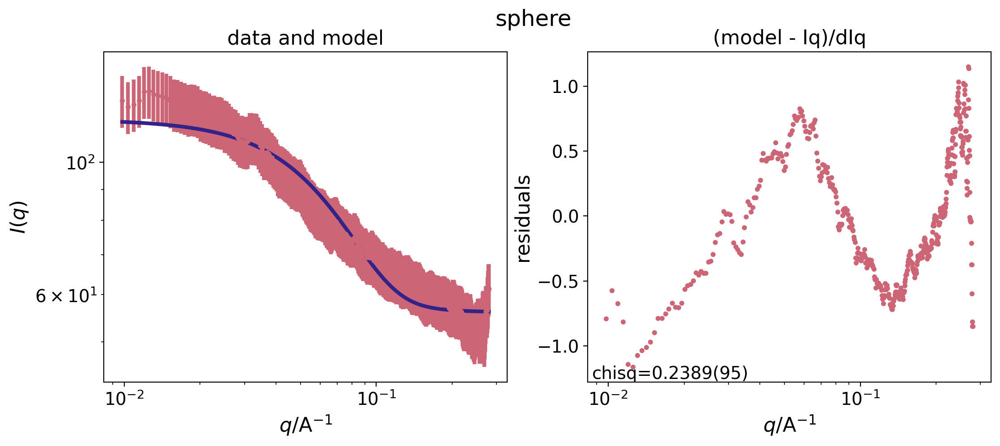

final chisq 0.0689(71)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 51.59(52)       51.6(20)       
                                  i_zero 79.0(25)        79.0(97)       
                                      rg 34.3(15)        34.3(56)       


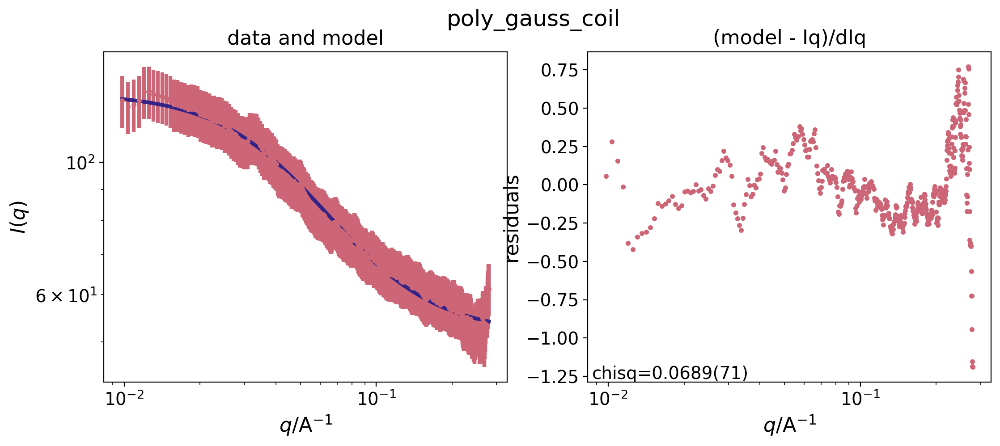

{'polymer_micelle': {'chisqr': 0.08198504439928858, 'params': {'background': {'fit_val': 52.186116619718554, 'fit_err': 3.2914814587843417}, 'radius_core': {'fit_val': 11.692544353461592, 'fit_err': 3.6782262102175336}, 'rg': {'fit_val': 17.10025372616506, 'fit_err': 1.4038024214609484}, 'scale': {'fit_val': 138.49245460256148, 'fit_err': 7.0840258485088174}}}, 'sphere': {'chisqr': 0.23887037488543525, 'params': {'background': {'fit_val': 56.07624703106428, 'fit_err': 0.3644230124322005}, 'radius': {'fit_val': 16.371929992144413, 'fit_err': 0.40253780703578107}, 'radius_pd': {'fit_val': 0.49995253806590095, 'fit_err': 1.1379938444114755e-09}, 'scale': {'fit_val': 9.405985363732588, 'fit_err': 0.5738807829203996}}}, 'poly_gauss_coil': {'chisqr': 0.06890239719367373, 'params': {'background': {'fit_val': 51.593880410358636, 'fit_err': 0.5171658762558644}, 'i_zero': {'fit_val': 78.9899894492727, 'fit_err': 2.546862415439538}, 'rg': {'fit_val': 34.31649529144904, 'fit_err': 1.45850236607024

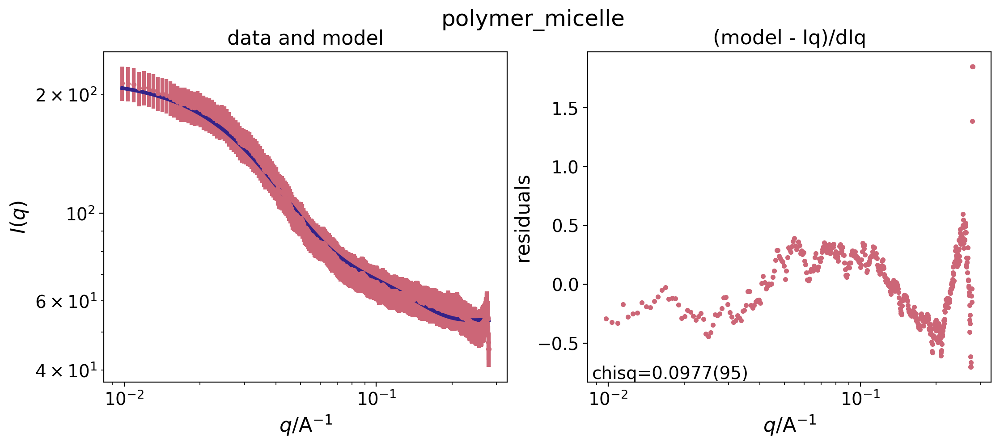

final chisq 0.4468(95)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 56.67(31)       56.67(47)      
                                  radius 25.09(43)       25.09(65)      
                               radius_pd 0.4999891602(11) 0.4999891602(17)
                                   scale 5.90(22)        5.90(33)       


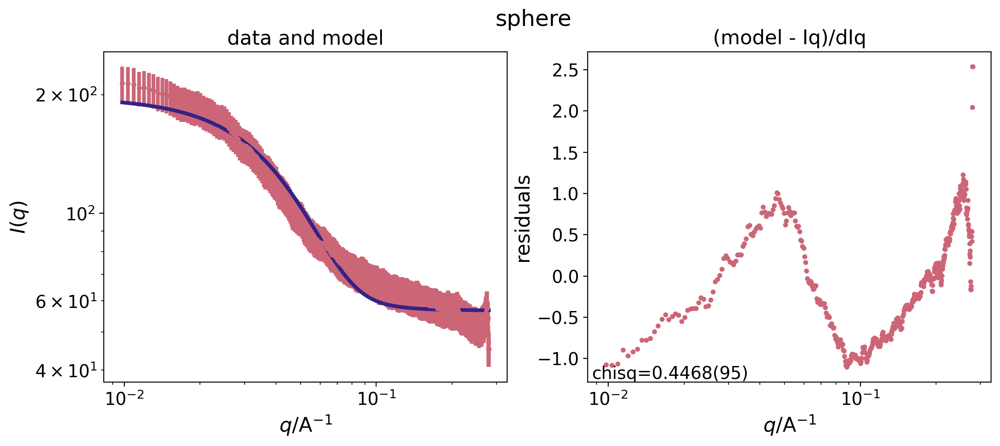

final chisq 0.1008(71)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 51.52(40)       51.5(13)       
                                  i_zero 191.6(70)       192(22)        
                                      rg 60.5(20)        60.5(64)       


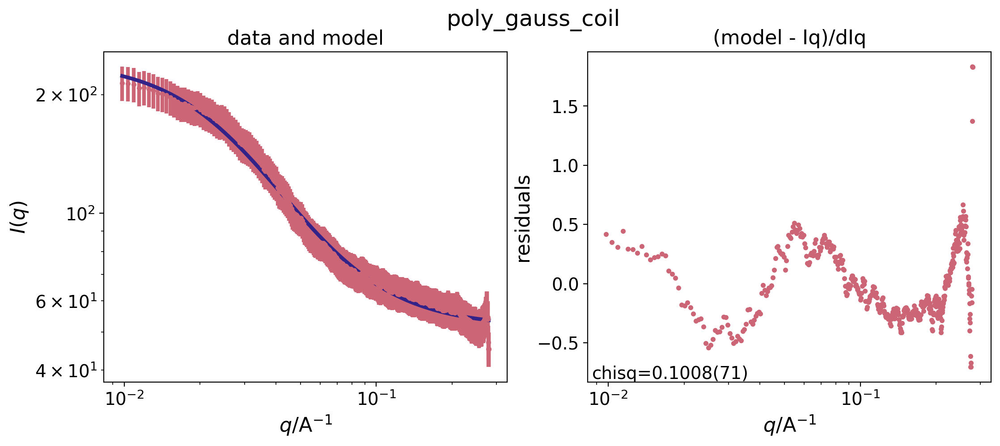

{'polymer_micelle': {'chisqr': 0.09769007008542815, 'params': {'background': {'fit_val': 53.077430613668675, 'fit_err': 0.42802290940755583}, 'radius_core': {'fit_val': 19.072078099837533, 'fit_err': 0.621064889152321}, 'rg': {'fit_val': 25.81682549971248, 'fit_err': 1.1686567188278558}, 'scale': {'fit_val': 295.91982876305417, 'fit_err': 10.226957382321997}}}, 'sphere': {'chisqr': 0.44676679546025555, 'params': {'background': {'fit_val': 56.66525277107269, 'fit_err': 0.31488108020772265}, 'radius': {'fit_val': 25.094610945643797, 'fit_err': 0.4311640623548968}, 'radius_pd': {'fit_val': 0.49998916019163997, 'fit_err': 1.1313031546523588e-09}, 'scale': {'fit_val': 5.904052560985333, 'fit_err': 0.21979849103559346}}}, 'poly_gauss_coil': {'chisqr': 0.10083788104475395, 'params': {'background': {'fit_val': 51.52138031499865, 'fit_err': 0.4019956877870563}, 'i_zero': {'fit_val': 191.55697293702246, 'fit_err': 7.0295454628283}, 'rg': {'fit_val': 60.493933424857936, 'fit_err': 2.0359156854330

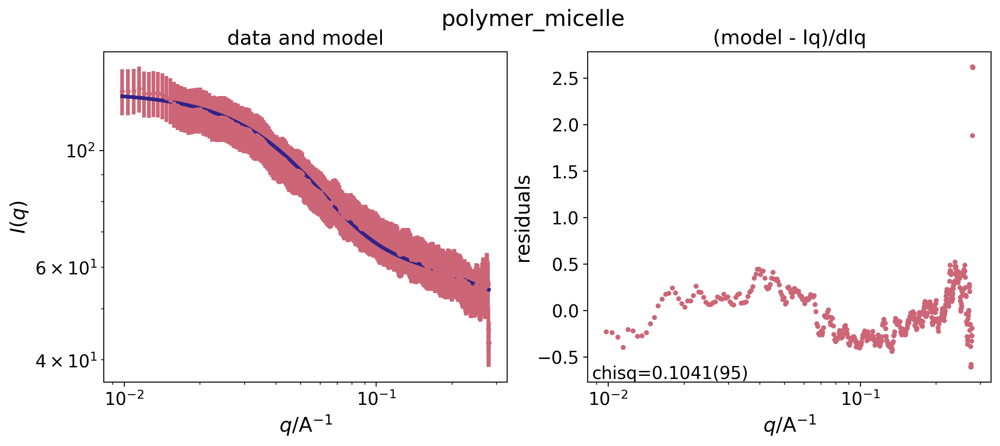

final chisq 0.2823(95)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 56.77(37)       56.77(70)      
                                  radius 16.07(41)       16.07(77)      
                               radius_pd 0.4999817828(11) 0.4999817828(21)
                                   scale 9.55(61)        9.5(11)        


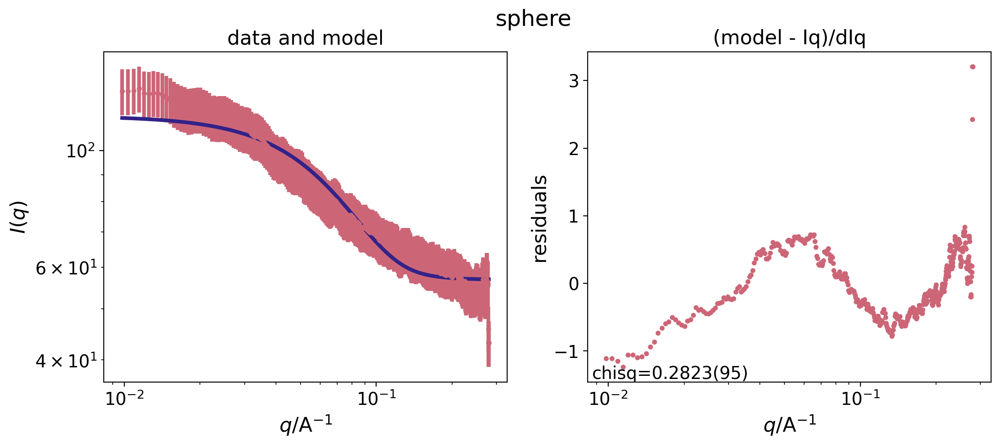

final chisq 0.0973(71)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 52.32(53)       52.3(17)       
                                  i_zero 76.0(25)        76.0(79)       
                                      rg 33.5(15)        33.5(47)       


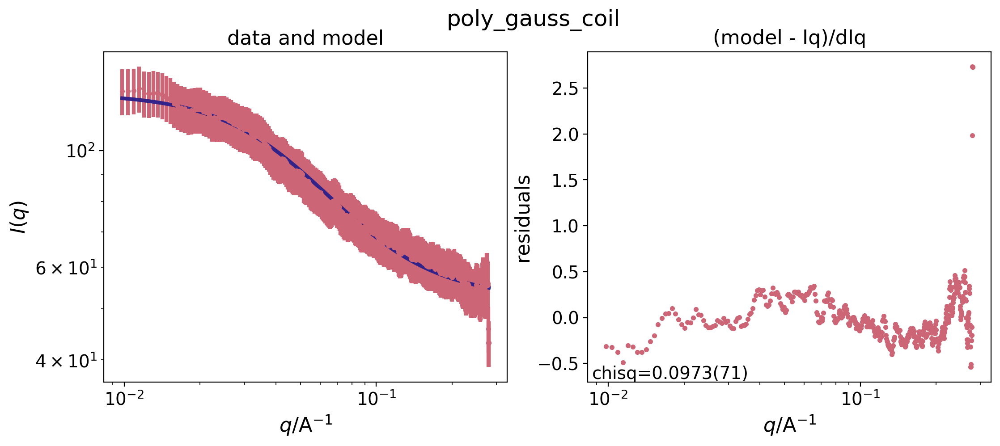

{'polymer_micelle': {'chisqr': 0.10412920482954775, 'params': {'background': {'fit_val': 52.390918976541016, 'fit_err': 5.299537969239473}, 'radius_core': {'fit_val': 10.91531884130426, 'fit_err': 5.433064238501266}, 'rg': {'fit_val': 17.45318859617318, 'fit_err': 1.624369961027458}, 'scale': {'fit_val': 136.73632661013673, 'fit_err': 10.152514859679778}}}, 'sphere': {'chisqr': 0.28230977170365296, 'params': {'background': {'fit_val': 56.773680814098334, 'fit_err': 0.37408525258638275}, 'radius': {'fit_val': 16.07448898161634, 'fit_err': 0.4088220700064372}, 'radius_pd': {'fit_val': 0.49998178278754085, 'fit_err': 1.140928519841426e-09}, 'scale': {'fit_val': 9.545637712083767, 'fit_err': 0.6067754342223767}}}, 'poly_gauss_coil': {'chisqr': 0.0972592365988471, 'params': {'background': {'fit_val': 52.318439854518736, 'fit_err': 0.5299082079875357}, 'i_zero': {'fit_val': 75.97056817491953, 'fit_err': 2.472347748572088}, 'rg': {'fit_val': 33.481576960336234, 'fit_err': 1.4625429773383234}}

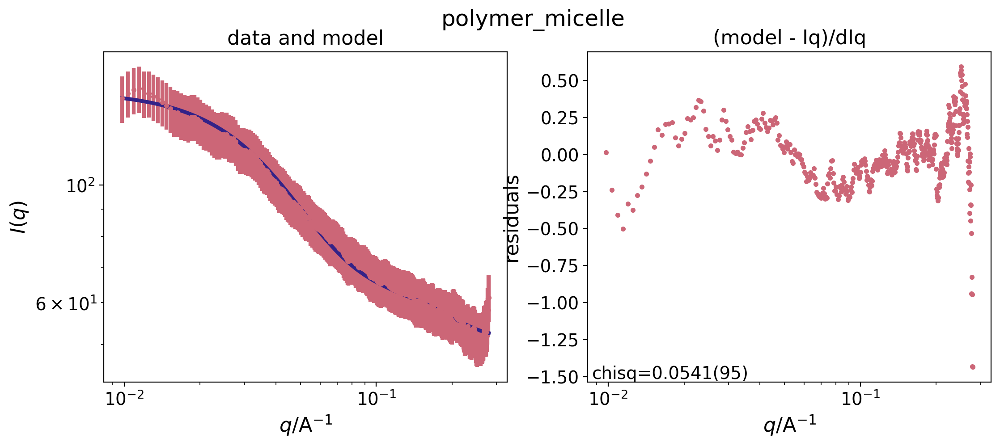

final chisq 0.3146(95)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 56.08(34)       56.08(61)      
                                  radius 19.06(43)       19.06(77)      
                               radius_pd 0.4999534045(11) 0.4999534045(20)
                                   scale 7.26(39)        7.26(70)       


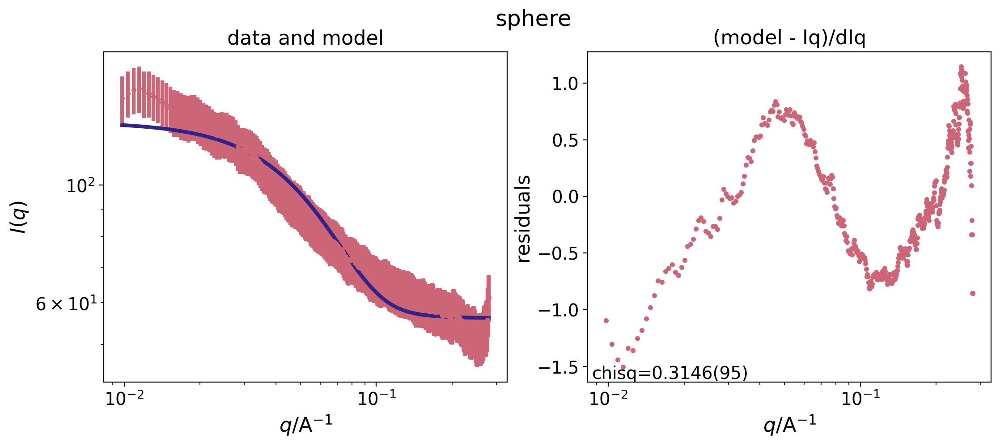

final chisq 0.0736(71)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 51.76(46)       51.8(17)       
                                  i_zero 98.8(34)        99(13)         
                                      rg 42.1(17)        42.1(62)       


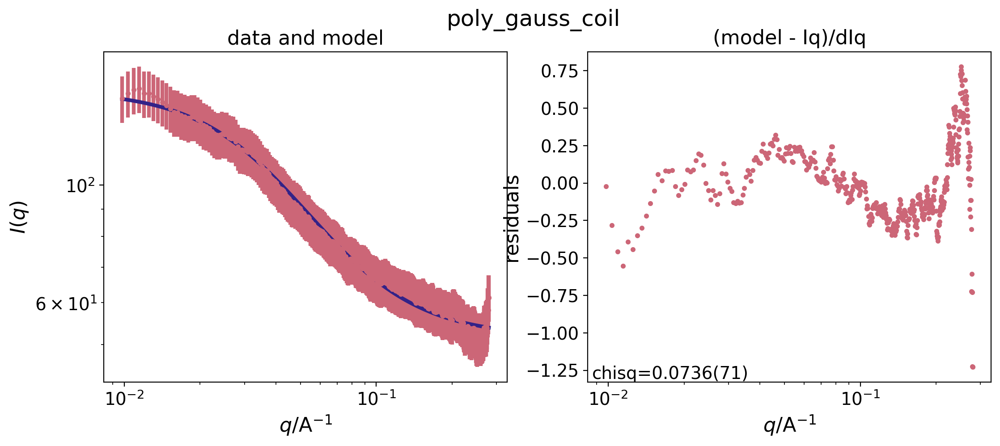

{'polymer_micelle': {'chisqr': 0.05412722773468221, 'params': {'background': {'fit_val': 51.87339857036009, 'fit_err': 1.3879947593936257}, 'radius_core': {'fit_val': 13.236589661375108, 'fit_err': 1.5414253574437287}, 'rg': {'fit_val': 21.796366965190966, 'fit_err': 1.0645001714301279}, 'scale': {'fit_val': 175.53000699899147, 'fit_err': 6.124098502356266}}}, 'sphere': {'chisqr': 0.31464322010589857, 'params': {'background': {'fit_val': 56.08133056235934, 'fit_err': 0.340237857216182}, 'radius': {'fit_val': 19.061690869428976, 'fit_err': 0.4323374596510055}, 'radius_pd': {'fit_val': 0.49995340451537795, 'fit_err': 1.1364644786081939e-09}, 'scale': {'fit_val': 7.255281076388825, 'fit_err': 0.39173603859843675}}}, 'poly_gauss_coil': {'chisqr': 0.07360800413464604, 'params': {'background': {'fit_val': 51.75718004015214, 'fit_err': 0.45783268536136734}, 'i_zero': {'fit_val': 98.84284986760726, 'fit_err': 3.4283656266378095}, 'rg': {'fit_val': 42.13882726786749, 'fit_err': 1.68913973072443

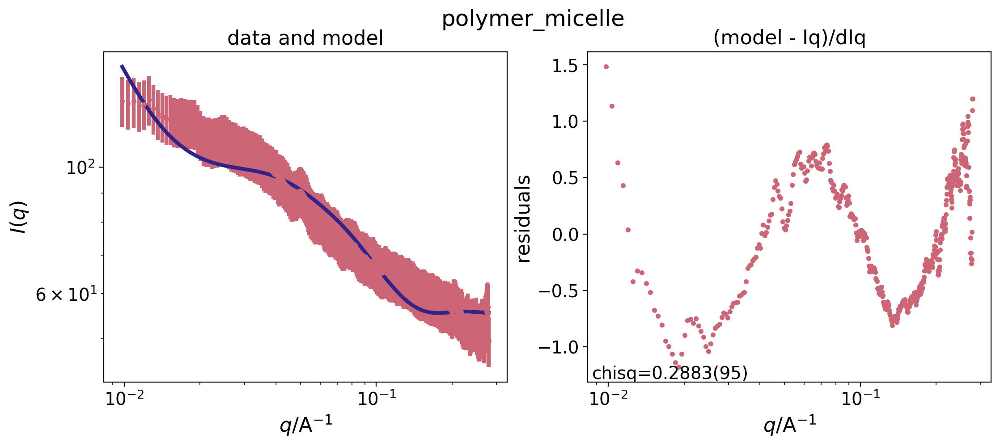

final chisq 0.2445(95)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 55.31(36)       55.31(73)      
                                  radius 16.07(41)       16.07(82)      
                               radius_pd 0.4999783777(11) 0.4999783777(23)
                                   scale 9.38(59)        9.4(12)        


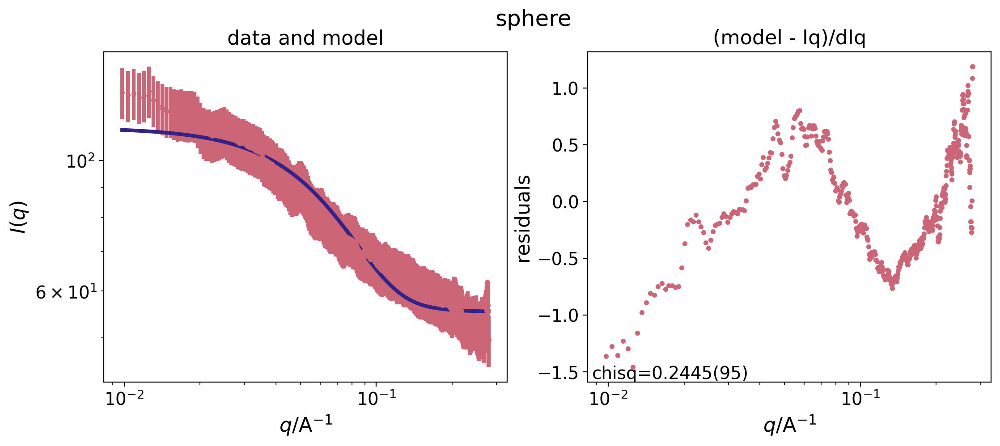

final chisq 0.0620(71)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 50.95(52)       50.9(21)       
                                  i_zero 74.6(24)        74.6(97)       
                                      rg 33.5(15)        33.5(59)       


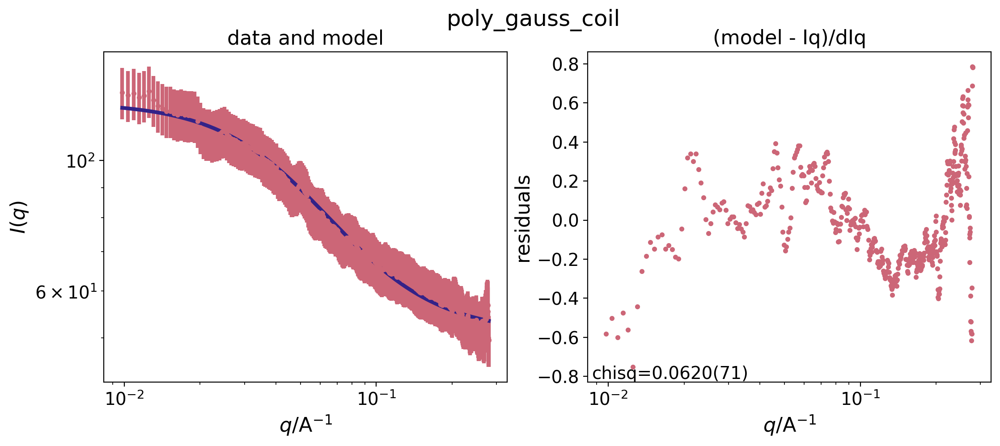

{'polymer_micelle': {'chisqr': 0.2882658992913092, 'params': {'background': {'fit_val': 55.40115234046746, 'fit_err': 0.35534299175190887}, 'radius_core': {'fit_val': 25.566397425194236, 'fit_err': 0.6268237789649665}, 'rg': {'fit_val': 143.6656523467009, 'fit_err': 8.378551595088847}, 'scale': {'fit_val': 468.53490017717445, 'fit_err': 15.068248892928786}}}, 'sphere': {'chisqr': 0.24447705785721185, 'params': {'background': {'fit_val': 55.310594023272564, 'fit_err': 0.3624804150598662}, 'radius': {'fit_val': 16.070434628405003, 'fit_err': 0.40576074253098754}, 'radius_pd': {'fit_val': 0.49997837765302366, 'fit_err': 1.1350373184678608e-09}, 'scale': {'fit_val': 9.379777859620052, 'fit_err': 0.5914073893622546}}}, 'poly_gauss_coil': {'chisqr': 0.06200199991610693, 'params': {'background': {'fit_val': 50.94876246566536, 'fit_err': 0.5167242689652682}, 'i_zero': {'fit_val': 74.59353240090212, 'fit_err': 2.4198593111511597}, 'rg': {'fit_val': 33.50572742752583, 'fit_err': 1.45777836172534

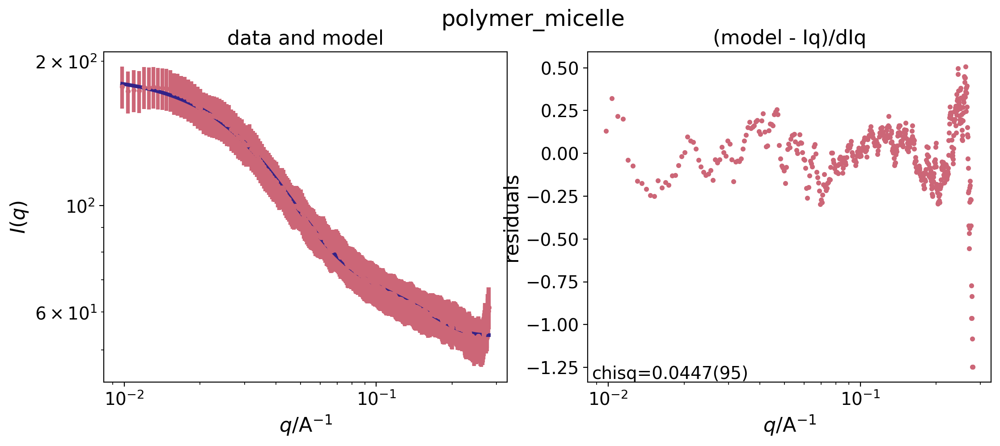

final chisq 0.3813(95)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 57.12(33)       57.12(54)      
                                  radius 21.44(41)       21.44(67)      
                               radius_pd 0.4999538495(11) 0.4999538495(18)
                                   scale 7.10(31)        7.10(51)       


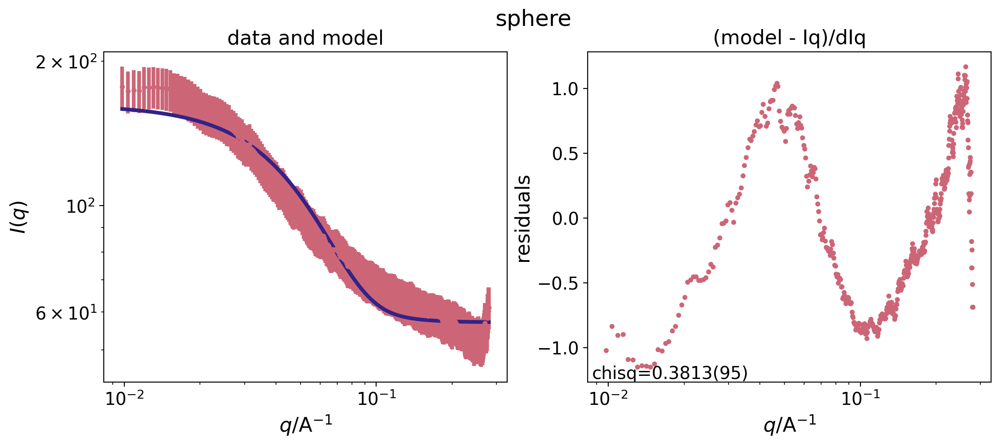

final chisq 0.0694(71)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 52.18(44)       52.2(17)       
                                  i_zero 141.1(49)       141(18)        
                                      rg 49.6(18)        49.6(67)       


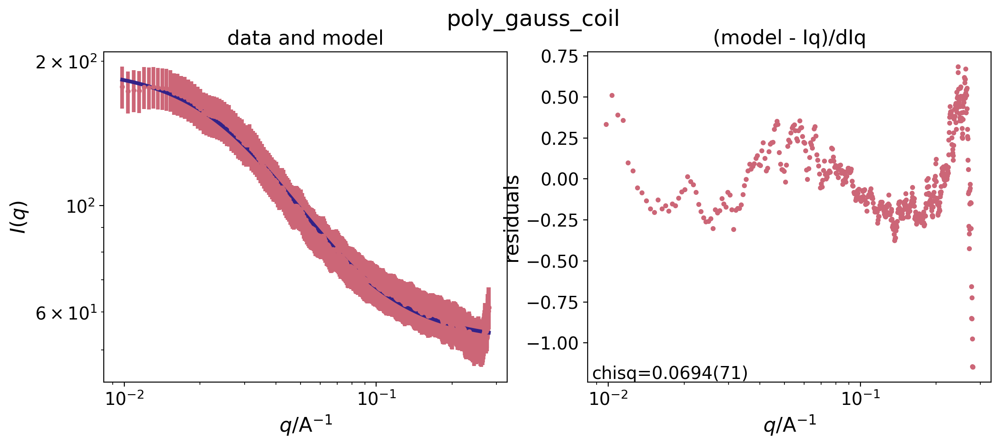

{'polymer_micelle': {'chisqr': 0.04465750679004593, 'params': {'background': {'fit_val': 53.4073919349016, 'fit_err': 0.6095112167169108}, 'radius_core': {'fit_val': 16.192789092137115, 'fit_err': 0.7689005911214859}, 'rg': {'fit_val': 23.76819890563001, 'fit_err': 1.0847429060929323}, 'scale': {'fit_val': 238.04390082983699, 'fit_err': 7.990762287236232}}}, 'sphere': {'chisqr': 0.3813084153915232, 'params': {'background': {'fit_val': 57.11823639914079, 'fit_err': 0.33078501422358425}, 'radius': {'fit_val': 21.441666388533097, 'fit_err': 0.41483889526584516}, 'radius_pd': {'fit_val': 0.49995384951411076, 'fit_err': 1.129692066290554e-09}, 'scale': {'fit_val': 7.098459559785225, 'fit_err': 0.31191464497021526}}}, 'poly_gauss_coil': {'chisqr': 0.0693892594907238, 'params': {'background': {'fit_val': 52.17984221405827, 'fit_err': 0.4363153947603069}, 'i_zero': {'fit_val': 141.07974697163516, 'fit_err': 4.863445020914497}, 'rg': {'fit_val': 49.56328782389278, 'fit_err': 1.756167354064063}}

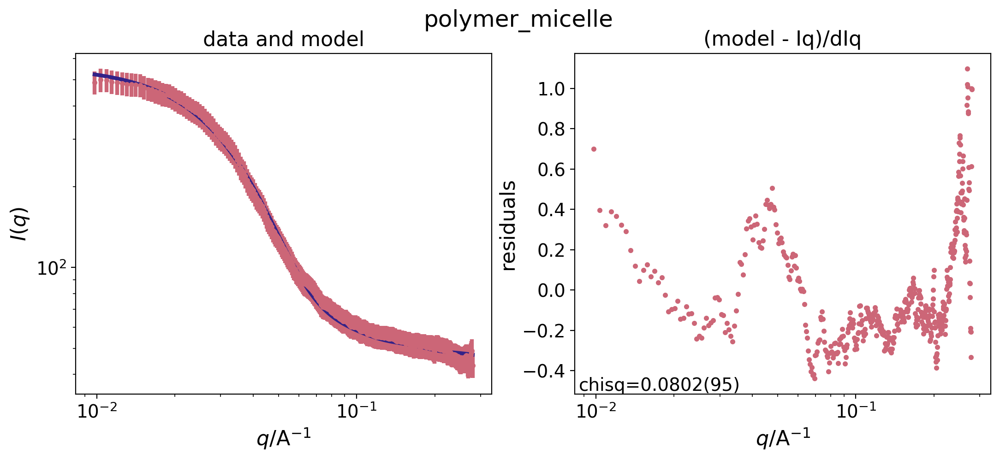

final chisq 0.4375(95)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 50.08(27)       50.08(41)      
                                  radius 31.25(31)       31.25(46)      
                               radius_pd 0.4999650434(11) 0.4999650434(17)
                                   scale 10.18(19)       10.18(28)      


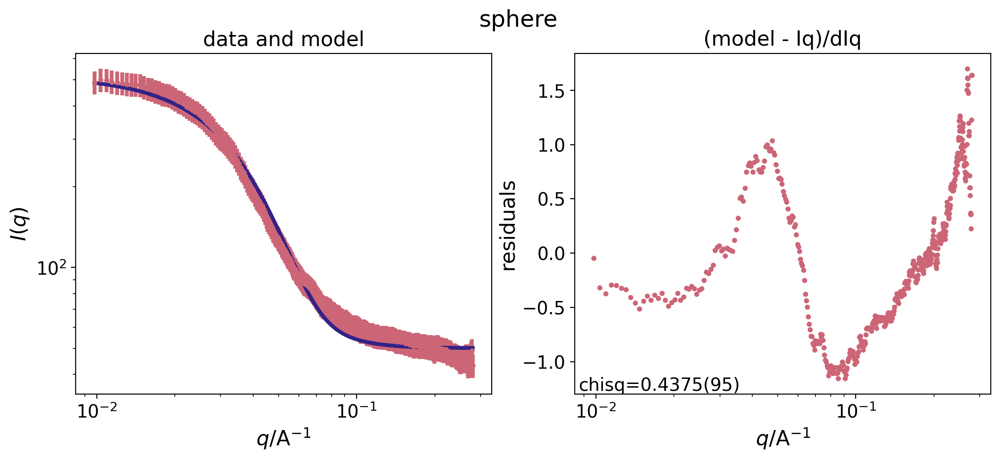

final chisq 0.6787(71)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 42.04(34)       42.04(42)      
                                  i_zero 801(33)         801(40)        
                                      rg 102.5(28)       102.5(34)      


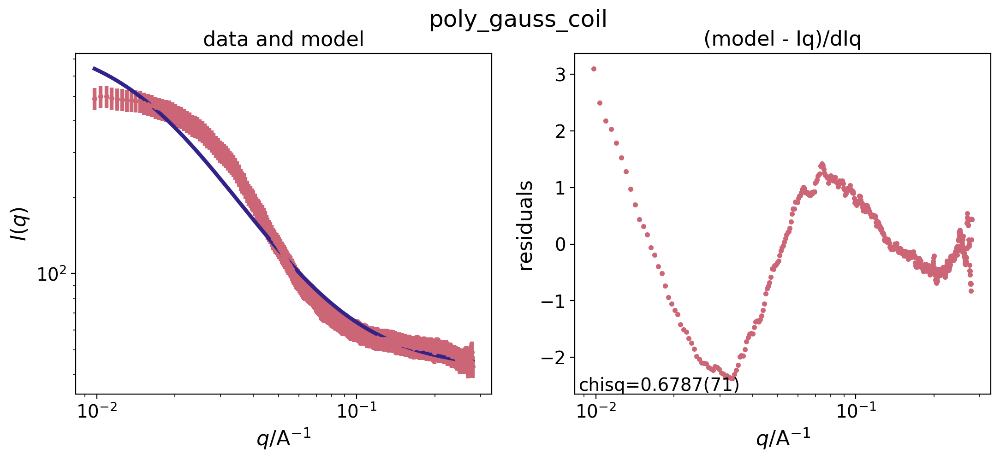

{'polymer_micelle': {'chisqr': 0.08015696819016008, 'params': {'background': {'fit_val': 45.28388959694979, 'fit_err': 0.4184475162619391}, 'radius_core': {'fit_val': 36.8345721221692, 'fit_err': 0.633323650829981}, 'rg': {'fit_val': 18.248689810291854, 'fit_err': 1.0233231284546556}, 'scale': {'fit_val': 923.1523307982375, 'fit_err': 23.33213299388303}}}, 'sphere': {'chisqr': 0.4374723655604244, 'params': {'background': {'fit_val': 50.08181121541603, 'fit_err': 0.27315299724510006}, 'radius': {'fit_val': 31.252193150388795, 'fit_err': 0.3068469260153391}, 'radius_pd': {'fit_val': 0.4999650434253179, 'fit_err': 1.1420006701103867e-09}, 'scale': {'fit_val': 10.175357757117792, 'fit_err': 0.1862996803360209}}}, 'poly_gauss_coil': {'chisqr': 0.6787048107925145, 'params': {'background': {'fit_val': 42.04054002944708, 'fit_err': 0.3434240422563391}, 'i_zero': {'fit_val': 800.7204742163848, 'fit_err': 32.8876586334719}, 'rg': {'fit_val': 102.47949940670327, 'fit_err': 2.836802490672374}}}}
B

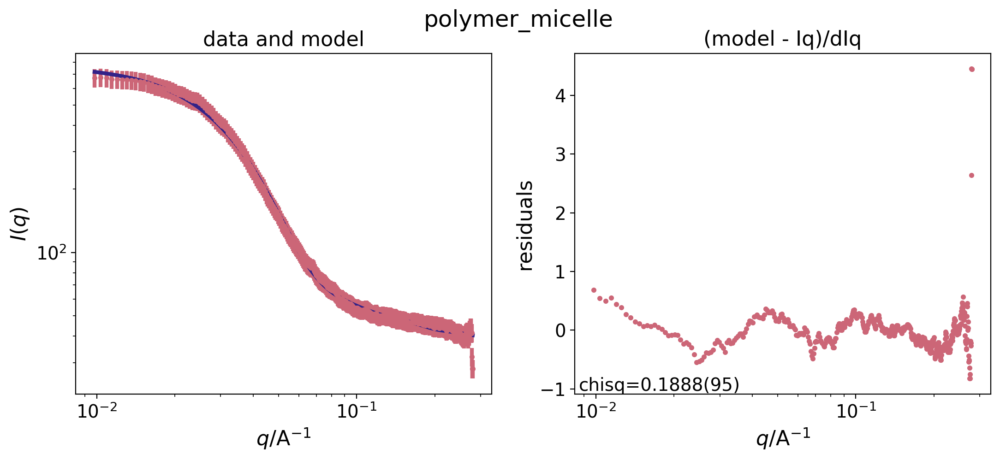

final chisq 0.6740(95)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 44.35(25)       44.35(30)      
                                  radius 31.85(26)       31.85(32)      
                               radius_pd 0.4999793188(11) 0.4999793188(14)
                                   scale 13.85(20)       13.85(25)      


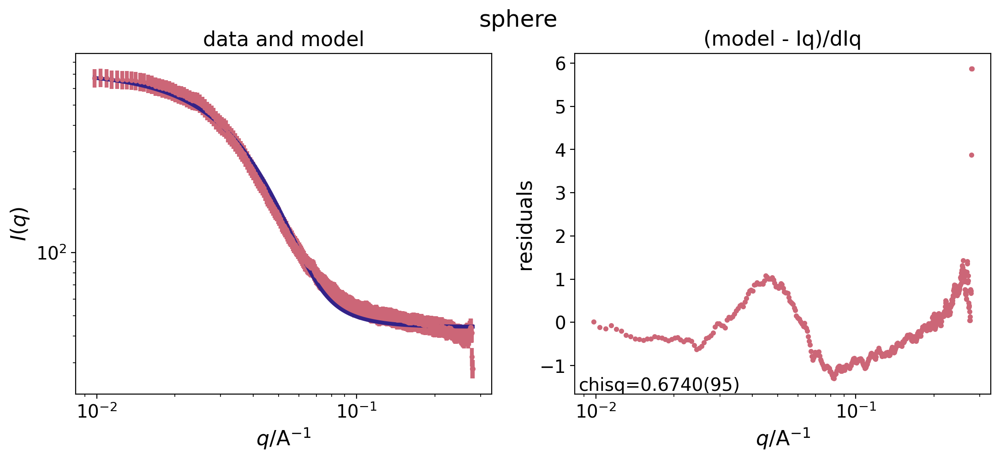

final chisq 1.4267(71)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 35.25(31)       35.25(26)      
                                  i_zero 1296(57)        1296(48)       
                                      rg 119.6(33)       119.6(28)      


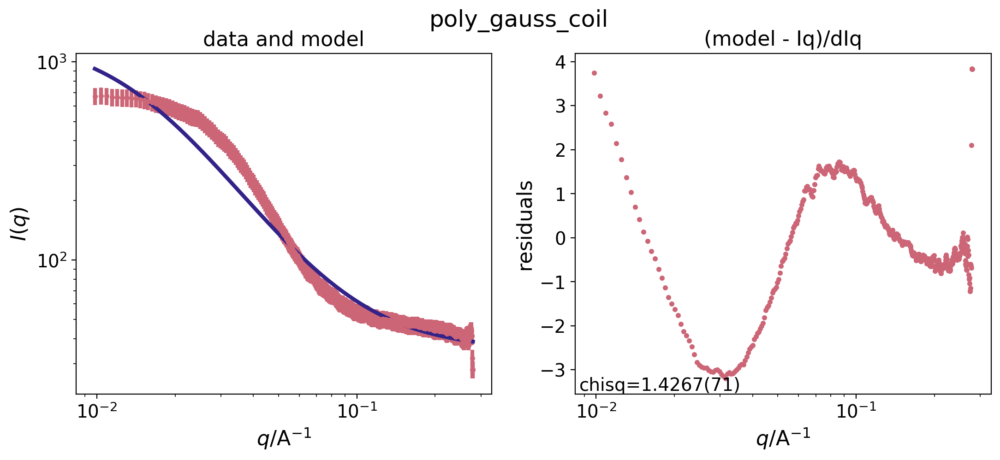

{'polymer_micelle': {'chisqr': 0.18883658416154142, 'params': {'background': {'fit_val': 37.26620745476432, 'fit_err': 0.47865596196101257}, 'radius_core': {'fit_val': 38.500438580819484, 'fit_err': 0.4985940637985256}, 'rg': {'fit_val': 17.491294674796254, 'fit_err': 0.7934867368411047}, 'scale': {'fit_val': 1315.836939530264, 'fit_err': 30.699422332265417}}}, 'sphere': {'chisqr': 0.6739872514503894, 'params': {'background': {'fit_val': 44.35014795239375, 'fit_err': 0.24563750377164373}, 'radius': {'fit_val': 31.85430983026918, 'fit_err': 0.2627290226142127}, 'radius_pd': {'fit_val': 0.4999793188089925, 'fit_err': 1.146404026870712e-09}, 'scale': {'fit_val': 13.853314003419511, 'fit_err': 0.20491579473088706}}}, 'poly_gauss_coil': {'chisqr': 1.4266893444711617, 'params': {'background': {'fit_val': 35.25087559435834, 'fit_err': 0.3137581728880345}, 'i_zero': {'fit_val': 1295.7877354071159, 'fit_err': 57.48533455071324}, 'rg': {'fit_val': 119.58336640312659, 'fit_err': 3.315023956116305

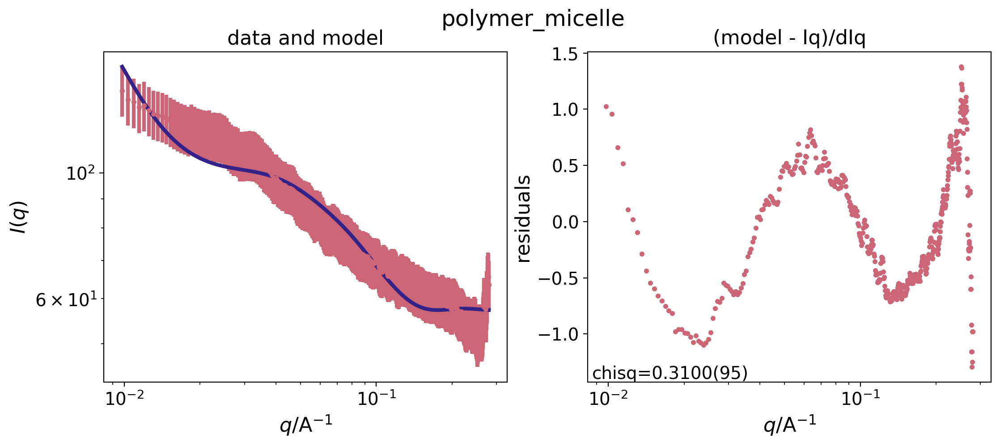

final chisq 0.2762(95)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 57.18(38)       57.18(72)      
                                  radius 16.20(42)       16.20(80)      
                               radius_pd 0.4999512802(11) 0.4999512802(22)
                                   scale 9.22(60)        9.2(11)        


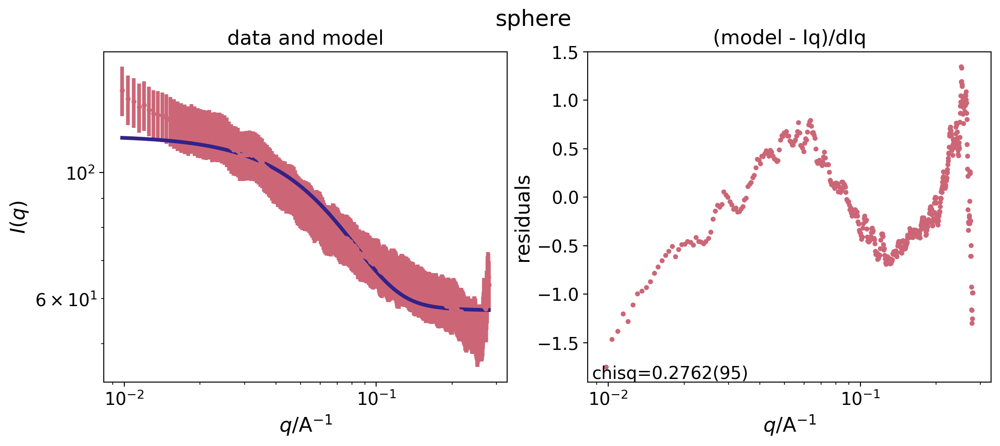

final chisq 0.1138(71)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 52.92(53)       52.9(16)       
                                  i_zero 75.6(25)        75.6(75)       
                                      rg 34.2(15)        34.2(45)       


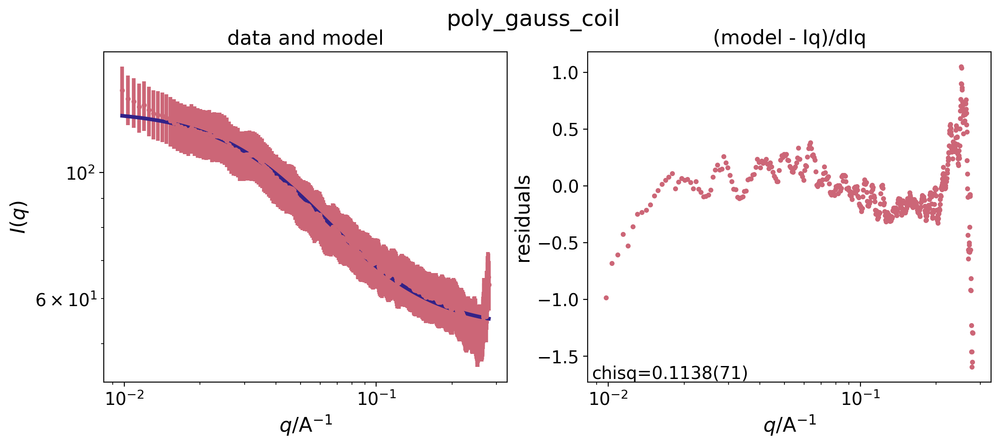

{'polymer_micelle': {'chisqr': 0.3100409731483948, 'params': {'background': {'fit_val': 57.260079194776154, 'fit_err': 0.3664787627674574}, 'radius_core': {'fit_val': 25.729830316342845, 'fit_err': 0.6482456861913879}, 'rg': {'fit_val': 141.56344816243532, 'fit_err': 8.268850456885122}, 'scale': {'fit_val': 470.6993881979437, 'fit_err': 15.512055186829235}}}, 'sphere': {'chisqr': 0.27618402049804364, 'params': {'background': {'fit_val': 57.178939364244286, 'fit_err': 0.3761448643302498}, 'radius': {'fit_val': 16.203163470449176, 'fit_err': 0.4191095834720085}, 'radius_pd': {'fit_val': 0.4999512801680766, 'fit_err': 1.1454629209473942e-09}, 'scale': {'fit_val': 9.22299946519798, 'fit_err': 0.5964913955263839}}}, 'poly_gauss_coil': {'chisqr': 0.11384911225550863, 'params': {'background': {'fit_val': 52.920273130045544, 'fit_err': 0.5268822401825257}, 'i_zero': {'fit_val': 75.58416474591907, 'fit_err': 2.5239883516957935}, 'rg': {'fit_val': 34.229446500959774, 'fit_err': 1.525795236340679

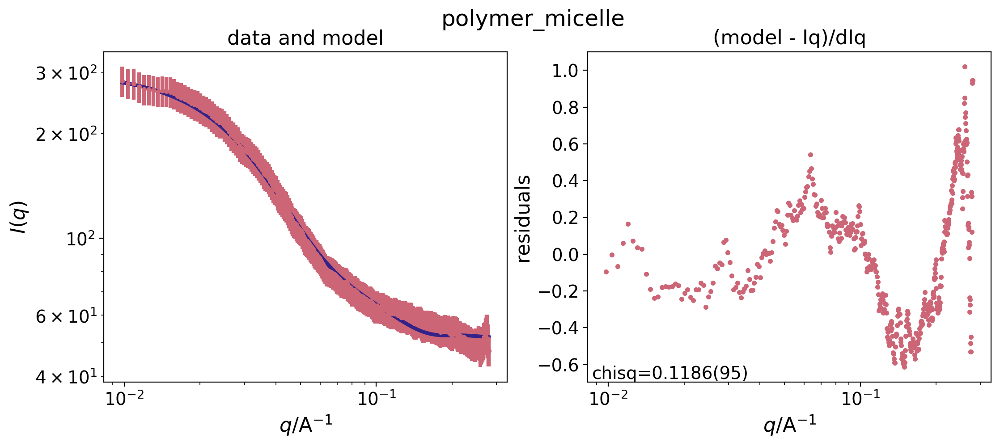

final chisq 0.4724(95)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 54.02(30)       54.02(43)      
                                  radius 27.11(37)       27.11(55)      
                               radius_pd 0.4999953518(11) 0.4999953518(16)
                                   scale 6.99(20)        6.99(29)       


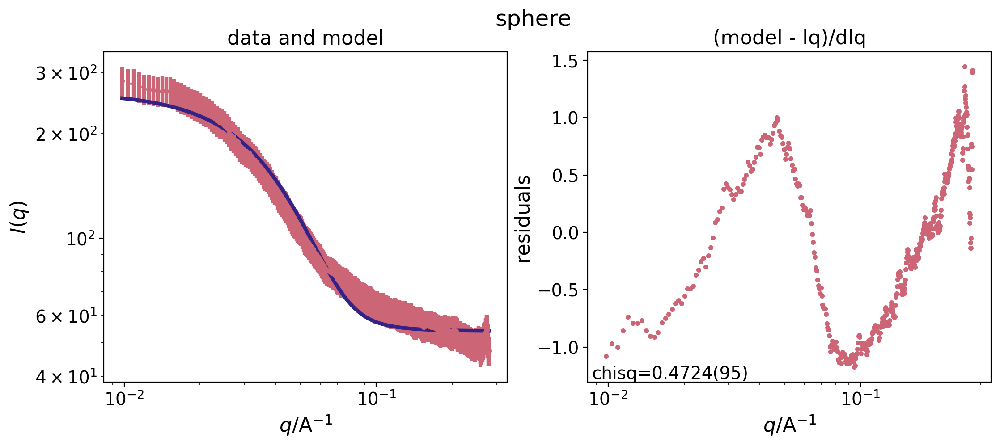

final chisq 0.1108(71)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 47.96(37)       48.0(11)       
                                  i_zero 306(11)         306(34)        
                                      rg 71.6(21)        71.6(64)       


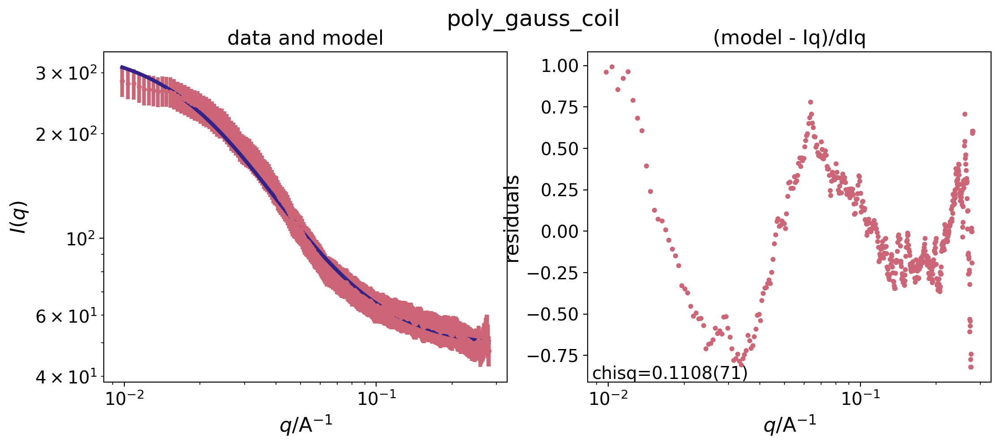

{'polymer_micelle': {'chisqr': 0.11862158887220765, 'params': {'background': {'fit_val': 51.26191710533702, 'fit_err': 0.33651727099765194}, 'radius_core': {'fit_val': 25.11092885186909, 'fit_err': 0.592856398898505}, 'rg': {'fit_val': 25.023338604920436, 'fit_err': 1.1139911578474297}, 'scale': {'fit_val': 443.39869316682183, 'fit_err': 14.251184357206578}}}, 'sphere': {'chisqr': 0.4723584876377592, 'params': {'background': {'fit_val': 54.02395829624757, 'fit_err': 0.29573452698296787}, 'radius': {'fit_val': 27.110829739580517, 'fit_err': 0.3749770020977716}, 'radius_pd': {'fit_val': 0.4999953518195687, 'fit_err': 1.129994816359275e-09}, 'scale': {'fit_val': 6.991313698259569, 'fit_err': 0.19851023223997516}}}, 'poly_gauss_coil': {'chisqr': 0.11083527080815436, 'params': {'background': {'fit_val': 47.9645823617007, 'fit_err': 0.37489087241278934}, 'i_zero': {'fit_val': 306.3145917291546, 'fit_err': 11.180067460766407}, 'rg': {'fit_val': 71.58886708436903, 'fit_err': 2.1287003087803082

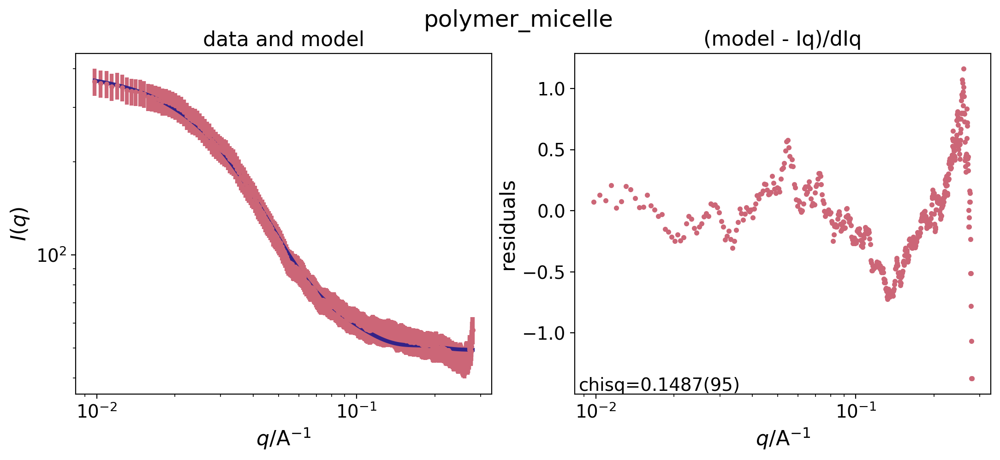

final chisq 0.4855(95)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 51.08(28)       51.08(40)      
                                  radius 29.27(34)       29.27(49)      
                               radius_pd 0.4999625484(11) 0.4999625484(16)
                                   scale 7.90(18)        7.90(26)       


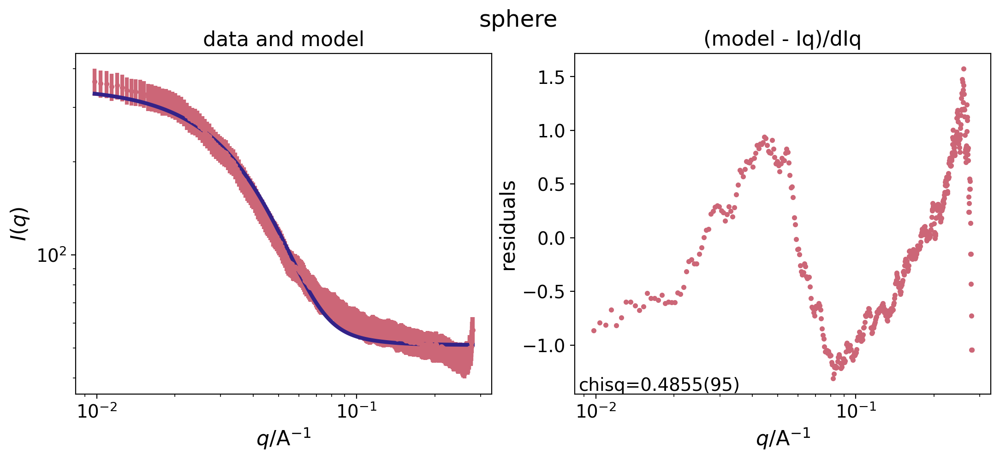

final chisq 0.2830(71)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 44.32(35)       44.32(66)      
                                  i_zero 468(18)         468(34)        
                                      rg 85.1(24)        85.1(45)       


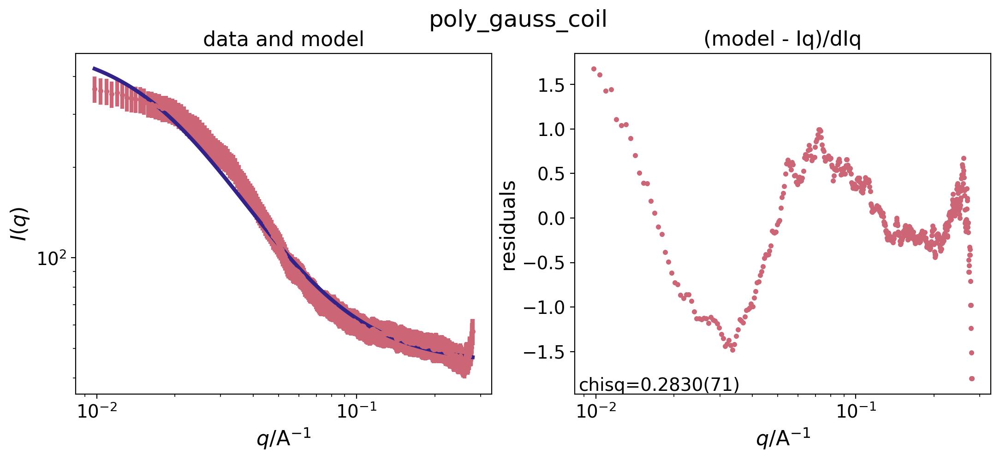

{'polymer_micelle': {'chisqr': 0.14871013748836195, 'params': {'background': {'fit_val': 48.279198800325275, 'fit_err': 0.29691270421475713}, 'radius_core': {'fit_val': 30.74722599087123, 'fit_err': 0.6064540551899993}, 'rg': {'fit_val': 22.720808672107264, 'fit_err': 1.0770447054465508}, 'scale': {'fit_val': 614.8512896442841, 'fit_err': 17.997762161582546}}}, 'sphere': {'chisqr': 0.4855044174424829, 'params': {'background': {'fit_val': 51.07955422459041, 'fit_err': 0.276930485648806}, 'radius': {'fit_val': 29.2721896705562, 'fit_err': 0.34142191379985276}, 'radius_pd': {'fit_val': 0.4999625483513483, 'fit_err': 1.1270322875188038e-09}, 'scale': {'fit_val': 7.896636250471412, 'fit_err': 0.180200831866602}}}, 'poly_gauss_coil': {'chisqr': 0.28300297508347677, 'params': {'background': {'fit_val': 44.31915305450627, 'fit_err': 0.34943688849585264}, 'i_zero': {'fit_val': 468.26342072225, 'fit_err': 17.90759351048217}, 'rg': {'fit_val': 85.13082515102266, 'fit_err': 2.4047508072029493}}}}


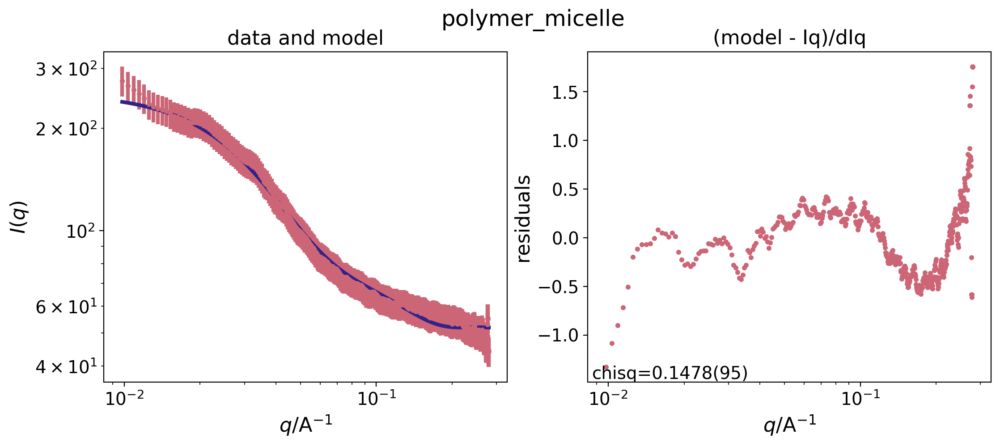

final chisq 0.5440(95)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 54.45(30)       54.45(41)      
                                  radius 25.99(40)       25.99(54)      
                               radius_pd 0.4999600351(11) 0.4999600351(15)
                                   scale 6.41(21)        6.41(28)       


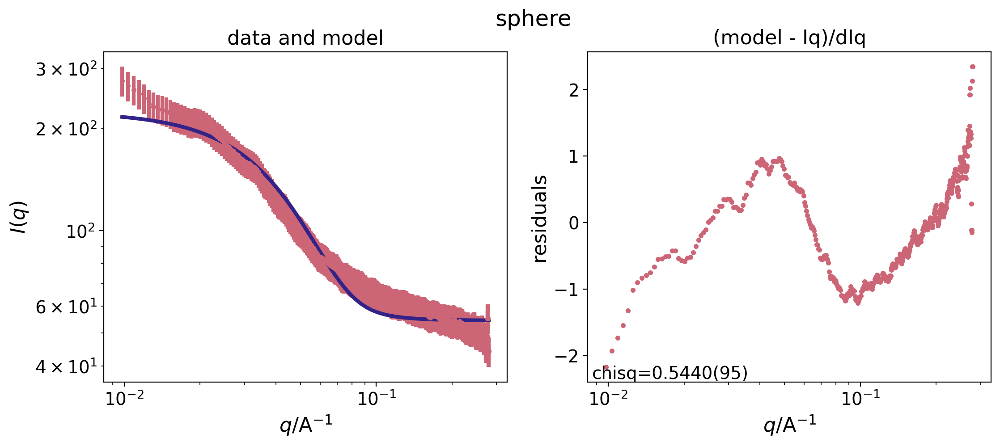

final chisq 0.1074(71)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 48.96(38)       49.0(12)       
                                  i_zero 243.8(90)       244(27)        
                                      rg 66.4(21)        66.4(64)       


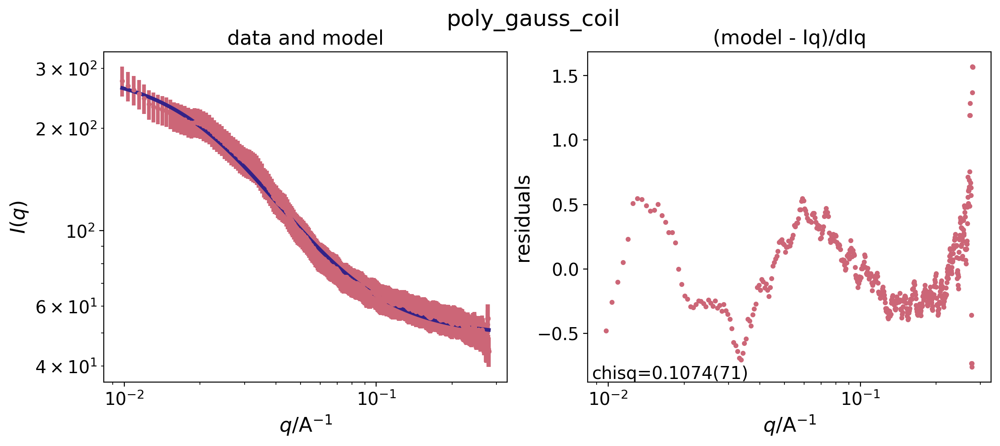

{'polymer_micelle': {'chisqr': 0.14775509718675228, 'params': {'background': {'fit_val': 51.25566122020729, 'fit_err': 0.3665924955334109}, 'radius_core': {'fit_val': 21.590025155394137, 'fit_err': 0.5765634598038334}, 'rg': {'fit_val': 26.222006047435876, 'fit_err': 1.1564378663524026}, 'scale': {'fit_val': 361.7881776965299, 'fit_err': 12.28247026926233}}}, 'sphere': {'chisqr': 0.5439870366670632, 'params': {'background': {'fit_val': 54.452004613441694, 'fit_err': 0.30047188325774976}, 'radius': {'fit_val': 25.990199054673106, 'fit_err': 0.39933177486047283}, 'radius_pd': {'fit_val': 0.4999600350528141, 'fit_err': 1.1313070671630636e-09}, 'scale': {'fit_val': 6.4090814354088, 'fit_err': 0.2071331959885092}}}, 'poly_gauss_coil': {'chisqr': 0.10736126394048574, 'params': {'background': {'fit_val': 48.96154615071574, 'fit_err': 0.3806582469855228}, 'i_zero': {'fit_val': 243.84693852599233, 'fit_err': 9.008618839592382}, 'rg': {'fit_val': 66.38106471470896, 'fit_err': 2.100809678425774}}

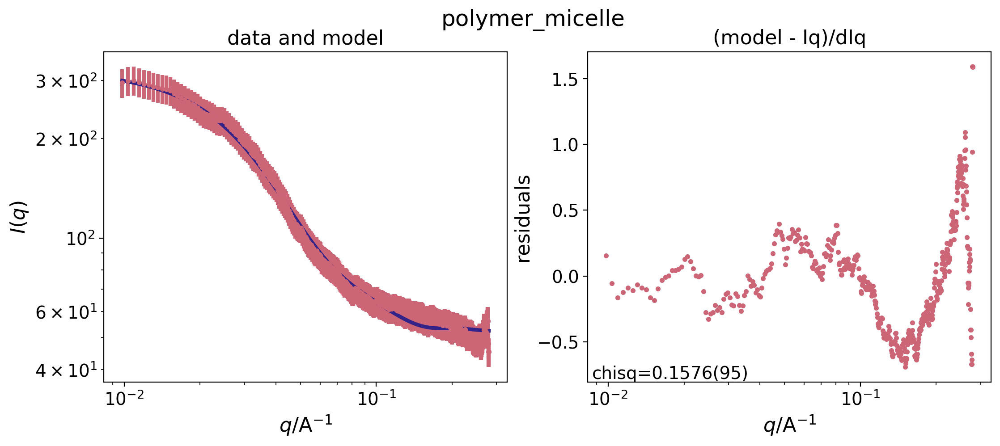

final chisq 0.4867(95)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 54.45(30)       54.45(43)      
                                  radius 27.69(37)       27.69(53)      
                               radius_pd 0.4999940122(11) 0.4999940122(16)
                                   scale 7.12(19)        7.12(28)       


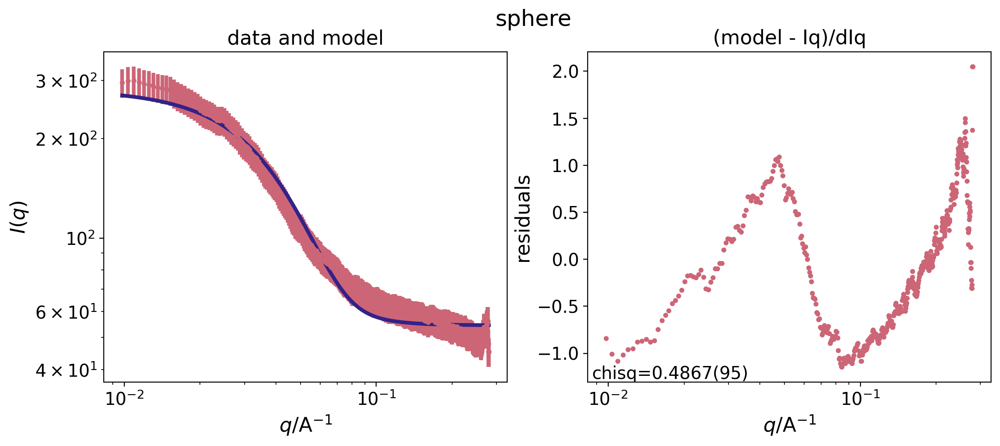

final chisq 0.1571(71)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 48.23(38)       48.23(95)      
                                  i_zero 338(13)         338(32)        
                                      rg 74.6(22)        74.6(56)       


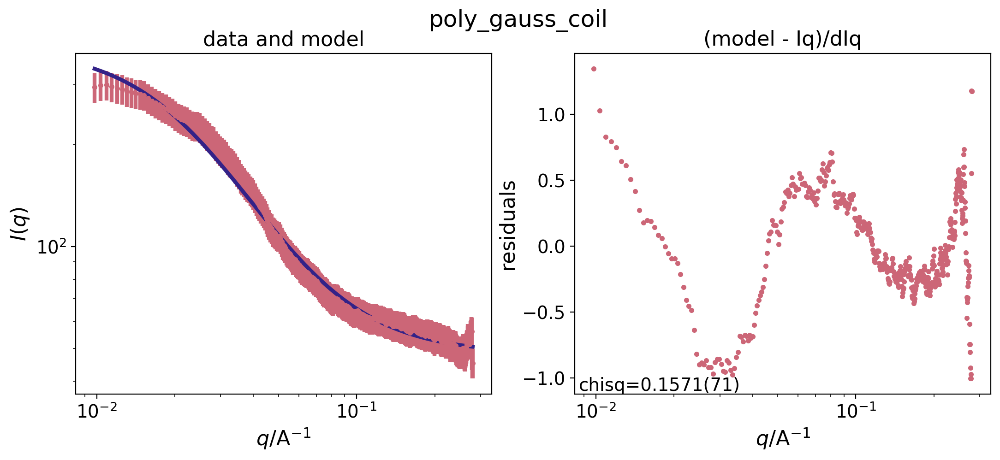

{'polymer_micelle': {'chisqr': 0.15757785517903528, 'params': {'background': {'fit_val': 51.80979601623273, 'fit_err': 0.3292865194795106}, 'radius_core': {'fit_val': 26.75322086932955, 'fit_err': 0.6146071095359035}, 'rg': {'fit_val': 24.34033683622104, 'fit_err': 1.1171423756898602}, 'scale': {'fit_val': 478.30278865694424, 'fit_err': 15.108231276758984}}}, 'sphere': {'chisqr': 0.4866585952768771, 'params': {'background': {'fit_val': 54.45081511844695, 'fit_err': 0.2977892406458395}, 'radius': {'fit_val': 27.68710438830064, 'fit_err': 0.37261515319676974}, 'radius_pd': {'fit_val': 0.49999401220978423, 'fit_err': 1.1313443177878386e-09}, 'scale': {'fit_val': 7.123774337668226, 'fit_err': 0.19471447245978502}}}, 'poly_gauss_coil': {'chisqr': 0.15710737809568284, 'params': {'background': {'fit_val': 48.226027483477495, 'fit_err': 0.3753019544932309}, 'i_zero': {'fit_val': 337.5511647253768, 'fit_err': 12.529547913970468}, 'rg': {'fit_val': 74.62481644934641, 'fit_err': 2.209251502496989

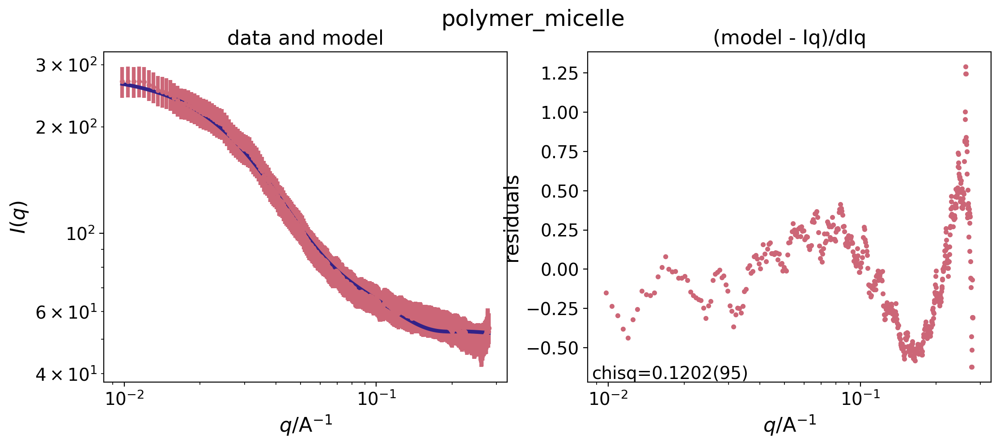

final chisq 0.4744(95)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 54.40(30)       54.40(43)      
                                  radius 26.85(39)       26.85(57)      
                               radius_pd 0.4999521669(11) 0.4999521669(16)
                                   scale 6.62(20)        6.62(29)       


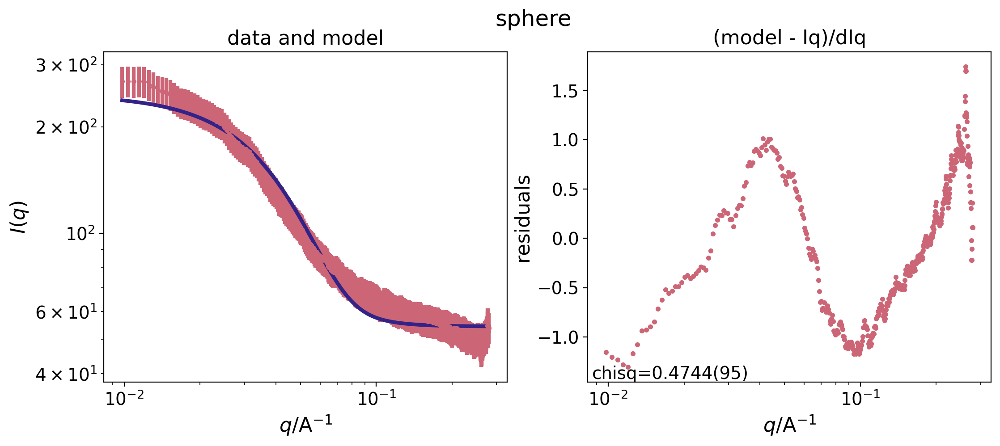

final chisq 0.0928(71)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 48.64(38)       48.6(12)       
                                  i_zero 282(10)         282(34)        
                                      rg 70.4(22)        70.4(71)       


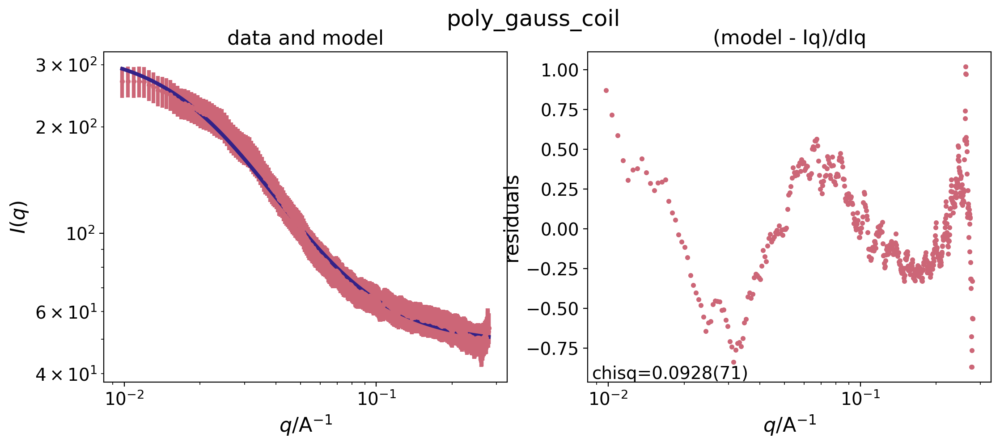

{'polymer_micelle': {'chisqr': 0.12017840864808073, 'params': {'background': {'fit_val': 51.602577009702486, 'fit_err': 0.34511252316306035}, 'radius_core': {'fit_val': 24.184411309234832, 'fit_err': 0.6003697152751823}, 'rg': {'fit_val': 25.640721723820743, 'fit_err': 1.150105960014419}, 'scale': {'fit_val': 411.3256007104082, 'fit_err': 13.65019208042721}}}, 'sphere': {'chisqr': 0.4744236259621585, 'params': {'background': {'fit_val': 54.397479865937306, 'fit_err': 0.2982788633560761}, 'radius': {'fit_val': 26.84904277014171, 'fit_err': 0.38949379278728546}, 'radius_pd': {'fit_val': 0.49995216690770805, 'fit_err': 1.12898696660308e-09}, 'scale': {'fit_val': 6.618989091271147, 'fit_err': 0.19869055494562407}}}, 'poly_gauss_coil': {'chisqr': 0.09284817647336695, 'params': {'background': {'fit_val': 48.638466719823846, 'fit_err': 0.37674478269161293}, 'i_zero': {'fit_val': 282.14715471374575, 'fit_err': 10.476125914767291}, 'rg': {'fit_val': 70.44963631526628, 'fit_err': 2.1656708225655

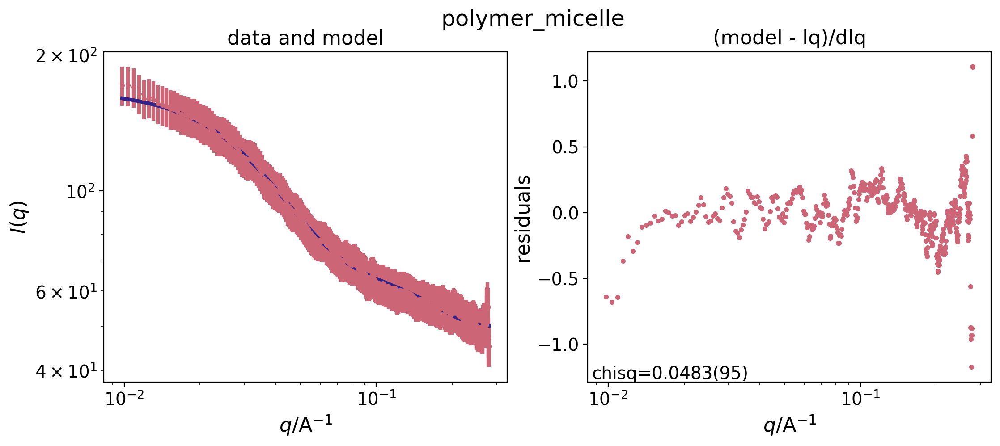

final chisq 0.3935(95)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 54.14(31)       54.14(49)      
                                  radius 22.40(46)       22.40(74)      
                               radius_pd 0.4999791343(11) 0.4999791343(18)
                                   scale 5.50(26)        5.50(41)       


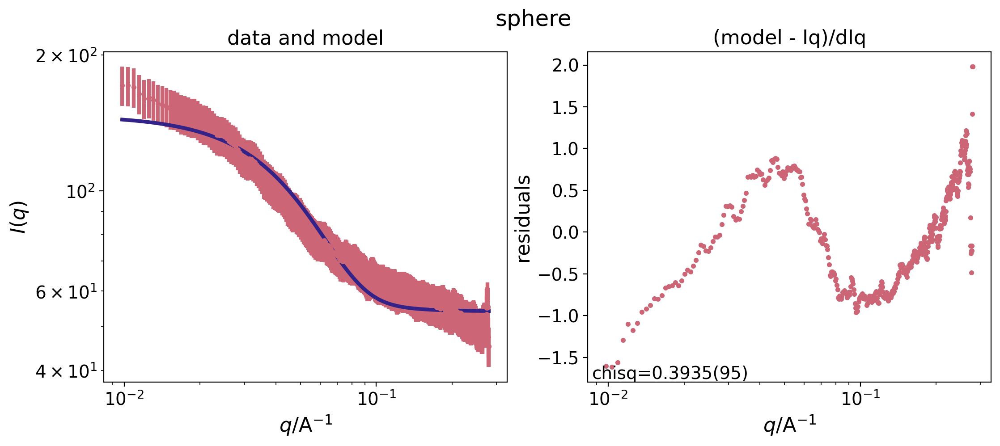

final chisq 0.0830(71)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 49.94(40)       49.9(14)       
                                  i_zero 124.9(47)       125(16)        
                                      rg 51.9(20)        51.9(68)       


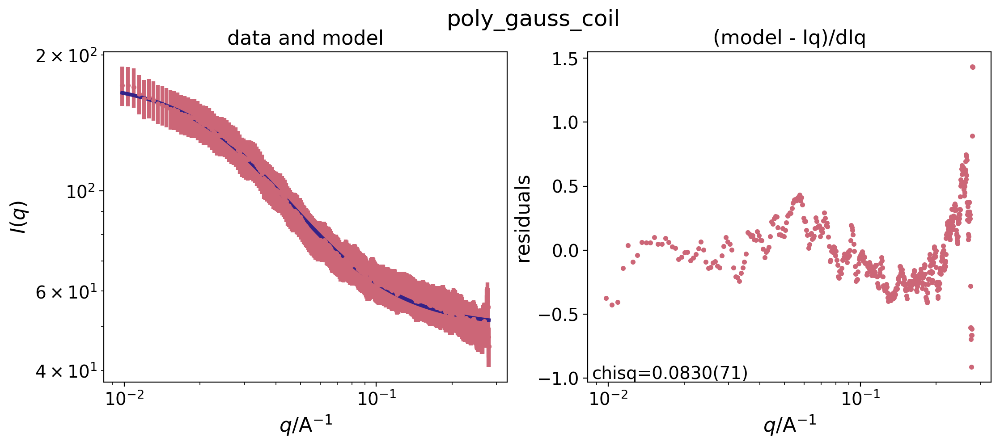

{'polymer_micelle': {'chisqr': 0.04830529807811013, 'params': {'background': {'fit_val': 49.95920857315003, 'fit_err': 0.7074592819208212}, 'radius_core': {'fit_val': 15.138803753833626, 'fit_err': 0.8863092618348297}, 'rg': {'fit_val': 25.402944246832316, 'fit_err': 1.1817613388978783}, 'scale': {'fit_val': 209.53185533540275, 'fit_err': 7.385810259316635}}}, 'sphere': {'chisqr': 0.3935446022378734, 'params': {'background': {'fit_val': 54.14183915794237, 'fit_err': 0.3099035980060409}, 'radius': {'fit_val': 22.402124265790945, 'fit_err': 0.46327269261112425}, 'radius_pd': {'fit_val': 0.4999791343213503, 'fit_err': 1.1334762196079e-09}, 'scale': {'fit_val': 5.499218911972557, 'fit_err': 0.25833286961004504}}}, 'poly_gauss_coil': {'chisqr': 0.08298879065121606, 'params': {'background': {'fit_val': 49.94328764128831, 'fit_err': 0.4011324576988165}, 'i_zero': {'fit_val': 124.93138368608093, 'fit_err': 4.650137862773174}, 'rg': {'fit_val': 51.85546656795026, 'fit_err': 1.9718262268469713}}

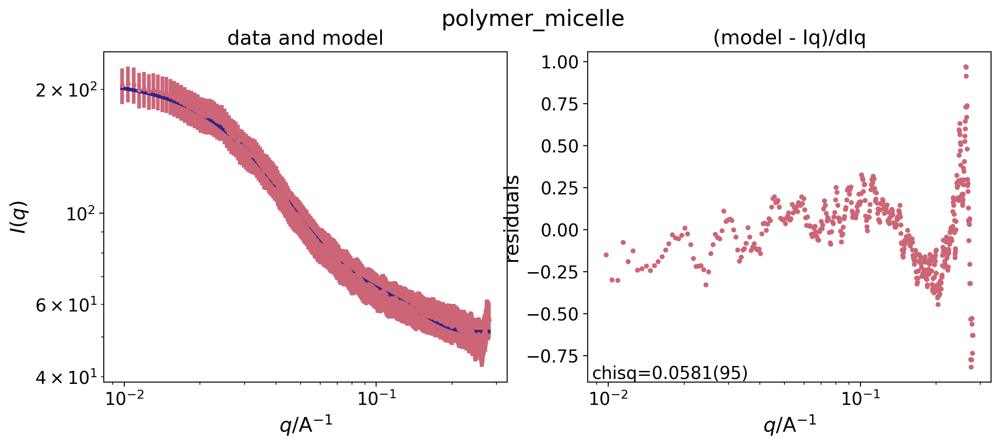

final chisq 0.4315(95)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 54.34(31)       54.34(47)      
                                  radius 23.45(40)       23.45(61)      
                               radius_pd 0.4999541919(11) 0.4999541919(17)
                                   scale 6.75(25)        6.75(38)       


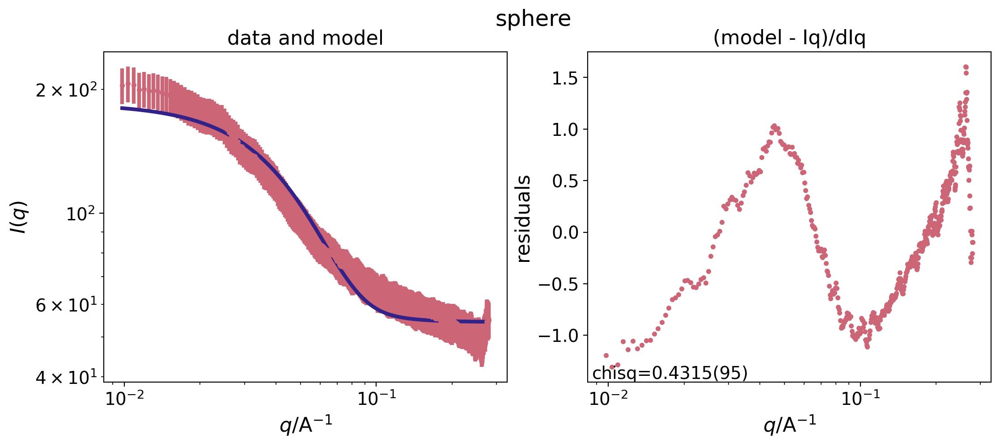

final chisq 0.0672(71)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 49.17(40)       49.2(15)       
                                  i_zero 180.4(63)       180(24)        
                                      rg 56.7(19)        56.7(72)       


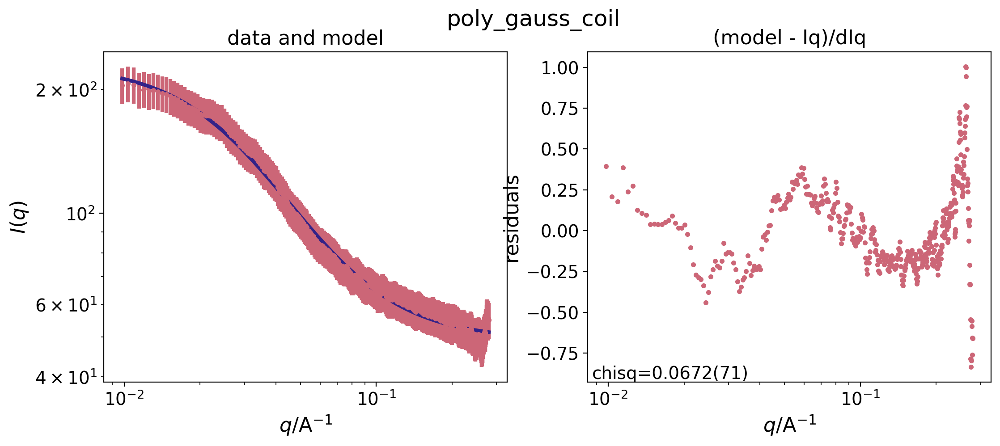

{'polymer_micelle': {'chisqr': 0.0580942814042382, 'params': {'background': {'fit_val': 50.97290579627655, 'fit_err': 0.4280405680118893}, 'radius_core': {'fit_val': 18.572145740279876, 'fit_err': 0.6069168685765309}, 'rg': {'fit_val': 24.799021277954143, 'fit_err': 1.094113080460152}, 'scale': {'fit_val': 286.85623465852115, 'fit_err': 9.529076355280841}}}, 'sphere': {'chisqr': 0.43150433043214353, 'params': {'background': {'fit_val': 54.344557719838555, 'fit_err': 0.3069783166098463}, 'radius': {'fit_val': 23.449309527204235, 'fit_err': 0.3987028670989938}, 'radius_pd': {'fit_val': 0.4999541918917478, 'fit_err': 1.1284826140618037e-09}, 'scale': {'fit_val': 6.745443443283295, 'fit_err': 0.2508491751731597}}}, 'poly_gauss_coil': {'chisqr': 0.06721595496302703, 'params': {'background': {'fit_val': 49.1724555616294, 'fit_err': 0.39799141054835563}, 'i_zero': {'fit_val': 180.40621146364907, 'fit_err': 6.286530976247203}, 'rg': {'fit_val': 56.66186112039287, 'fit_err': 1.853739674258628}}

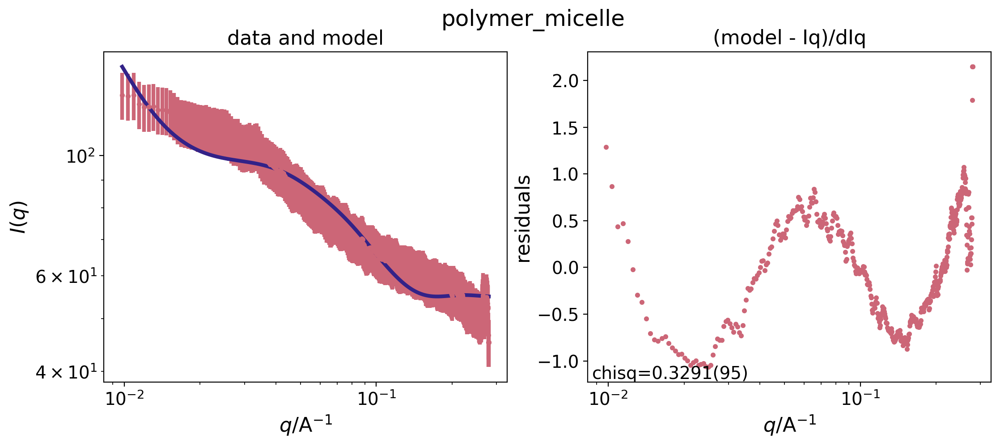

final chisq 0.2831(95)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 54.75(36)       54.75(68)      
                                  radius 16.08(41)       16.08(78)      
                               radius_pd 0.4999522290(11) 0.4999522290(21)
                                   scale 9.07(58)        9.1(11)        


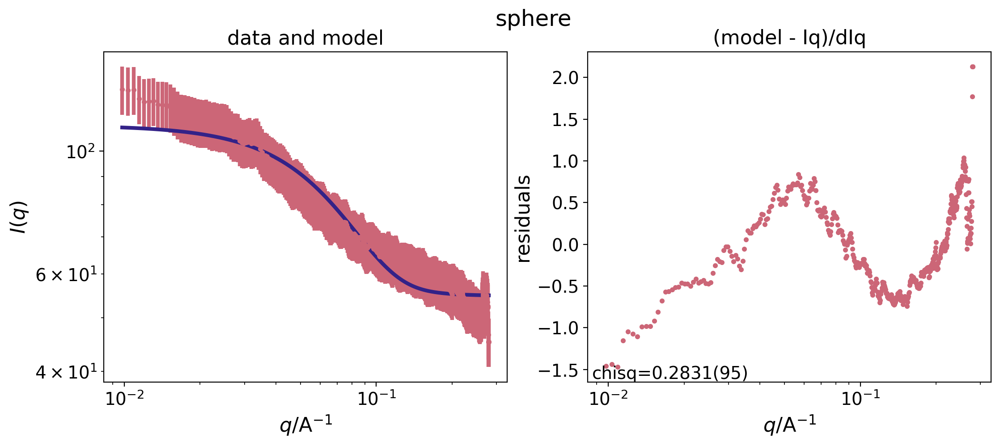

final chisq 0.0864(71)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 50.49(51)       50.5(17)       
                                  i_zero 72.2(24)        72.2(81)       
                                      rg 33.4(15)        33.4(50)       


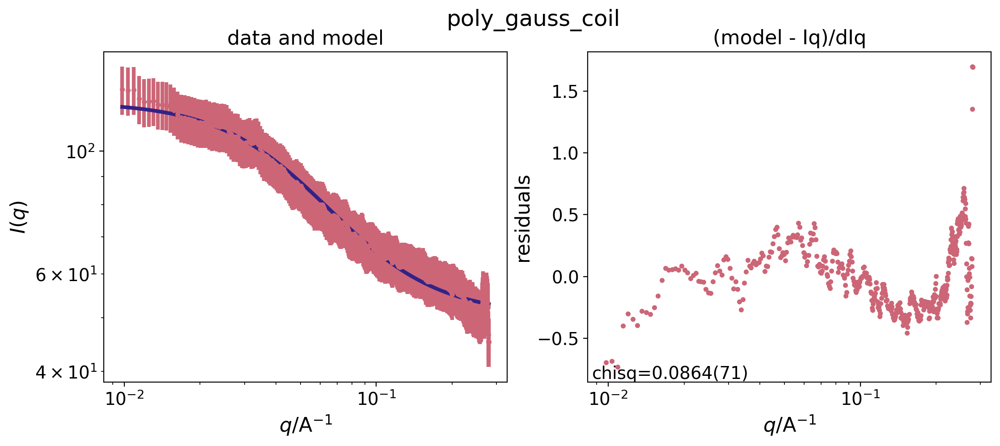

{'polymer_micelle': {'chisqr': 0.329144694048181, 'params': {'background': {'fit_val': 54.88918552723537, 'fit_err': 0.35072472546138056}, 'radius_core': {'fit_val': 25.793811769190736, 'fit_err': 0.6432928084827243}, 'rg': {'fit_val': 145.17757636118856, 'fit_err': 8.675146366521153}, 'scale': {'fit_val': 456.80777348815417, 'fit_err': 14.905535195634588}}}, 'sphere': {'chisqr': 0.28308650150859077, 'params': {'background': {'fit_val': 54.75253865131707, 'fit_err': 0.3598181325321119}, 'radius': {'fit_val': 16.076971965402873, 'fit_err': 0.4133393867288956}, 'radius_pd': {'fit_val': 0.49995222896539837, 'fit_err': 1.138645923291346e-09}, 'scale': {'fit_val': 9.071448445587396, 'fit_err': 0.5833780163048538}}}, 'poly_gauss_coil': {'chisqr': 0.08637762797770765, 'params': {'background': {'fit_val': 50.4852085211595, 'fit_err': 0.5105113411133709}, 'i_zero': {'fit_val': 72.24471314490923, 'fit_err': 2.367342695380322}, 'rg': {'fit_val': 33.394112950615785, 'fit_err': 1.471707084975993}}}

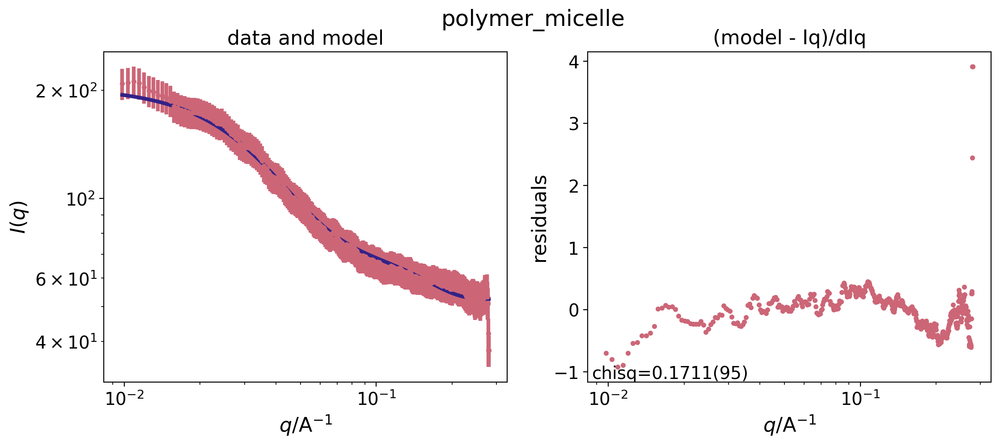

final chisq 0.5671(95)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 56.50(32)       56.50(42)      
                                  radius 23.83(43)       23.83(57)      
                               radius_pd 0.4999673613(11) 0.4999673613(15)
                                   scale 6.15(24)        6.15(33)       


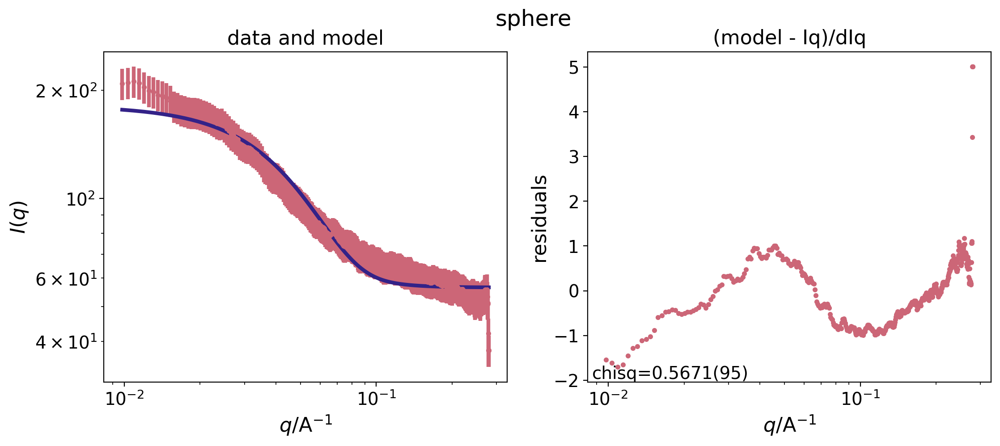

final chisq 0.1807(71)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 51.55(41)       51.55(96)      
                                  i_zero 172.7(63)       173(15)        
                                      rg 57.3(20)        57.3(47)       


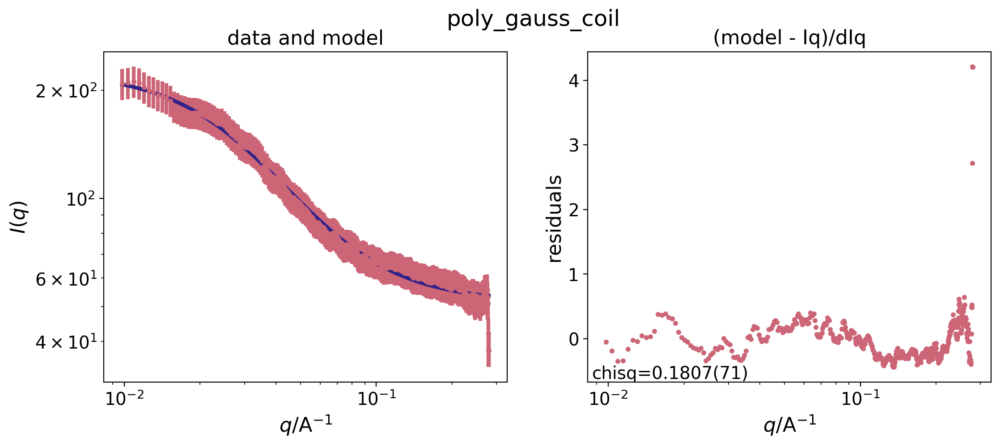

{'polymer_micelle': {'chisqr': 0.17109478904318604, 'params': {'background': {'fit_val': 52.1208690787137, 'fit_err': 0.5405620973275982}, 'radius_core': {'fit_val': 16.73302534280633, 'fit_err': 0.6607152248612311}, 'rg': {'fit_val': 25.91005232438233, 'fit_err': 1.1404126495934566}, 'scale': {'fit_val': 271.22550741363364, 'fit_err': 9.289522085546064}}}, 'sphere': {'chisqr': 0.5670666862748225, 'params': {'background': {'fit_val': 56.50429785073404, 'fit_err': 0.31958740987138934}, 'radius': {'fit_val': 23.82557932189145, 'fit_err': 0.43099795283274706}, 'radius_pd': {'fit_val': 0.49996736131479574, 'fit_err': 1.1360645963458727e-09}, 'scale': {'fit_val': 6.149343477882222, 'fit_err': 0.2447889506675674}}}, 'poly_gauss_coil': {'chisqr': 0.18069088395265928, 'params': {'background': {'fit_val': 51.5505008049706, 'fit_err': 0.4079812321220279}, 'i_zero': {'fit_val': 172.66609015433718, 'fit_err': 6.320653001208452}, 'rg': {'fit_val': 57.281417508990145, 'fit_err': 1.982658904460707}}}

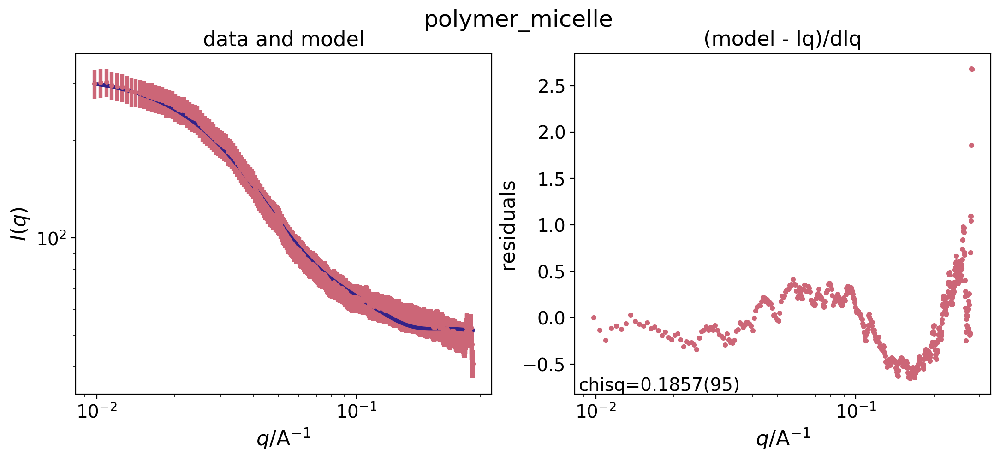

final chisq 0.5905(95)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 54.20(30)       54.20(39)      
                                  radius 26.60(35)       26.60(46)      
                               radius_pd 0.4999678919(11) 0.4999678919(15)
                                   scale 7.99(21)        7.99(28)       


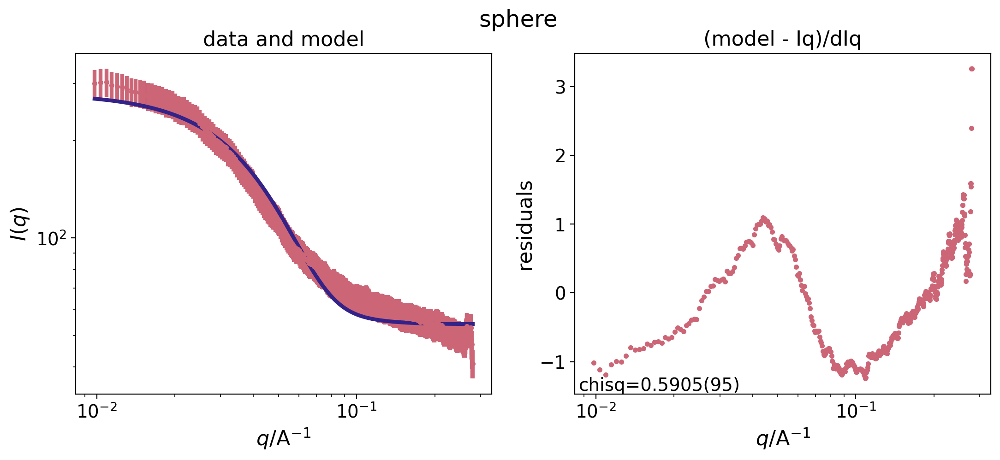

final chisq 0.1570(71)
=== Uncertainty from curvature:     name value(unc.)     value(unc./chi)) ===
                              background 47.62(38)       47.62(96)      
                                  i_zero 332(12)         332(29)        
                                      rg 70.5(20)        70.5(51)       


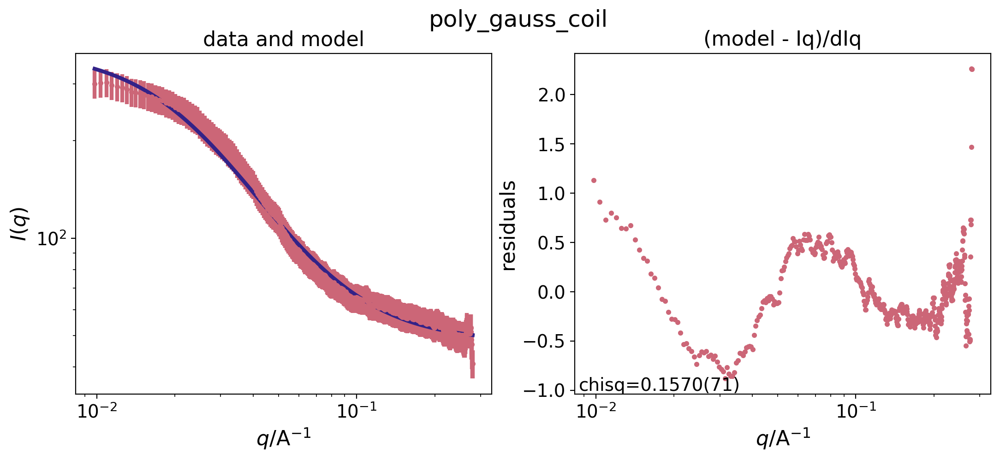

{'polymer_micelle': {'chisqr': 0.1856842043909583, 'params': {'background': {'fit_val': 51.19169587477239, 'fit_err': 0.34041508911314755}, 'radius_core': {'fit_val': 24.63706564648923, 'fit_err': 0.5475231710756875}, 'rg': {'fit_val': 24.60378620106165, 'fit_err': 1.0419445385937935}, 'scale': {'fit_val': 478.78716033904044, 'fit_err': 14.844848261614363}}}, 'sphere': {'chisqr': 0.5905123621451608, 'params': {'background': {'fit_val': 54.202645010302035, 'fit_err': 0.29959046763298847}, 'radius': {'fit_val': 26.595930276274494, 'fit_err': 0.35079844528047344}, 'radius_pd': {'fit_val': 0.49996789189857016, 'fit_err': 1.1309094911827481e-09}, 'scale': {'fit_val': 7.985885359980943, 'fit_err': 0.2149931186063902}}}, 'poly_gauss_coil': {'chisqr': 0.15698437113696798, 'params': {'background': {'fit_val': 47.61802088338626, 'fit_err': 0.3810670546079185}, 'i_zero': {'fit_val': 331.8701251854695, 'fit_err': 11.67422135313874}, 'rg': {'fit_val': 70.48720701716856, 'fit_err': 2.003093744891709

In [7]:
import glob
# fps = list(glob.glob('reduced_data/latex*_1_r1d.csv'))

# fig,ax = plt.subplots()
# for fname in fps[::25]:
#     # print(fname)
#     rawdata = np.genfromtxt(fname, delimiter='   ',skip_header=23)
fit_method = {'method':'lm',
              'steps':1000,
              'ftol': 1.5e-6,
              'xtol': 1.5e-6,
              'verbose':True
             }
all_model_results = []
for idx, rawdata in enumerate(ds_AL['SAS']):
    # q = rawdata[:,0][6:-125]
    # I = rawdata[:,1][6:-125]
    q = ds_AL.q.values#[:-25]
    I = rawdata.values#[:-25]
    dI = 0.1 * I
    # ax.loglog(q,I,alpha=0.1)
    data = sasmodels.data.Data1D(x=q,y=I,dy=dI)

    q_min = min(q)
    q_max = max(q)
    num_q = 1000
    q_fit = np.logspace(np.log10(q_min), np.log10(q_max), num_q)
    empty_data = sasmodels.data.empty_data1D(q_fit)


    #dict of possible models and close starting points and boundaries for the bumps fitting
    kernels = {
        "polymer_micelle":{
            "scale"       : {'value':2*max(I), 'bounds':(1e-1,1e4)},
            "background"  : {'value':50,       'bounds':(1e-1,1e4)},
            "radius_core" : {'value':40,       'bounds':(1e-1,1e4)},
            "rg"          : {'value':60,       'bounds':(1e-1,1e4)},
            "sld_core"    : {'value':5.45,     'bounds':None},
            "sld_corona"  : {'value':5.15,     'bounds':None},
            "sld_solvent" : {'value':6.36,     'bounds':None},
        },
        # "guinier_porod":{
        #     "scale"       : {"value" : 2*max(I),  'bounds': (1e-10,1e10)},
        #     "background"  : {"value" : 16 ,  'bounds': (1e-1,1e2)},
        #     "rg"          : {"value" :60 ,  'bounds': (1e0,1e2)},
        #     "s"           : {"value" : 0 ,  'bounds': None},#(0.5,1.5)},
        #     "porod_exp"   : {"value" : 4 ,  'bounds': (2.5,4.5)}
        # },
        "sphere":{
            "scale"       : {'value':max(I),   'bounds':(1e-1,1e4)},
            "background"  : {'value':20,       'bounds':(1e1,1e2)},
            "radius"      : {'value':50,       'bounds':(1e-1,1e3)},
            "radius_pd"   : {'value':0.15,       'bounds':(0.02,0.5)},
            "radius_pd_type": {'value':'gaussian','bounds':None},
            "radius_pd_n": {'value':15,'bounds':None},
            "sld"         : {'value':5.45,     'bounds':None},
            "sld_solvent" : {'value':6.36,     'bounds':None},
        },
        "poly_gauss_coil": {
            "i_zero"      : {'value':max(I),   'bounds':(1e-1,1e4)},
            "background"  : {'value':40,       'bounds':(1e-1,1e4)},
            "rg"          : {'value':60,       'bounds':(1e-1,1e4)},
            # "polydispersity": {'value':1,       'bounds':(0.5,2)}
        },
        
        # "power_law": {
        #     "scale"         : {'value':max(I)*1e-7,       'bounds':(1e-4,1e1)},
        #     "background"  : {'value':1e-6,       'bounds':(1e-10,1e1)},
        #     "power"      : {'value':4,      'bounds':(2,4)},
        #     # "sld"         : {'value':5.45,     'bounds':None},
        #     # "sld_solvent" : {'value':6.36,     'bounds':None},
        # }
    }

    #plotting and model instantiation
    model_results = {}
    for kern in kernels:
        #instantiate the sas kernel and specify the resolution
        kernel = sasmodels.core.load_model(kern)
        call_kernel= sasmodels.direct_model.DirectModel(empty_data, kernel)
        call_kernel.resolution = sasmodels.resolution.Pinhole1D(empty_data.x, empty_data.x*0.15)

        #pull the parameters from the initialization dictionary and create a model
        params = {}
        for key in kernels[kern]:
            params[key] = kernels[kern][key]['value']
        model = sasmodels.bumps_model.Model(kernel, **params)

        #augment the bounds. clunky but it works
        for key in kernels[kern]:
            # print(key)
            bounds = kernels[kern][key]['bounds']
            if bounds != None:
                model.parameters()[key].fixed = False
                model.parameters()[key].bounds = bumps.bounds.Bounded(bounds[0],bounds[1])

        experiment = sasmodels.bumps_model.Experiment(data=data, model=model)
        problem = bumps.fitproblem.FitProblem(experiment)
        results = bumps.fitters.fit(problem, **fit_method)
        # results = bumps.fitters.fit(problem, method='lm', steps=10000, ftol=1.5e-6, xtol=1.5e-6, verbose=True)
        model_results[kern] = {}
        model_results[kern]['chisqr'] = problem.chisq()
        model_results[kern]['params'] = {}
        for jdx, param in enumerate(problem.labels()):
            model_results[kern]['params'][param]  = {}
            model_results[kern]['params'][param]['fit_val'] = results.x[jdx]
            model_results[kern]['params'][param]['fit_err'] = results.dx[jdx]
        
        
        #initial guess
        # Iq = call_kernel(**params)
        # ax.loglog(q_fit,Iq,label=kern)
        fig1,ax1 =plt.subplots(1,figsize=(12.8,4.8))
        ax1.loglog(q,I,label='raw')
        problem.plot()
        ax1.legend()
        fig1.suptitle(kern)
        plt.show()
        plt.close()
    print(model_results)   
    all_model_results.append(model_results)
    print("BA, Ph")
    print(np.round(ds_AL.benzyl_alcohol_solute.values[idx],2), np.round(ds_AL.phenol_solute.values[idx],2))
    print()
    print('next model')
    print()
    # ax.legend()


In [21]:
model_ID = []
best_chisqr = []
best_model_ID = []
best_model_idx = []
for model in list(all_model_results):
    a = list(model)
    b = []
    for kern in list(model):
        # print(kern)
        # print(model[kern])
        model_ID.append(kern)
        b.append(model[kern]['chisqr'])
    
    idx = np.nanargmin(b)
    best_chisqr.append(b[idx])
    best_model_ID.append(a[idx])
    best_model_idx.append(idx)
    # print(a[idx])
    # print(b[idx])
    # print()
print(len(best_chisqr),len(best_model_ID))

33 33


[<matplotlib.lines.Line2D object at 0x29e84efa0>, <matplotlib.lines.Line2D object at 0x29e84eb80>, <matplotlib.lines.Line2D object at 0x29e84e100>] ['$\\mathdefault{0}$', '$\\mathdefault{1}$', '$\\mathdefault{2}$']


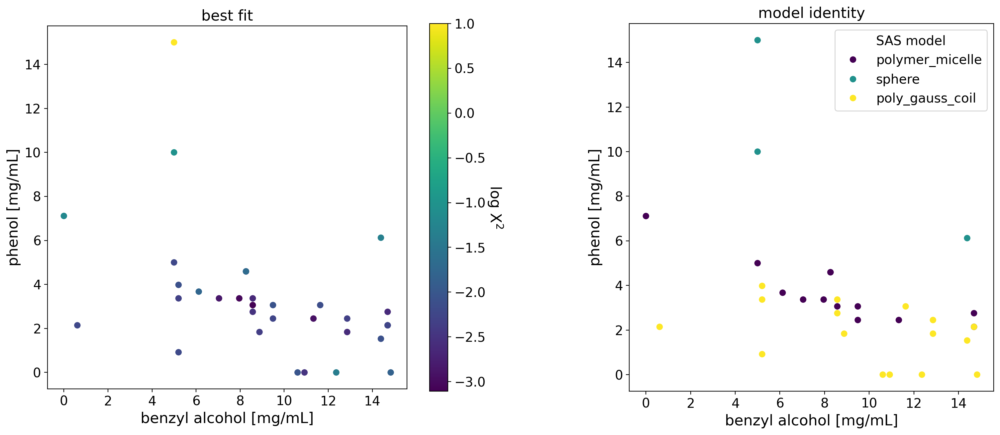

In [25]:
all_chisqr = np.log(np.array([model[kern]['chisqr'] for model in list(all_model_results) for kern in list(model)]).reshape(33,3))
X = np.vstack((ds_AL.benzyl_alcohol_solute.values, ds_AL.phenol_solute.values)).T

fig,ax = plt.subplots(1,2,figsize=(19.2,7.2))
# sp = ax[0].scatter(X[:,0],X[:,1],c=np.min(all_chisqr,axis=1))
sp = ax[0].scatter(X[:,0],X[:,1],c=np.log(best_chisqr))

cb = plt.colorbar(sp, ax=ax[0])
cb.set_label(rotation=270,label='log Χ$^{2}$',labelpad=20)
labels = np.argmax(all_chisqr,axis=1)
min_chisqr = [min(row) for row in all_chisqr]
# sp = ax[1].scatter(X[:,0],X[:,1],c=labels)
sp = ax[1].scatter(X[:,0],X[:,1],c=best_model_idx)
ax[0].set(
    xlabel='benzyl alcohol [mg/mL]',
    ylabel='phenol [mg/mL]',
    title='best fit',
    aspect='equal'
)
ax[1].set(
    xlabel='benzyl alcohol [mg/mL]',
    ylabel='phenol [mg/mL]',
    title='model identity',
    aspect='equal'
)
handles,labels = sp.legend_elements()
print(handles,labels)
# ax[1].legend(handles=handles, labels=['unimer', 'micelle' ,'sphere'],title="SAS model")
ax[1].legend(handles=handles, labels=list(model),title="SAS model")
# plt.savefig('SINQ-SANS1_SANS_fitting-labeling.png',dpi=300)
# plt.savefig('SINQ-SANS1_SANS_fitting-labeling.svg',dpi=300)

In [ ]:
all_model_results[0]

In [ ]:
problem.labels()

# try fitting all 4 possible models
Unified power law, spherical, polymer micelle,  gaussian 

In [ ]:
#pre model params
prefit_params = model.__dict__
augmented = prefit_params
for key in kernels[kern]:
    print(key)
augmented['background'].__dict__['limits'] = (1e-2, 50)
augmented['background'].__dict__

In [281]:
model.rg.range()

TypeError: 'Unbounded' object is not callable

## design of the persistent config for augmenting the parallel model fitting

This will get instantiated in the cell before spawning the server, but 

In [ ]:
kernels = [
    {
        "name":"big_polymer_micelle"
        "sasmodel":'polymer_micelle',
        "parameters":{
            "scale"       : {'value':2*max(I), 'bounds':(1e-1,1e4), 'bounds_type':'Normal'},
            "background"  : {'value':50,       'bounds':(0,1e4)},
            "radius_core" : {'value':40,       'bounds':(1e-1,1e4)},
            "rg"          : {'value':60,       'bounds':(1e-1,1e4)},
            "sld_core"    : {'value':5.45,     'bounds':(1e-1,1e4)},
            "sld_corona"  : {'value':5.15,     'bounds':(1e-1,1e4)},
            "sld_solvent" : {'value':6.36,     'bounds':(1e-1,1e4)},
        }
    }
]
    "sphere":{
        "scale"       : {'value':5e-2*max(I), 'bounds':(1e-1,1e4)},
        "background"  : {'value':50,       'bounds':(0,1e4)},
        "radius"      : {'value':45,       'bounds':(1e-1,1e4)},
        "sld"         : {'value':5.45,     'bounds':(1e-1,1e4)},
        "sld_solvent" : {'value':6.36,     'bounds':(1e-1,1e4)},
    },
    "poly_gauss_coil": {
        "i_zero"      : {'value':max(I),   'bounds':(1e-1,1e4)},
        "background"  : {'value':40,       'bounds':(1e-1,1e4)},
        "rg"          : {'value':60,       'bounds':(1e-1,1e4)},
        "polydispersity": {'value':1,       'bounds':(1e-1,1e4)},
    },
    "unified_power_Rg": {
        "rg1"         : {'value':45,       'bounds':(1e-1,1e4)},
        "power1"      : {'value':3.4,      'bounds':(1e-1,1e4)},
        "background"  : {'value':50,       'bounds':(1e-1,1e4)},
    }
}